
# **BISMILLAH FINAL PROJECT**

### **Step 1 : Collecting Dataset**

Dataset Collected
1. Energy Consumption Sector Industry, Household, and Commercial. Source : HANDBOOK OF ENERGY & ECONOMIC STATISTICS OF INDONESIA (2016,2019,& 2024)
2. Emisson CO2. Source : www.ourworldindata.org
3. Emission Greenhouse. Source : www.ourworldindata.org
4. Change Surface Temperature. Source : International Monetary Fund (IMF) climate data

### **Step 2 : Preprocessing Dataset**

### 1. Panggil Library yang akan digunakan

In [ ]:
!pip install optuna

In [ ]:
!pip install pyinform

In [ ]:
# ==============================================================================
# 1. CORE & UTILITIES
# ==============================================================================
import sys
import io
import time
import math
import itertools
import logging
import warnings
from IPython.display import Markdown, display
import numpy as np
import pandas as pd
import pyinform
from scipy.stats import boxcox, yeojohnson
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import matplotlib.ticker as mtick
from matplotlib.ticker import FuncFormatter, MaxNLocator
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Dense, LSTM, GRU, SimpleRNN,
    Dropout, RepeatVector, TimeDistributed
)
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, Nadam, RMSprop
import optuna


warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)
tf.get_logger().setLevel(logging.ERROR)

### 2. Data Energi Sektor Industri

In [ ]:
industri= pd.read_csv("KonsumsiEnergiIndustri2.csv",delimiter=';')
industri

,Year,Coal and coal products,Natural gas,Biofuels and waste,Electricity,Oil and oil products
0,1990,61881,80811,303274,52354,231873
1,1991,67563,65717,314200,57693,234142
2,1992,72705,70786,322533,63918,243716
3,1993,77301,68989,330395,70383,279413
4,1994,82752,107559,338427,80874,319465
5,1995,89431,113142,342704,89002,428311
6,1996,83029,105474,346791,100616,444160
7,1997,86727,135167,350718,113187,470639
8,1998,95346,103354,354359,100746,438361
9,1999,143203,185030,357998,112816,497496


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(industri.columns) + 1),
    "Variable": industri.columns
})

df_vars

,No,Variable
0,1,Year
1,2,Coal and coal products
2,3,Natural gas
3,4,Biofuels and waste
4,5,Electricity
5,6,Oil and oil products


In [ ]:
industri.insert(loc=1, column='Sector', value='Industri')
industri

,Year,Sector,Coal and coal products,Natural gas,Biofuels and waste,Electricity,Oil and oil products
0,1990,Industri,61881,80811,303274,52354,231873
1,1991,Industri,67563,65717,314200,57693,234142
2,1992,Industri,72705,70786,322533,63918,243716
3,1993,Industri,77301,68989,330395,70383,279413
4,1994,Industri,82752,107559,338427,80874,319465
5,1995,Industri,89431,113142,342704,89002,428311
6,1996,Industri,83029,105474,346791,100616,444160
7,1997,Industri,86727,135167,350718,113187,470639
8,1998,Industri,95346,103354,354359,100746,438361
9,1999,Industri,143203,185030,357998,112816,497496


In [ ]:
# Missing Values
industri = industri.replace('n.a', np.nan).fillna(0)
industri

,Year,Sector,Coal and coal products,Natural gas,Biofuels and waste,Electricity,Oil and oil products
0,1990,Industri,61881,80811,303274,52354,231873
1,1991,Industri,67563,65717,314200,57693,234142
2,1992,Industri,72705,70786,322533,63918,243716
3,1993,Industri,77301,68989,330395,70383,279413
4,1994,Industri,82752,107559,338427,80874,319465
5,1995,Industri,89431,113142,342704,89002,428311
6,1996,Industri,83029,105474,346791,100616,444160
7,1997,Industri,86727,135167,350718,113187,470639
8,1998,Industri,95346,103354,354359,100746,438361
9,1999,Industri,143203,185030,357998,112816,497496


### 3. Data Energi Sektor Rumah Tangga

In [ ]:
rumahtangga= pd.read_csv("KonsumsiEnergiRumahTangga2.csv",delimiter=';')
rumahtangga

,Year,Oil products,Natural gas,Biofuels and waste,Electricity
0,1990,257809,224,525585,32756
1,1991,265171,230,523776,37173
2,1992,276981,230,521998,42015
3,1993,274334,235,520978,47465
4,1994,281041,282,516284,54583
5,1995,298626,333,513134,65232
6,1996,316554,391,509528,70383
7,1997,321015,426,497945,81777
8,1998,332682,437,485212,89481
9,1999,392723,426,475180,96789


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(rumahtangga.columns) + 1),
    "Variable": rumahtangga.columns
})

df_vars

,No,Variable
0,1,Year
1,2,Oil products
2,3,Natural gas
3,4,Biofuels and waste
4,5,Electricity


In [ ]:
rumahtangga.insert(loc=1, column='Sector', value='Rumah Tangga')
rumahtangga

,Year,Sector,Oil products,Natural gas,Biofuels and waste,Electricity
0,1990,Rumah Tangga,257809,224,525585,32756
1,1991,Rumah Tangga,265171,230,523776,37173
2,1992,Rumah Tangga,276981,230,521998,42015
3,1993,Rumah Tangga,274334,235,520978,47465
4,1994,Rumah Tangga,281041,282,516284,54583
5,1995,Rumah Tangga,298626,333,513134,65232
6,1996,Rumah Tangga,316554,391,509528,70383
7,1997,Rumah Tangga,321015,426,497945,81777
8,1998,Rumah Tangga,332682,437,485212,89481
9,1999,Rumah Tangga,392723,426,475180,96789


In [ ]:
#Mengelola Missing Values
rumahtangga = rumahtangga.replace('n.a', np.nan).fillna(0)
rumahtangga

,Year,Sector,Oil products,Natural gas,Biofuels and waste,Electricity
0,1990,Rumah Tangga,257809,224,525585,32756
1,1991,Rumah Tangga,265171,230,523776,37173
2,1992,Rumah Tangga,276981,230,521998,42015
3,1993,Rumah Tangga,274334,235,520978,47465
4,1994,Rumah Tangga,281041,282,516284,54583
5,1995,Rumah Tangga,298626,333,513134,65232
6,1996,Rumah Tangga,316554,391,509528,70383
7,1997,Rumah Tangga,321015,426,497945,81777
8,1998,Rumah Tangga,332682,437,485212,89481
9,1999,Rumah Tangga,392723,426,475180,96789


### 4. Data Energi Sektor Komersial

In [ ]:
komersial= pd.read_csv("KonsumsiEnergiKomersial2.csv",delimiter=';')
komersial

,Year,Oil products,Natural gas,Biofuels and waste,Electricity
0,1990,13406,530,2727,16725
1,1991,16507,593,4002,18468
2,1992,20742,674,5685,19936
3,1993,26023,755,7681,22410
4,1994,28380,990,8543,25351
5,1995,36247,990,9334,24861
6,1996,39007,1117,10234,33955
7,1997,40268,1197,10826,37105
8,1998,39359,1071,8970,44712
9,1999,44391,1117,8919,47199


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(komersial.columns) + 1),
    "Variable": komersial.columns
})

df_vars

,No,Variable
0,1,Year
1,2,Oil products
2,3,Natural gas
3,4,Biofuels and waste
4,5,Electricity


In [ ]:
komersial.insert(loc=1, column='Sector', value='Komersial')
komersial

,Year,Sector,Oil products,Natural gas,Biofuels and waste,Electricity
0,1990,Komersial,13406,530,2727,16725
1,1991,Komersial,16507,593,4002,18468
2,1992,Komersial,20742,674,5685,19936
3,1993,Komersial,26023,755,7681,22410
4,1994,Komersial,28380,990,8543,25351
5,1995,Komersial,36247,990,9334,24861
6,1996,Komersial,39007,1117,10234,33955
7,1997,Komersial,40268,1197,10826,37105
8,1998,Komersial,39359,1071,8970,44712
9,1999,Komersial,44391,1117,8919,47199


In [ ]:
#Mengelola Missing Values
komersial = komersial.replace('n.a', np.nan).fillna(0)
komersial

,Year,Sector,Oil products,Natural gas,Biofuels and waste,Electricity
0,1990,Komersial,13406,530,2727,16725
1,1991,Komersial,16507,593,4002,18468
2,1992,Komersial,20742,674,5685,19936
3,1993,Komersial,26023,755,7681,22410
4,1994,Komersial,28380,990,8543,25351
5,1995,Komersial,36247,990,9334,24861
6,1996,Komersial,39007,1117,10234,33955
7,1997,Komersial,40268,1197,10826,37105
8,1998,Komersial,39359,1071,8970,44712
9,1999,Komersial,44391,1117,8919,47199


### 5. Data Emsisi CO2 Indonesia

In [ ]:
karbon= pd.read_csv("Data CO2 Indonesia.csv",delimiter=';')
karbon

,Entity,Year,Annual CO₂ emissions
0,Indonesia,1990,154990690
1,Indonesia,1991,174754220
2,Indonesia,1992,199298020
3,Indonesia,1993,214962850
4,Indonesia,1994,219199950
5,Indonesia,1995,222225300
6,Indonesia,1996,252855740
7,Indonesia,1997,279695600
8,Indonesia,1998,244315330
9,Indonesia,1999,291770660


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(karbon.columns) + 1),
    "Variable": karbon.columns
})

df_vars

,No,Variable
0,1,Entity
1,2,Year
2,3,Annual CO₂ emissions


In [ ]:
karbon = karbon.rename(columns={"Annual CO₂ emissions": "Emission_CO₂"})
karbon

,Entity,Year,Emission_CO₂
0,Indonesia,1990,154990690
1,Indonesia,1991,174754220
2,Indonesia,1992,199298020
3,Indonesia,1993,214962850
4,Indonesia,1994,219199950
5,Indonesia,1995,222225300
6,Indonesia,1996,252855740
7,Indonesia,1997,279695600
8,Indonesia,1998,244315330
9,Indonesia,1999,291770660


In [ ]:
karbon.to_csv("karbon.csv", index=False, encoding="utf-8-sig")

### 6. Data Emisi GRK Indonesia

In [ ]:
grk = pd.read_csv("greenhouse-gas-emissions Indonesia.csv",delimiter=';')
grk

,Entity,Year,Annual greenhouse gas emissions in CO₂ equivalents
0,Indonesia,1990,1012411400
1,Indonesia,1991,994146200
2,Indonesia,1992,1196247200
3,Indonesia,1993,1100796400
4,Indonesia,1994,1324479200
5,Indonesia,1995,1252830300
6,Indonesia,1996,1218626600
7,Indonesia,1997,3027978500
8,Indonesia,1998,1259636000
9,Indonesia,1999,1285879900


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(grk.columns) + 1),
    "Variable": grk.columns
})

df_vars

,No,Variable
0,1,Entity
1,2,Year
2,3,Annual greenhouse gas emissions in CO₂ equival...


In [ ]:
grk = grk.rename(columns={"Annual greenhouse gas emissions in CO₂ equivalents": "Emission_GRK"})
grk

,Entity,Year,Emission_GRK
0,Indonesia,1990,1012411400
1,Indonesia,1991,994146200
2,Indonesia,1992,1196247200
3,Indonesia,1993,1100796400
4,Indonesia,1994,1324479200
5,Indonesia,1995,1252830300
6,Indonesia,1996,1218626600
7,Indonesia,1997,3027978500
8,Indonesia,1998,1259636000
9,Indonesia,1999,1285879900


In [ ]:
grk.to_csv("grk.csv", index=False, encoding="utf-8-sig")

### 7. Data Perubahan Permukaan Suhu Indonesia

In [ ]:
suhu= pd.read_csv("Perubahan Permukaan Suhu Tahunan Indonesia.csv",delimiter=';')
suhu = suhu.replace('–', '-', regex=True)
suhu

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS Code,CTS Name,CTS Full Descriptor,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,97,Indonesia,ID,IDN,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate and Weath...",...,0.771,1.41,0.957,0.879,1.045,1.233,1.02,0.969,1.101,1.472


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(suhu.columns) + 1),
    "Variable": suhu.columns
})

df_vars

,No,Variable
0,1,ObjectId
1,2,Country
2,3,ISO2
3,4,ISO3
4,5,Indicator
...,...,...
69,70,2020
70,71,2021
71,72,2022
72,73,2023


In [ ]:
# Cek semua kolom yang berbentuk tahun
year_cols = [col for col in suhu.columns if col.isdigit()]
suhu[year_cols] = suhu[year_cols].apply(pd.to_numeric, errors='coerce')

# Lakukan melt
suhu_melted = pd.melt(
    suhu,
    id_vars=['Country', 'Unit'],
    value_vars=year_cols,
    var_name='Year',
    value_name='Temperature'
)
suhu_melted

,Country,Unit,Year,Temperature
0,Indonesia,Degree Celsius,1961,-0.049
1,Indonesia,Degree Celsius,1962,0.016
2,Indonesia,Degree Celsius,1963,-0.105
3,Indonesia,Degree Celsius,1964,0.002
4,Indonesia,Degree Celsius,1965,-0.203
...,...,...,...,...
59,Indonesia,Degree Celsius,2020,1.233
60,Indonesia,Degree Celsius,2021,1.020
61,Indonesia,Degree Celsius,2022,0.969
62,Indonesia,Degree Celsius,2023,1.101


In [ ]:
suhu_melted['Year'] = suhu_melted['Year'].astype(int)
suhu_filtered = suhu_melted[suhu_melted['Year'] >= 1990]
temp = suhu_filtered[['Country', 'Year', 'Temperature', 'Unit']].reset_index(drop=True)
temp = temp[temp['Year'] != 2024]
temp

,Country,Year,Temperature,Unit
0,Indonesia,1990,0.082,Degree Celsius
1,Indonesia,1991,0.211,Degree Celsius
2,Indonesia,1992,0.203,Degree Celsius
3,Indonesia,1993,0.204,Degree Celsius
4,Indonesia,1994,0.312,Degree Celsius
5,Indonesia,1995,0.342,Degree Celsius
6,Indonesia,1996,0.358,Degree Celsius
7,Indonesia,1997,0.378,Degree Celsius
8,Indonesia,1998,0.971,Degree Celsius
9,Indonesia,1999,0.235,Degree Celsius


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(temp.columns) + 1),
    "Variable": temp.columns
})

df_vars

,No,Variable
0,1,Country
1,2,Year
2,3,Temperature
3,4,Unit


In [ ]:
temp.to_csv("temp.csv", index=False, encoding="utf-8-sig")

## **Step 2 : Preprocessing Dataset**

In [ ]:
display(Markdown("**1. Penggabungan Data Konsumsi Energi**"))

df_ind = industri.add_prefix("Ind_")
df_rt = rumahtangga.add_prefix("RT_")
df_kom = komersial.add_prefix("Kom_")

df_energy= pd.concat([df_ind, df_rt, df_kom], axis=1)
data_energy = df_energy.dropna()

data_energy = data_energy.rename(columns={"Ind_Year": "Year"})
data_energy = data_energy.drop(columns=["RT_Year", "Kom_Year", "Ind_Sector", "RT_Sector", "Kom_Sector"])

data_energy

**1. Penggabungan Data Konsumsi Energi**

,Year,Ind_Coal and coal products,Ind_Natural gas,Ind_Biofuels and waste,Ind_Electricity,Ind_Oil and oil products,RT_Oil products,RT_Natural gas,RT_Biofuels and waste,RT_Electricity,Kom_Oil products,Kom_Natural gas,Kom_Biofuels and waste,Kom_Electricity
0,1990,61881,80811,303274,52354,231873,257809,224,525585,32756,13406,530,2727,16725
1,1991,67563,65717,314200,57693,234142,265171,230,523776,37173,16507,593,4002,18468
2,1992,72705,70786,322533,63918,243716,276981,230,521998,42015,20742,674,5685,19936
3,1993,77301,68989,330395,70383,279413,274334,235,520978,47465,26023,755,7681,22410
4,1994,82752,107559,338427,80874,319465,281041,282,516284,54583,28380,990,8543,25351
5,1995,89431,113142,342704,89002,428311,298626,333,513134,65232,36247,990,9334,24861
6,1996,83029,105474,346791,100616,444160,316554,391,509528,70383,39007,1117,10234,33955
7,1997,86727,135167,350718,113187,470639,321015,426,497945,81777,40268,1197,10826,37105
8,1998,95346,103354,354359,100746,438361,332682,437,485212,89481,39359,1071,8970,44712
9,1999,143203,185030,357998,112816,497496,392723,426,475180,96789,44391,1117,8919,47199


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(data_energy.columns) + 1),
    "Variable": data_energy.columns
})

df_vars

,No,Variable
0,1,Year
1,2,Ind_Coal and coal products
2,3,Ind_Natural gas
3,4,Ind_Biofuels and waste
4,5,Ind_Electricity
5,6,Ind_Oil and oil products
6,7,RT_Oil products
7,8,RT_Natural gas
8,9,RT_Biofuels and waste
9,10,RT_Electricity


In [ ]:
display(Markdown("**2. Penggabungan Data Perubahan Iklim**"))

data_iklim = pd.merge(karbon, grk, on="Year")
data_iklim = pd.merge(data_iklim, temp, on="Year")
data_iklim = data_iklim.drop(columns=["Entity_x", "Entity_y", "Unit", "Country"])
data_iklim

**2. Penggabungan Data Perubahan Iklim**

,Year,Emission_CO₂,Emission_GRK,Temperature
0,1990,154990690,1012411400,0.082
1,1991,174754220,994146200,0.211
2,1992,199298020,1196247200,0.203
3,1993,214962850,1100796400,0.204
4,1994,219199950,1324479200,0.312
5,1995,222225300,1252830300,0.342
6,1996,252855740,1218626600,0.358
7,1997,279695600,3027978500,0.378
8,1998,244315330,1259636000,0.971
9,1999,291770660,1285879900,0.235


In [ ]:
# Buat tabel nama variabel
df_vars = pd.DataFrame({
    "No": range(1, len(data_iklim.columns) + 1),
    "Variable": data_iklim.columns
})

df_vars

,No,Variable
0,1,Year
1,2,Emission_CO₂
2,3,Emission_GRK
3,4,Temperature


### **Step 3 : Exploration Data Anlysis**

In [ ]:
#1 Statistic Descriptive Energy Consumption
display(Markdown("**1. Statistik Deskriptif Konsumsi Energi**"))

**1. Statistik Deskriptif Konsumsi Energi**

In [ ]:
#1.1 Statistic Descriptive Energy Consumption by Industrial Sector
display(Markdown("**1. Statistik Deskriptif Data Konsumsi Energi**"))
data_energy.describe().astype(int)

**1. Statistik Deskriptif Data Konsumsi Energi**

,Year,Ind_Coal and coal products,Ind_Natural gas,Ind_Biofuels and waste,Ind_Electricity,Ind_Oil and oil products,RT_Oil products,RT_Natural gas,RT_Biofuels and waste,RT_Electricity,Kom_Oil products,Kom_Natural gas,Kom_Biofuels and waste,Kom_Electricity
count,34,34,34,34,34,34,34,34,34,34,34,34,34,34
mean,2006,300586,360891,306245,227732,367162,334173,1017,375338,197924,37579,3310,8634,114654
std,9,188956,205701,36284,174428,85282,53126,1194,146528,133019,14149,2850,1797,81246
min,1990,61881,65717,261428,52354,231873,255301,212,100362,32756,13406,530,2727,16725
25%,1998,107310,147632,271355,112908,293904,283966,426,252290,91308,25655,1130,8287,45333
50%,2006,279322,350903,303051,161762,383135,326848,671,448171,156358,39183,1399,8598,96526
75%,2014,426111,538822,341634,275327,435848,388427,832,482704,306570,47954,6359,8957,178972
max,2023,723422,656281,360837,730823,512643,412535,5796,525585,452603,62057,9361,11938,289429


In [ ]:
#1.1 Statistic Descriptive Energy Consumption by Industrial Sector
display(Markdown("**1.1 Statistik Deskriptif Konsumsi Energi Sektor Industri**"))
industri.describe().astype(int)

**1.1 Statistik Deskriptif Konsumsi Energi Sektor Industri**

,Year,Coal and coal products,Natural gas,Biofuels and waste,Electricity,Oil and oil products
count,34,34,34,34,34,34
mean,2006,300586,360891,306245,227732,367162
std,9,188956,205701,36284,174428,85282
min,1990,61881,65717,261428,52354,231873
25%,1998,107310,147632,271355,112908,293904
50%,2006,279322,350903,303051,161762,383135
75%,2014,426111,538822,341634,275327,435848
max,2023,723422,656281,360837,730823,512643


In [ ]:
#1.2 Statistic Descriptive Energy Consumption by Household Sector
display(Markdown("**1.2 Statistik Deskriptif Konsumsi Energi Sektor Rumah Tangga**"))
rumahtangga.describe().astype(int)

**1.2 Statistik Deskriptif Konsumsi Energi Sektor Rumah Tangga**

,Year,Oil products,Natural gas,Biofuels and waste,Electricity
count,34,34,34,34,34
mean,2006,334173,1017,375338,197924
std,9,53126,1194,146528,133019
min,1990,255301,212,100362,32756
25%,1998,283966,426,252290,91308
50%,2006,326848,671,448171,156358
75%,2014,388427,832,482704,306570
max,2023,412535,5796,525585,452603


In [ ]:
#1.3 Statistic Descriptive Energy Consumption by Commercial Sector
display(Markdown("**1.3 Statistik Deskriptif Konsumsi Energi Sektor Komersial**"))
komersial.describe().astype(int)

**1.3 Statistik Deskriptif Konsumsi Energi Sektor Komersial**

,Year,Oil products,Natural gas,Biofuels and waste,Electricity
count,34,34,34,34,34
mean,2006,37579,3310,8634,114654
std,9,14149,2850,1797,81246
min,1990,13406,530,2727,16725
25%,1998,25655,1130,8287,45333
50%,2006,39183,1399,8598,96526
75%,2014,47954,6359,8957,178972
max,2023,62057,9361,11938,289429


In [ ]:
display(Markdown("**2.1 Statistik Deskriptif Data Perubahan Iklim**"))
data_iklim.describe().astype(int)

**2.1 Statistik Deskriptif Data Perubahan Iklim**

,Year,Emission_CO₂,Emission_GRK,Temperature
count,34,34,34,34
mean,2006,407626557,1605559267,0
std,9,170374167,456493086,0
min,1990,154990690,994146200,0
25%,1998,280035307,1251242400,0
50%,2006,356372655,1566093600,0
75%,2014,539919075,1849266500,0
max,2023,762357570,3027978500,1


In [ ]:
#2. Statistic Descriptive Data Climate Change by Emission CO2
display(Markdown("**2.1 Statistik Deskriptif Emisi CO2**"))
karbon.describe().astype(int)

**2.1 Statistik Deskriptif Emisi CO2**

,Year,Emission_CO₂
count,34,34
mean,2006,407626557
std,9,170374167
min,1990,154990690
25%,1998,280035307
50%,2006,356372655
75%,2014,539919075
max,2023,762357570


In [ ]:
#2. Statistic Descriptive Data Climate Change by GreenHouse Effect
display(Markdown("**2.2 Statistik Deskriptif Emisi Gas Rumah Kaca**"))
grk.describe().round(0).astype('int64')

**2.2 Statistik Deskriptif Emisi Gas Rumah Kaca**

,Year,Emission_GRK
count,34,34
mean,2006,1605559268
std,10,456493087
min,1990,994146200
25%,1998,1251242400
50%,2006,1566093600
75%,2015,1849266500
max,2023,3027978500


In [ ]:
#2. Statistic Descriptive Data Climate Change by Change Surface Temperature
display(Markdown("**2.3 Statistik Deskriptif Perubahan Permukaan Suhu Tahunan**"))
temp.describe().astype(str)

**2.3 Statistik Deskriptif Perubahan Permukaan Suhu Tahunan**

,Year,Temperature
count,34.0,34.0
mean,2006.5,0.6014411764705881
std,9.958246164193104,0.3429058702164153
min,1990.0,0.082
25%,1998.25,0.3195
50%,2006.5,0.5529999999999999
75%,2014.75,0.852
max,2023.0,1.41


In [ ]:
display(Markdown("**Trend Energy Consumption Industrial, Household, and Commercial Sector by Total**"))

**Trend Energy Consumption Industrial, Household, and Commercial Sector by Total**

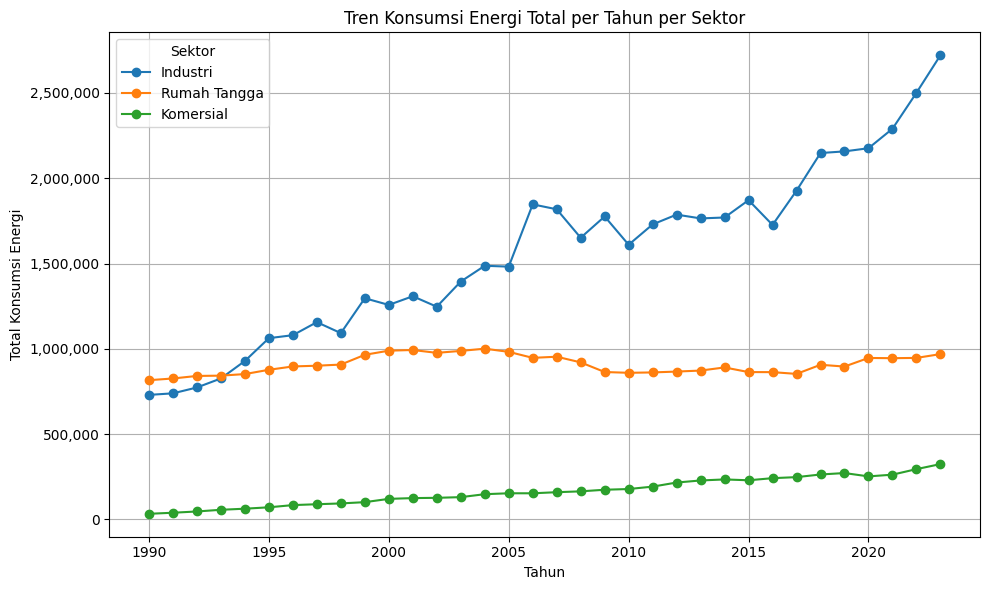

In [ ]:
from matplotlib.ticker import FuncFormatter

# Hitung total per sektor
Total_industri = industri.drop(columns=["Year","Sector"])
Total_rumahtangga = rumahtangga.drop(columns=["Year","Sector"])
Total_komersial = komersial.drop(columns=["Year","Sector"])

Total_industri["Total"] = Total_industri.sum(axis=1)
Total_rumahtangga["Total"] = Total_rumahtangga.sum(axis=1)
Total_komersial["Total"] = Total_komersial.sum(axis=1)

plt.figure(figsize=(10,6))

# Plot tiap sektor
plt.plot(industri["Year"], Total_industri["Total"], marker="o", label="Industri")
plt.plot(rumahtangga["Year"], Total_rumahtangga["Total"], marker="o", label="Rumah Tangga")
plt.plot(komersial["Year"], Total_komersial["Total"], marker="o", label="Komersial")

# Format sumbu Y biar ribuan ada koma
formatter = FuncFormatter(lambda x, pos: f'{int(x):,}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.title("Tren Konsumsi Energi Total per Tahun per Sektor")
plt.xlabel("Tahun")
plt.ylabel("Total Konsumsi Energi")
plt.legend(title="Sektor")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
display(Markdown("**Total Energy Consumption Industrial, Household, and Commercial Sector**"))

**Total Energy Consumption Industrial, Household, and Commercial Sector**

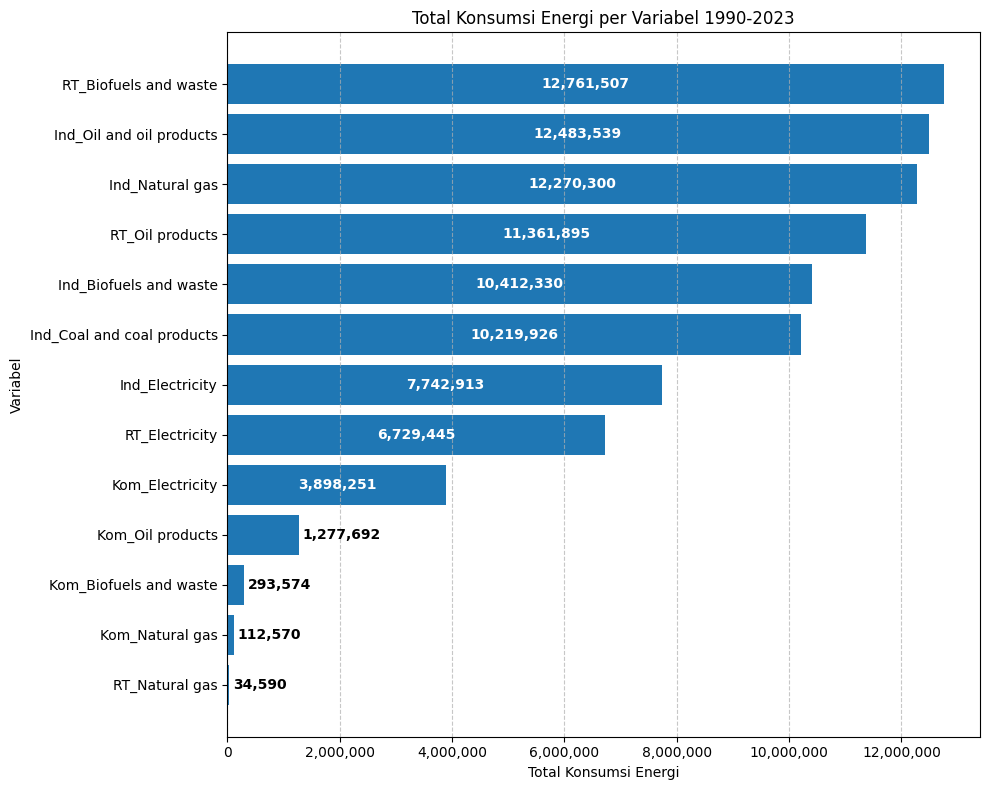

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def plot_energy_bar(data_sum):
    fig, ax = plt.subplots(figsize=(10,8))
    bars = ax.barh(data_sum.index, data_sum.values)

    # Format angka ribuan di sumbu X
    formatter = FuncFormatter(lambda x, pos: f'{int(x):,}')
    ax.xaxis.set_major_formatter(formatter)

    # Ambil batas sumbu X untuk threshold visual
    xlim = ax.get_xlim()
    threshold = (xlim[1] - xlim[0]) * 0.1

    # Tambahkan label dengan kondisi
    for bar in bars:
        width = bar.get_width()
        label = f'{int(width):,}'
        y = bar.get_y() + bar.get_height()/2

        if width > threshold:
            # label di dalam bar, bold, warna putih
            ax.text(width/2, y, label,
                    ha='center', va='center',
                    color='white', fontweight='bold')
        else:
            # label di luar bar, bold, warna hitam
            ax.text(width + threshold*0.05, y, label,
                    ha='left', va='center',
                    color='black', fontweight='bold')

    # Judul dan sumbu
    ax.set_title("Total Konsumsi Energi per Variabel 1990-2023")
    ax.set_xlabel("Total Konsumsi Energi")
    ax.set_ylabel("Variabel")
    ax.grid(axis="x", linestyle="--", alpha=0.7)

    plt.tight_layout()
    plt.show()

# --- Pemanggilan fungsi ---
data_sum = data_energy.drop(columns=["Year"]).sum().sort_values(ascending=True)
plot_energy_bar(data_sum)

In [ ]:
display(Markdown("**Proportion Energy Consumption Industrial, Household, and Commercial Sector**"))

**Proportion Energy Consumption Industrial, Household, and Commercial Sector**

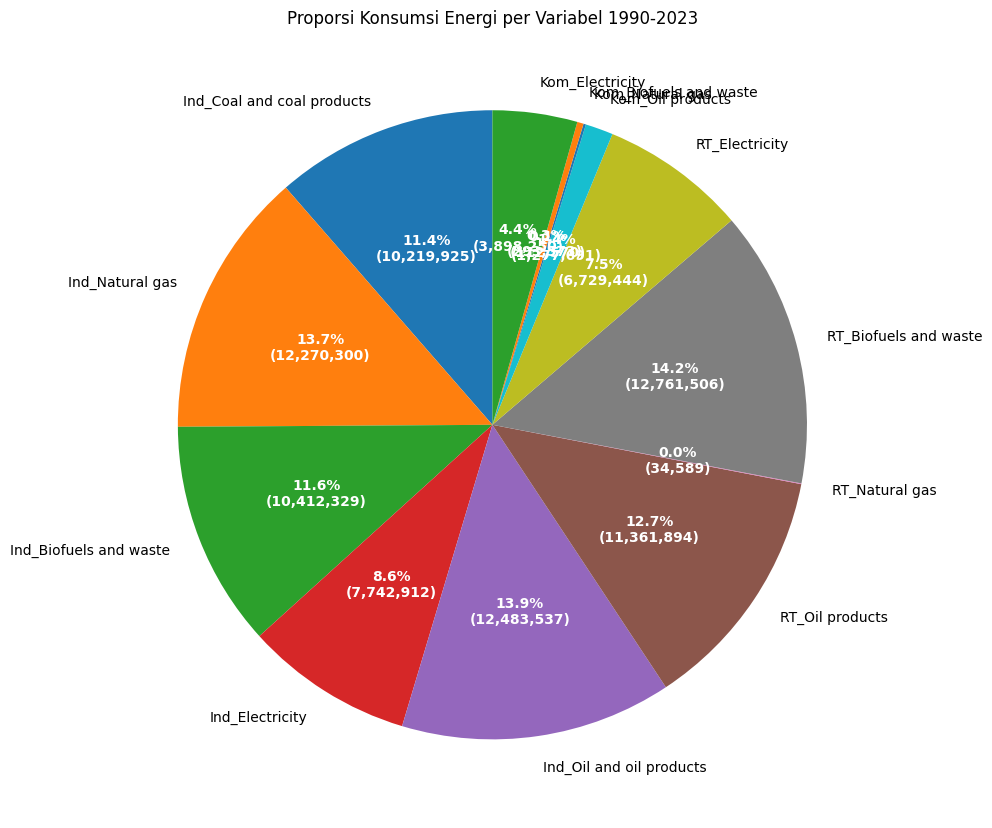

In [ ]:
import matplotlib.pyplot as plt

def plot_energy_pie(data_sum):
    fig, ax = plt.subplots(figsize=(10,10))

    # Pie chart
    wedges, texts, autotexts = ax.pie(
        data_sum.values,
        labels=data_sum.index,
        autopct=lambda pct: f'{pct:.1f}%\n({int(pct/100*data_sum.sum()):,})',
        startangle=90,
        textprops={'fontsize': 10}
    )

    # Styling label persentase di dalam pie
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')

    ax.set_title("Proporsi Konsumsi Energi per Variabel 1990-2023")
    plt.tight_layout()
    plt.show()

# --- Pemanggilan fungsi ---
data_sum = data_energy.drop(columns=["Year"]).sum()
plot_energy_pie(data_sum)


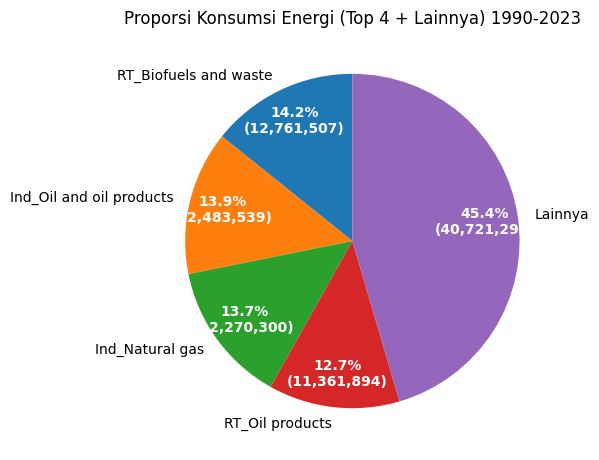

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_energy_pie_top5(data_sum):
    # Urutkan data dari terbesar ke terkecil
    sorted_data = data_sum.sort_values(ascending=False)

    # Ambil 4 terbesar
    top4 = sorted_data[:4]

    # Gabungkan sisanya jadi "Lainnya"
    others = sorted_data[4:].sum()
    top5 = pd.concat([top4, pd.Series({"Lainnya": others})])

    # Buat pie chart full (tanpa donut)
    fig, ax = plt.subplots(figsize=(6,6))
    wedges, texts, autotexts = ax.pie(
        top5.values,
        labels=top5.index,
        autopct=lambda pct: f'{pct:.1f}%\n({int(pct/100*top5.sum()):,})',
        startangle=90,
        pctdistance=0.8,   # posisi persentase
        labeldistance=1.1  # posisi label kategori
    )

    # Styling label persentase
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
        autotext.set_fontsize(10)

    ax.set_title("Proporsi Konsumsi Energi (Top 4 + Lainnya) 1990-2023")
    plt.tight_layout()
    plt.show()

# --- Pemanggilan fungsi ---
data_sum = data_energy.drop(columns=["Year"]).sum()
plot_energy_pie_top5(data_sum)

In [ ]:
display(Markdown("**Trend Energy Consumption Industrial, Household, and Commercial Sector by Type**"))

**Trend Energy Consumption Industrial, Household, and Commercial Sector by Type**

In [ ]:
import matplotlib.pyplot as plt
import math

def plot_dataset(df, title="Tren Konsumsi Energi", ncols=3):

    # ambil kolom numerik, kecuali Year & Total
    numeric_cols = df.select_dtypes(include="number").columns
    numeric_cols = [col for col in numeric_cols if col not in ["Year", "Total"]]

    n = len(numeric_cols)
    nrows = math.ceil(n / ncols)  # baris otomatis

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows), squeeze=False)
    fig.suptitle(title, fontsize=14, y=1.02)

    for i, col in enumerate(numeric_cols):
        r, c = divmod(i, ncols)
        ax = axes[r, c]
        ax.plot(df["Year"], df[col], marker="o", label=col)
        ax.set_title(col, fontsize=10)
        ax.set_xlabel("Tahun")
        ax.set_ylabel("Konsumsi Energi")
        ax.grid(True)
        ax.legend(fontsize=8)

    # hapus subplot kosong kalau ada
    for j in range(i+1, nrows*ncols):
        r, c = divmod(j, ncols)
        fig.delaxes(axes[r, c])

    plt.tight_layout()
    plt.show()

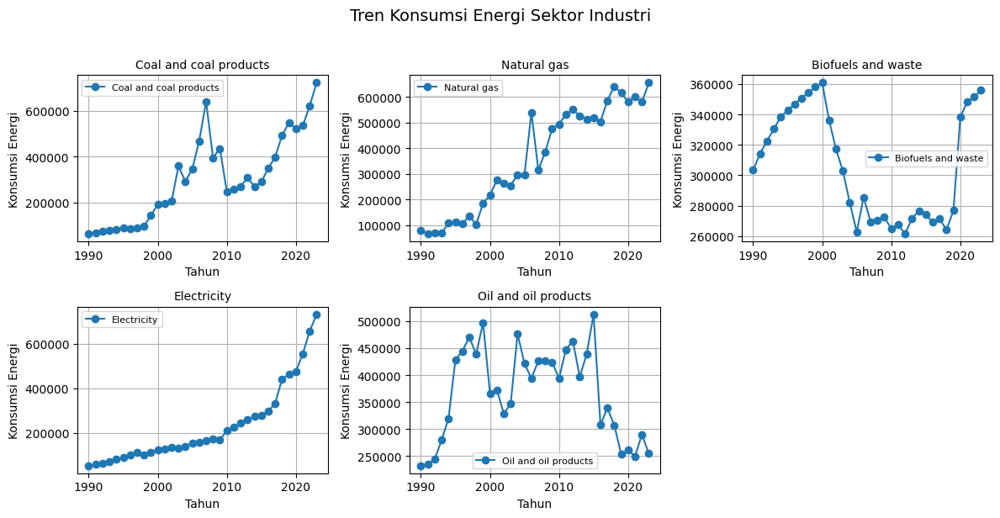

In [ ]:
plot_dataset(industri, "Tren Konsumsi Energi Sektor Industri")

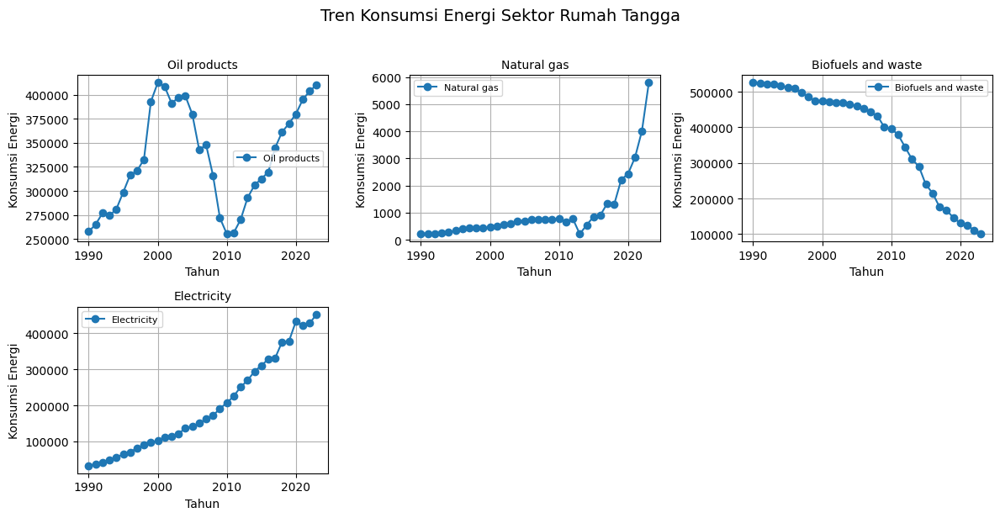

In [ ]:
plot_dataset(rumahtangga, "Tren Konsumsi Energi Sektor Rumah Tangga")

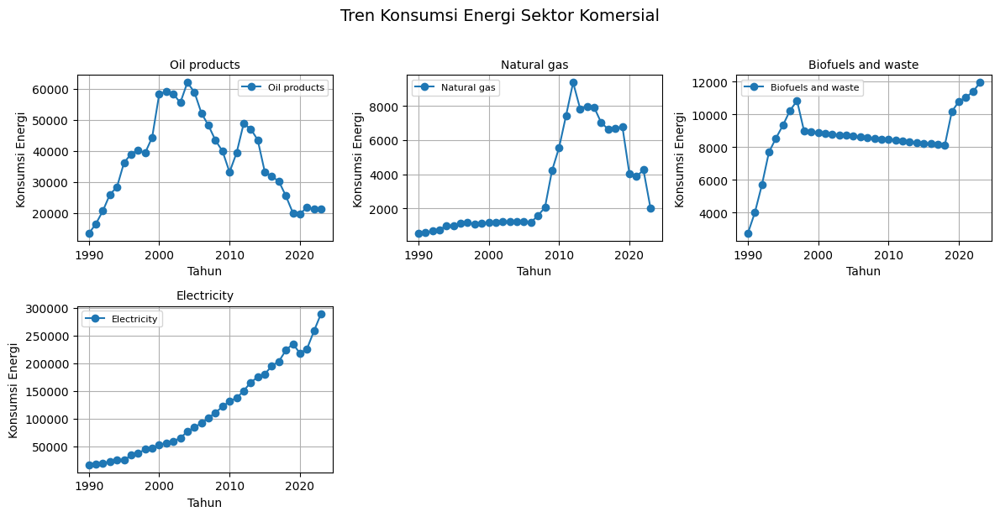

In [ ]:
plot_dataset(komersial, "Tren Konsumsi Energi Sektor Komersial")

In [ ]:
display(Markdown("**Trend Emission CO₂**"))

**Trend Emission CO₂**

**3.1 Analisis Pola Emisi CO2**

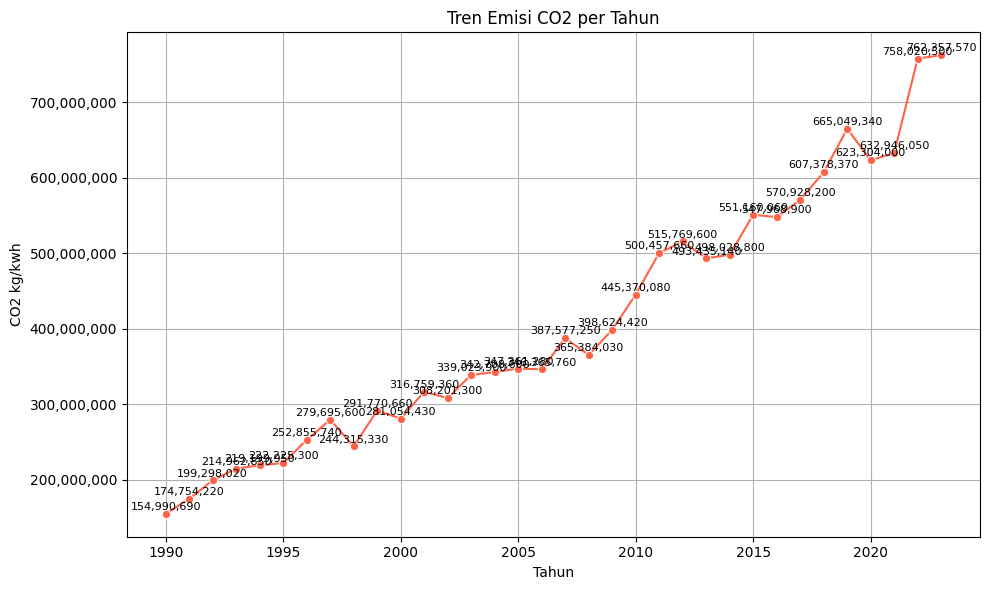

In [ ]:
#3.2 Analisis Pola Perubahan Iklim Tahunan
display(Markdown("**3.1 Analisis Pola Emisi CO2**"))

plt.figure(figsize=(10,6))
sns.lineplot(data=karbon, x='Year', y='Emission_CO₂', marker='o',color='tomato')

for x, y in zip(karbon['Year'], karbon['Emission_CO₂']):
    if pd.notna(y):
        plt.text(x, y + 5_000_000, f'{int(y):,}', ha='center', fontsize=8)

formatter = FuncFormatter(lambda x, pos: f'{int(x):,}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.title("Tren Emisi CO2 per Tahun")
plt.xlabel("Tahun")
plt.ylabel("CO2 kg/kwh")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
display(Markdown("**Trend Greenhouse Gas Emission**"))

**Trend Greenhouse Gas Emission**

**3.2 Analisis Pola Emisi Gas Rumah Kaca**

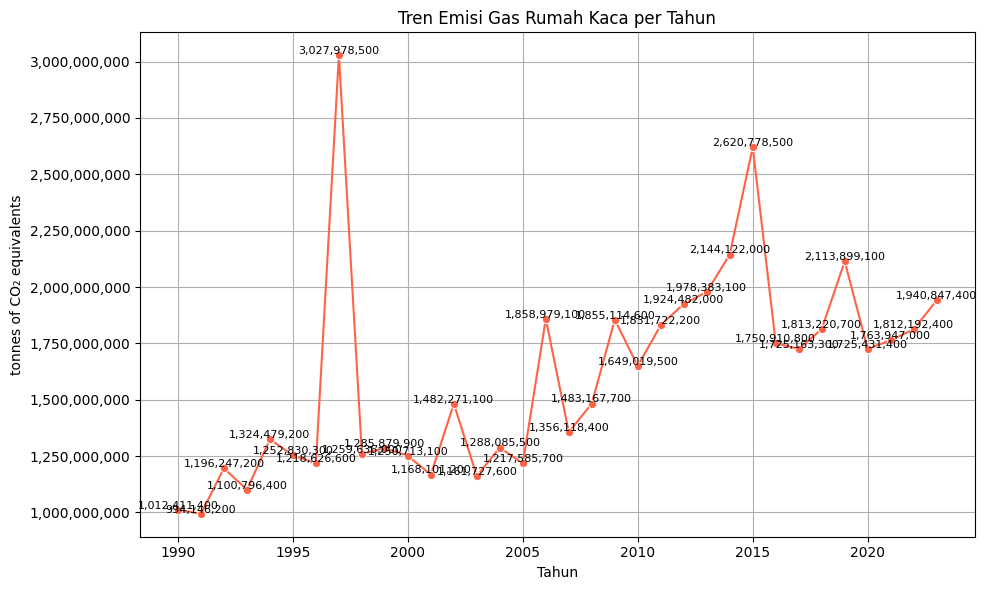

In [ ]:
#3.2 Analisis Pola Perubahan Iklim Tahunan
display(Markdown("**3.2 Analisis Pola Emisi Gas Rumah Kaca**"))

plt.figure(figsize=(10,6))
sns.lineplot(data=grk, x='Year', y='Emission_GRK', marker='o',color='tomato')

for x, y in zip(grk['Year'], grk['Emission_GRK']):
    if pd.notna(y):
        plt.text(x, y + 5_000_000, f'{int(y):,}', ha='center', fontsize=8)

formatter = FuncFormatter(lambda x, pos: f'{int(x):,}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.title("Tren Emisi Gas Rumah Kaca per Tahun")
plt.xlabel("Tahun")
plt.ylabel("tonnes of CO₂ equivalents")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
display(Markdown("**Trend Anomaly Temperature**"))

**Trend Anomaly Temperature**

**3.3 Analisis Pola Perubahan Suhu Permukaan**

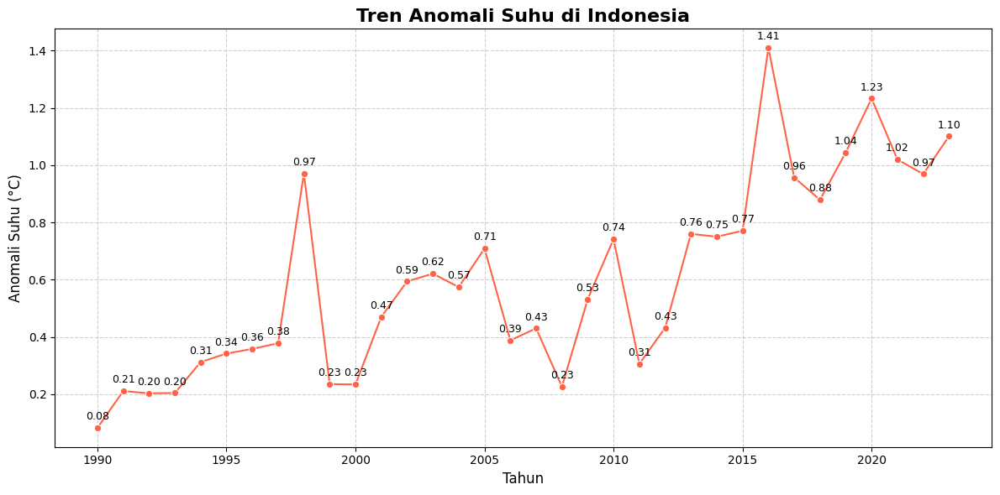

In [ ]:
#3.2 Analisis Pola Perubahan Iklim Tahunan
display(Markdown("**3.3 Analisis Pola Perubahan Suhu Permukaan**"))

temp['Year'] = temp['Year'].astype(int)
temp['Temperature'] = temp['Temperature'].astype(float)

plt.figure(figsize=(12,6))
sns.lineplot(data=temp, x='Year', y='Temperature', marker='o', color='tomato')

for x, y in zip(temp['Year'], temp['Temperature']):
    plt.text(x, y+0.02, f"{y:.2f}", ha='center', va='bottom', fontsize=9, color='black')

plt.title('Tren Anomali Suhu di Indonesia', fontsize=16, weight='bold')
plt.xlabel('Tahun', fontsize=12)
plt.ylabel('Anomali Suhu (°C)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
display(Markdown("**Compare between Emission CO₂ and Greenhouse Gas Emission**"))

**Compare between Emission CO₂ and Greenhouse Gas Emission**

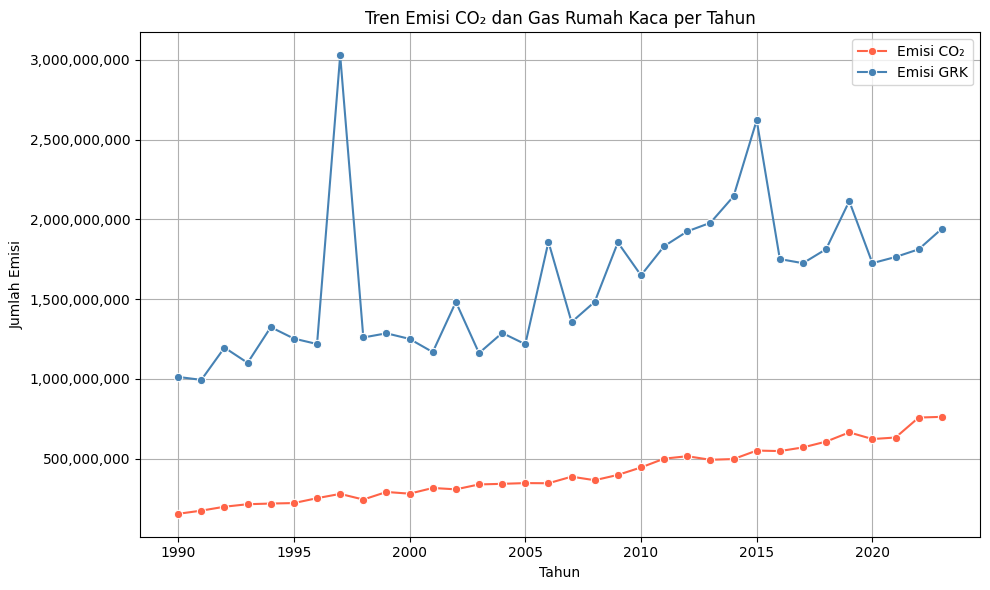

In [ ]:
plt.figure(figsize=(10,6))
sns.lineplot(data=karbon, x='Year', y='Emission_CO₂', marker='o', color='tomato', label="Emisi CO₂")
sns.lineplot(data=grk, x='Year', y='Emission_GRK', marker='o', color='steelblue', label="Emisi GRK")

formatter = FuncFormatter(lambda x, pos: f'{int(x):,}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.title("Tren Emisi CO₂ dan Gas Rumah Kaca per Tahun")
plt.xlabel("Tahun")
plt.ylabel("Jumlah Emisi")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#3. Correlation beetween each dataset
display(Markdown("**3. Korelasi antar dataset**"))

**3. Korelasi antar dataset**

**3.1 Korelasi dalam dataset Konsumsi Energi**

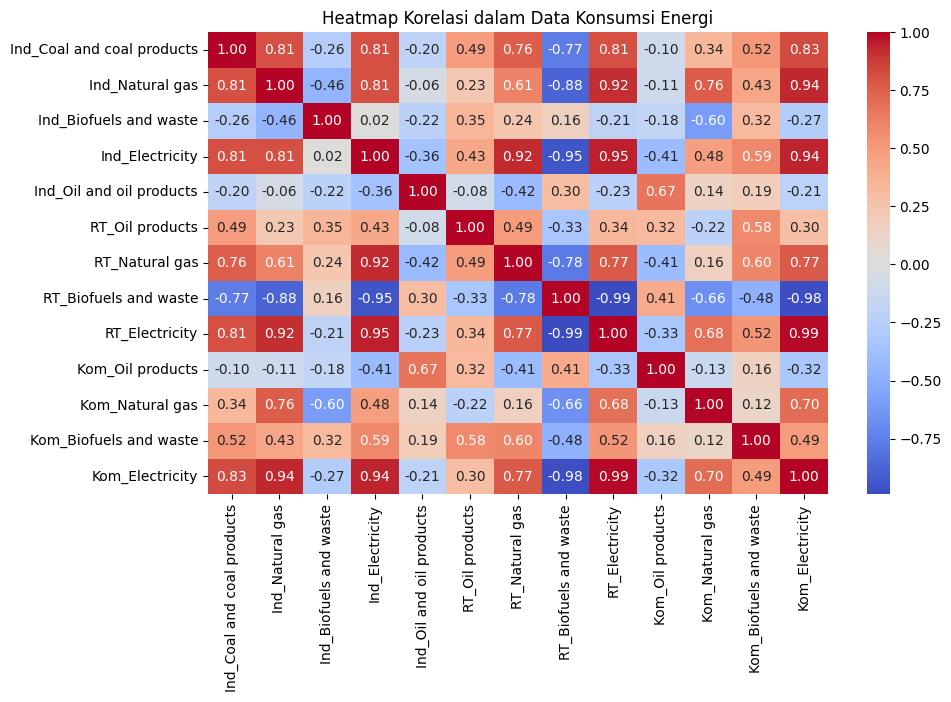

In [ ]:
display(Markdown("**3.1 Korelasi dalam dataset Konsumsi Energi**"))

# Ambil kolom numerik dari satu dataset
df_num = data_energy.drop(columns=["Year"])
df_num = df_num.select_dtypes(include=["number"])

# Hitung korelasi antar kolom numerik
corr_matrix = df_num.corr()

# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Korelasi dalam Data Konsumsi Energi")
plt.show()

**3.2 Korelasi dalam dataset Perubahan Iklim**

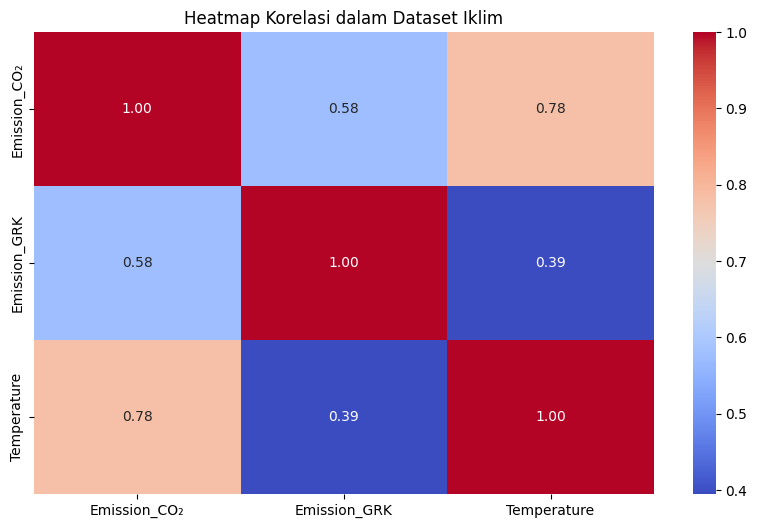

In [ ]:
display(Markdown("**3.2 Korelasi dalam dataset Perubahan Iklim**"))

# Ambil kolom numerik dari satu dataset
df_num = data_iklim.drop(columns=["Year"])
df_num = df_num.select_dtypes(include=["number"])

# Hitung korelasi antar kolom numerik
corr_matrix = df_num.corr()

# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Korelasi dalam Dataset Iklim")
plt.show()

**3.3 Korelasi Konsumsi Energi vs Perubahan Iklim**

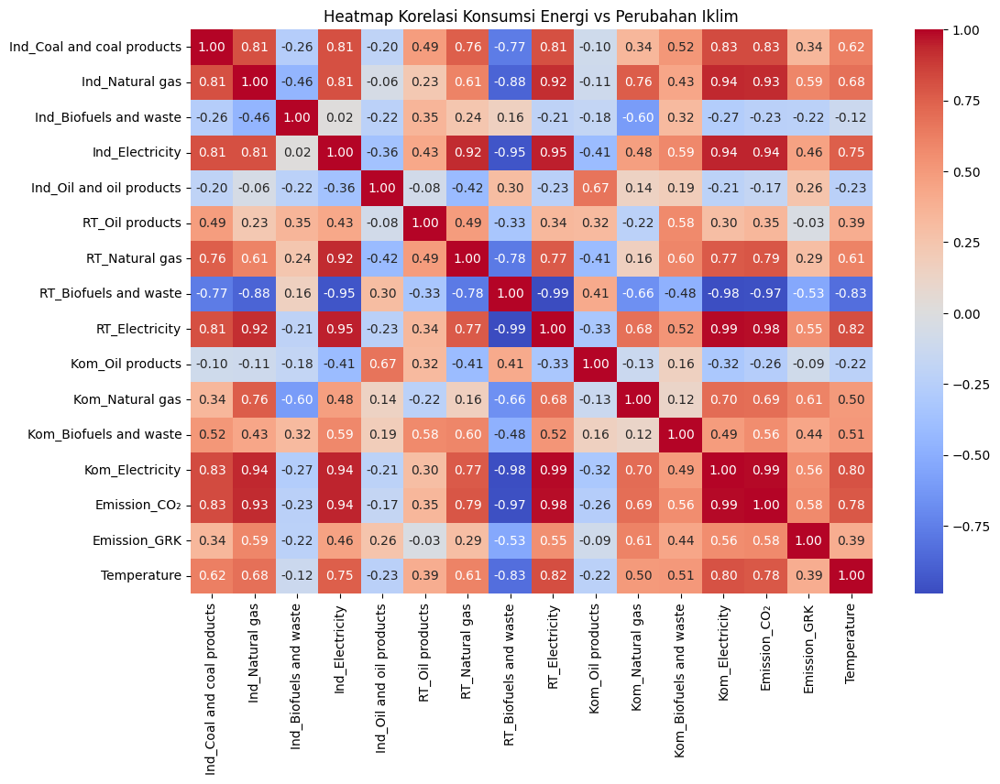

In [ ]:
display(Markdown("**3.3 Korelasi Konsumsi Energi vs Perubahan Iklim**"))

# Gabungkan data energi dan iklim berdasarkan Year
df_merge = data_energy.merge(data_iklim, on="Year", suffixes=("_Energi", "_Iklim"))

# Ambil hanya kolom numerik (selain Year)
df_num = df_merge.drop(columns=["Year"]).select_dtypes(include=["number"])

# Hitung korelasi antar semua kolom numerik (energi vs iklim)
corr_matrix = df_num.corr()

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Korelasi Konsumsi Energi vs Perubahan Iklim")
plt.show()

**3.4 Korelasi Data Energi Industri dengan Perubahan Iklim**

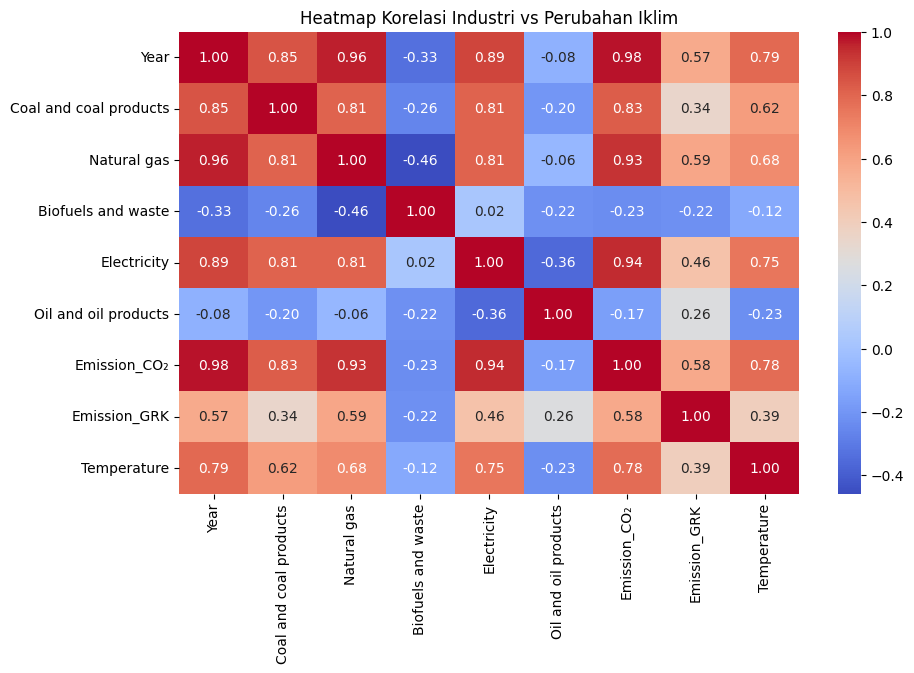

In [ ]:
#3. Correlation beetween each dataset
display(Markdown("**3.4 Korelasi Data Energi Industri dengan Perubahan Iklim**"))

# Menggabungkan data industri dan karbon berdasarkan Year
df_ind_iklim = industri.merge(karbon, on="Year", suffixes=("_Industri", "_Karbon"))
df_ind_iklim = df_ind_iklim.merge(grk, on="Year", suffixes=("", "_GRK"))
df_ind_iklim = df_ind_iklim.merge(temp, on="Year", suffixes=("", "_Temp"))

# Ambil kolom numerik
df_num = df_ind_iklim.select_dtypes(include=["number"])

# Hitung korelasi
corr_matrix = df_num.corr()

# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Korelasi Industri vs Perubahan Iklim")
plt.show()

**3.5 Korelasi Data Energi Rumah Tangga dengan Perubahan Iklim**

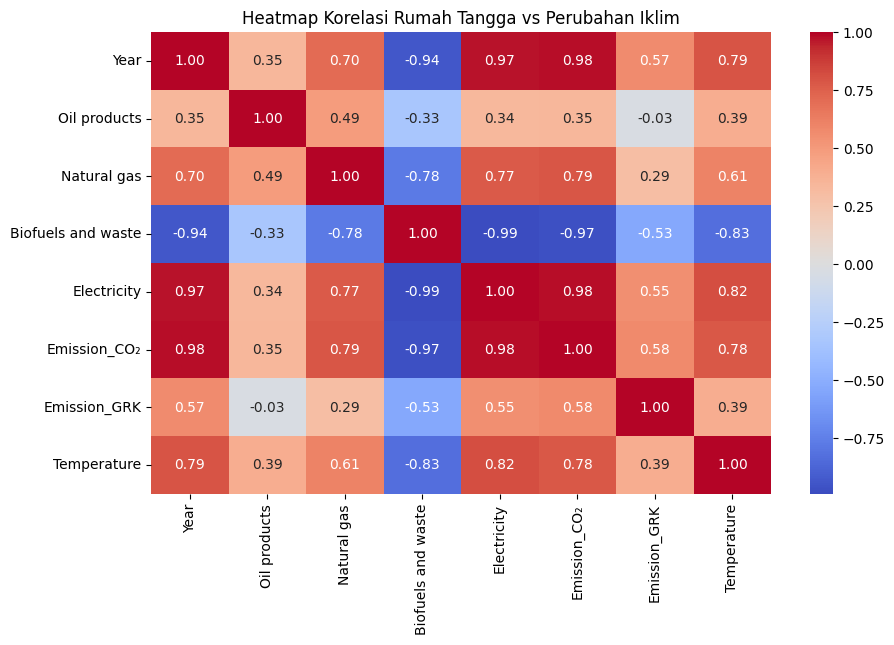

In [ ]:
#3. Correlation beetween each dataset
display(Markdown("**3.5 Korelasi Data Energi Rumah Tangga dengan Perubahan Iklim**"))

# Menggabungkan data Rumah Tangga dengan Perubahan Iklim berdasarkan Year
df_rt_iklim = rumahtangga.merge(karbon, on="Year", suffixes=("", ""))
df_rt_iklim = df_rt_iklim.merge(grk, on="Year", suffixes=("", "_GRK"))
df_rt_iklim = df_rt_iklim.merge(temp, on="Year", suffixes=("", "_Temp"))

# Ambil kolom numerik
df_num = df_rt_iklim.select_dtypes(include=["number"])

# Hitung korelasi
corr_matrix = df_num.corr()

# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Korelasi Rumah Tangga vs Perubahan Iklim")
plt.show()

**3.6 Korelasi Data Energi Komersial dengan Perubahan Iklim**

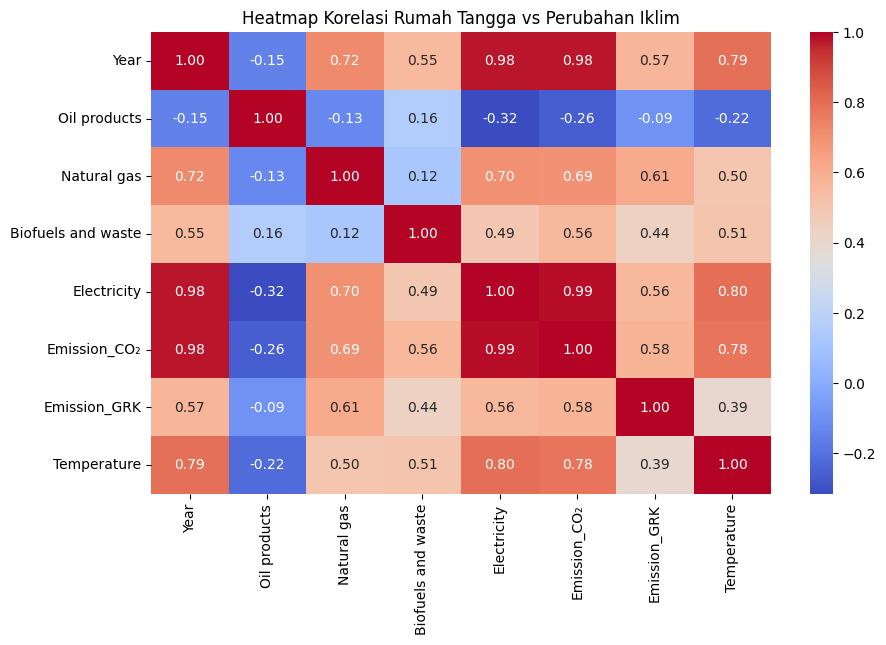

In [ ]:
#3. Correlation beetween each dataset
display(Markdown("**3.6 Korelasi Data Energi Komersial dengan Perubahan Iklim**"))

# Menggabungkan data Komersial dengan Perubahan Iklim berdasarkan Year
df_kom_iklim = komersial.merge(karbon, on="Year", suffixes=("", ""))
df_kom_iklim = df_kom_iklim.merge(grk, on="Year", suffixes=("", "_GRK"))
df_kom_iklim = df_kom_iklim.merge(temp, on="Year", suffixes=("", "_Temp"))

# Ambil kolom numerik
df_num = df_kom_iklim.select_dtypes(include=["number"])

# Hitung korelasi
corr_matrix = df_num.corr()

# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Korelasi Rumah Tangga vs Perubahan Iklim")
plt.show()

### **Step 4 : Modelling type 2**
**Predictive modelling with Seq2Seq LSTM and Causality Test wtih Transfer Entropy**

In [ ]:
df_ind = industri.add_prefix("Ind_")
df_rt = rumahtangga.add_prefix("RT_")
df_kom = komersial.add_prefix("Kom_")

df_energy= pd.concat([df_ind, df_rt, df_kom], axis=1)
data_energy = df_energy.dropna()

data_energy = data_energy.rename(columns={"Ind_Year": "Year"})
data_energy = data_energy.drop(columns=["RT_Year", "Kom_Year", "Ind_Sector", "RT_Sector", "Kom_Sector"])

data_energy

,Year,Ind_Coal and coal products,Ind_Natural gas,Ind_Biofuels and waste,Ind_Electricity,Ind_Oil and oil products,RT_Oil products,RT_Natural gas,RT_Biofuels and waste,RT_Electricity,Kom_Oil products,Kom_Natural gas,Kom_Biofuels and waste,Kom_Electricity
0,1990,61881,80811,303274,52354,231873,257809,224,525585,32756,13406,530,2727,16725
1,1991,67563,65717,314200,57693,234142,265171,230,523776,37173,16507,593,4002,18468
2,1992,72705,70786,322533,63918,243716,276981,230,521998,42015,20742,674,5685,19936
3,1993,77301,68989,330395,70383,279413,274334,235,520978,47465,26023,755,7681,22410
4,1994,82752,107559,338427,80874,319465,281041,282,516284,54583,28380,990,8543,25351
5,1995,89431,113142,342704,89002,428311,298626,333,513134,65232,36247,990,9334,24861
6,1996,83029,105474,346791,100616,444160,316554,391,509528,70383,39007,1117,10234,33955
7,1997,86727,135167,350718,113187,470639,321015,426,497945,81777,40268,1197,10826,37105
8,1998,95346,103354,354359,100746,438361,332682,437,485212,89481,39359,1071,8970,44712
9,1999,143203,185030,357998,112816,497496,392723,426,475180,96789,44391,1117,8919,47199


# Seq2Seq LSTM with HyperParameter Tuning

Data Split: Train=27, Test=7
Mencari hyperparameter terbaik (Objective: MAE)...

BEST HYPERPARAMETERS (Validation - MAE)
- units: 64
- activation: tanh
- learning_rate: 0.0005
- batch_size: 16
- dropout: 0.14602580925118247
Best Validation MAE: 37124.768074

Training ulang model terbaik di seluruh data train...


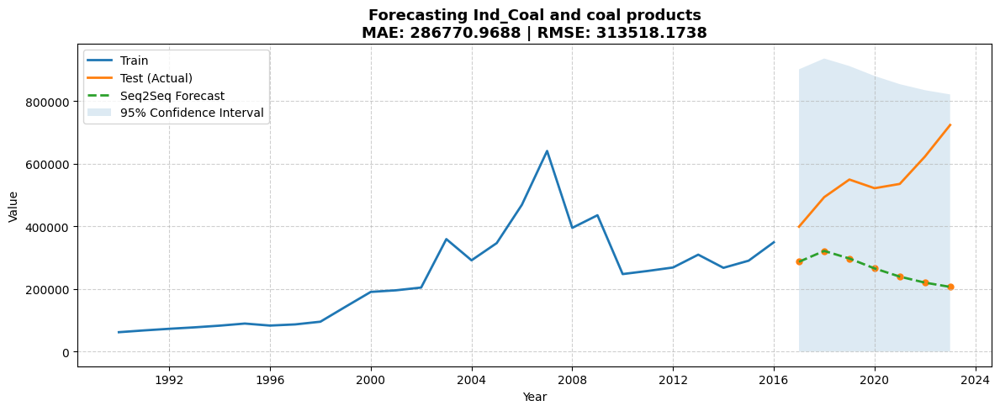

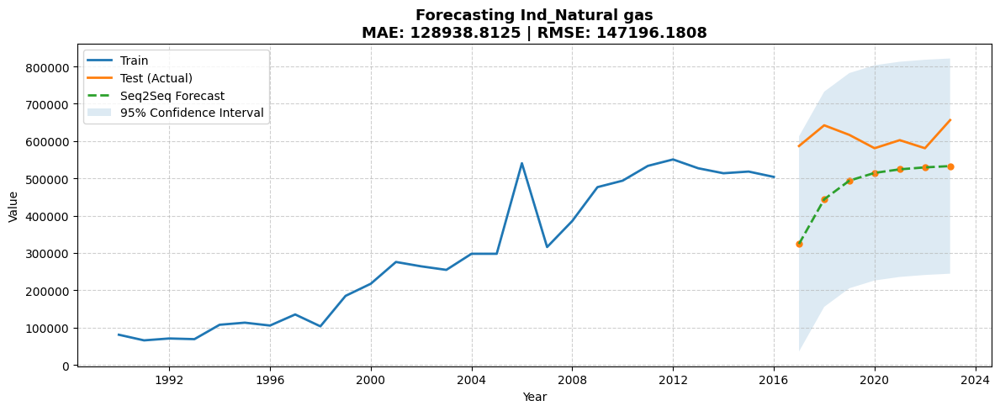

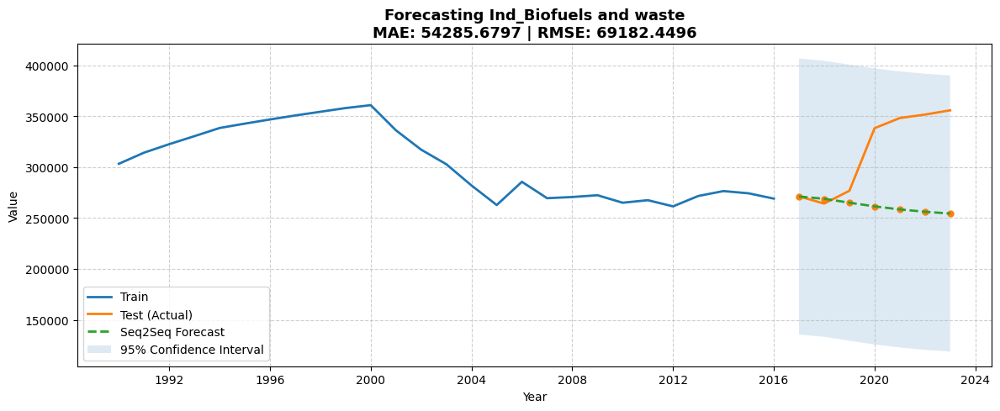

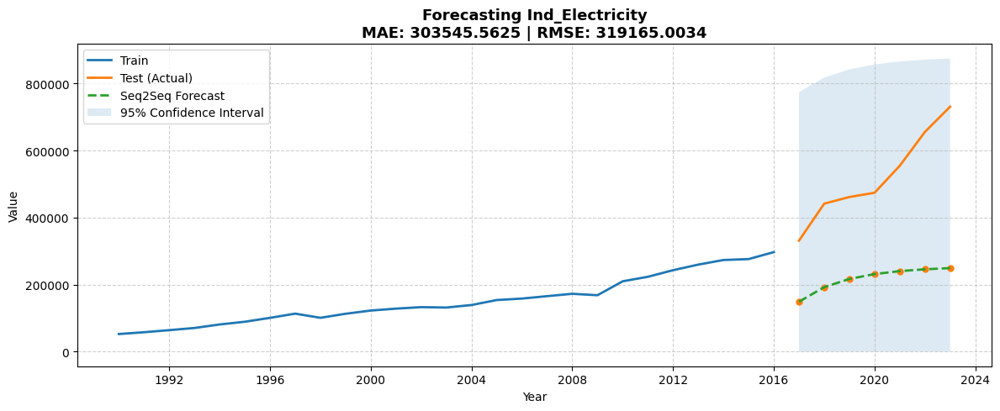

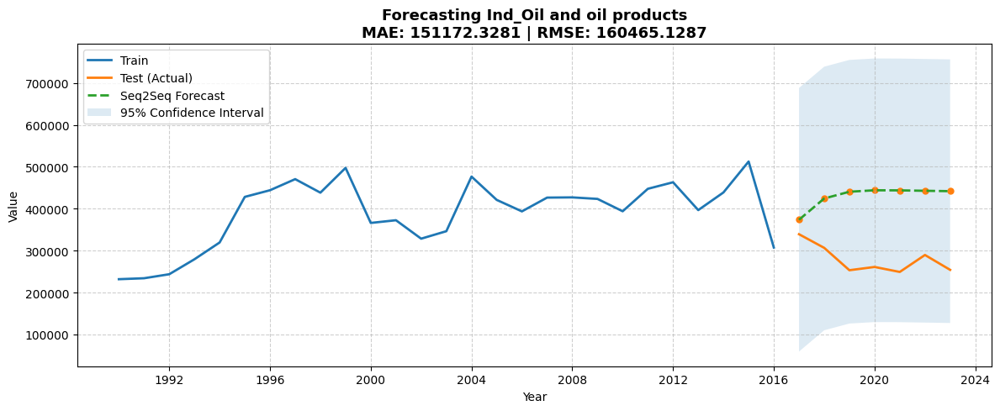

...

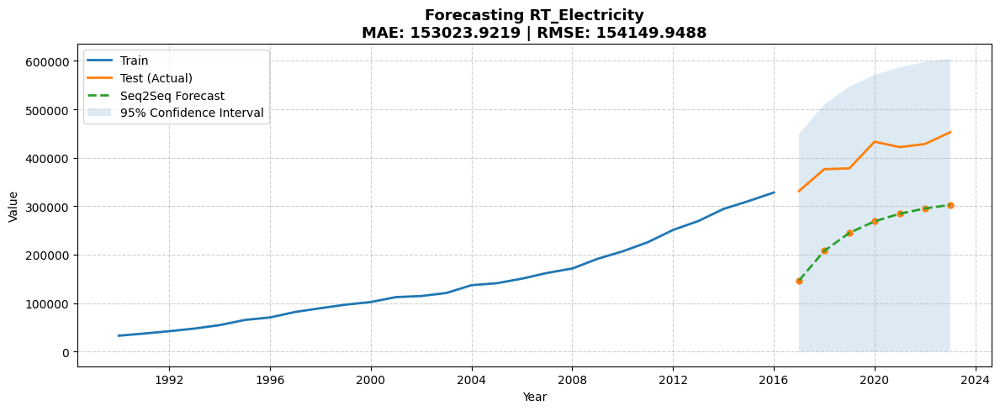

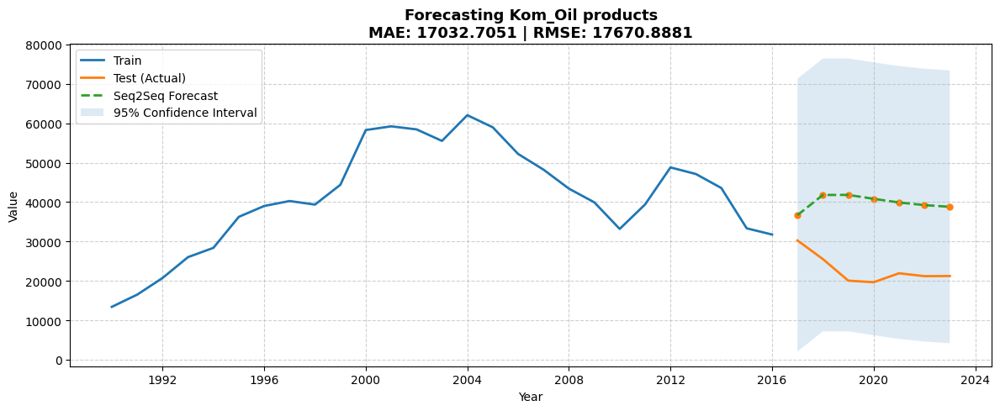

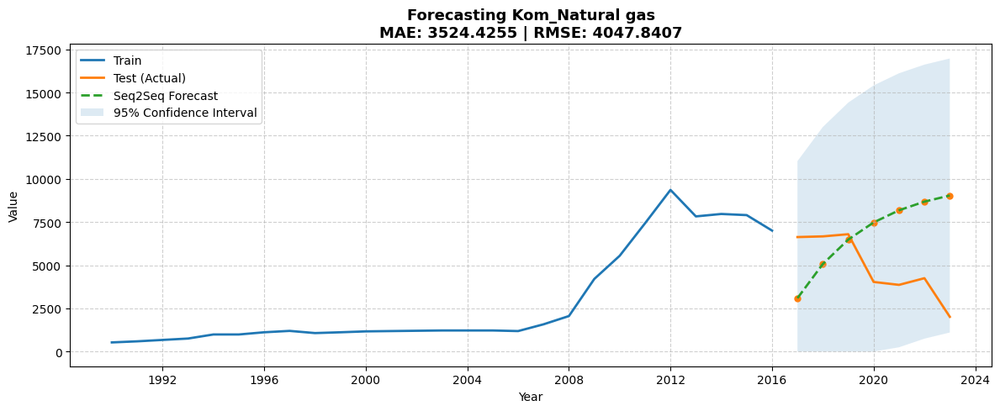

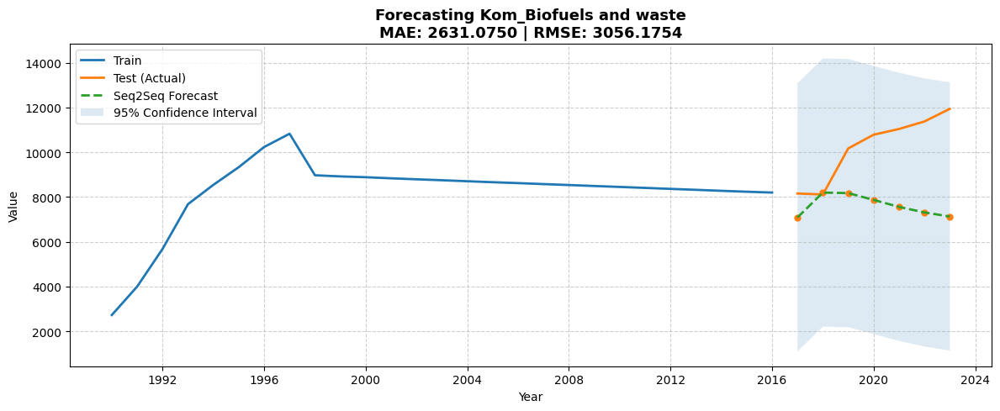

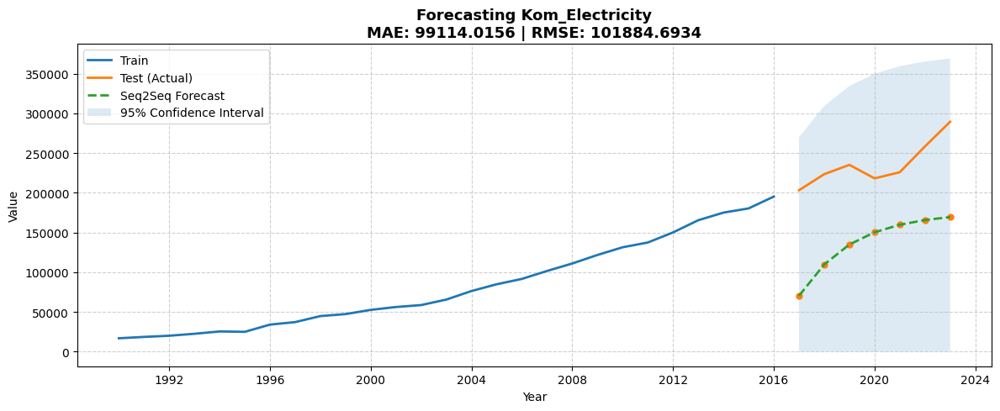


FINAL TEST EVALUATION (REAL VALUES)
                  Variable         MAE        RMSE  MAPE (%)
Ind_Coal and coal products 286770.9688 313518.1738   49.9036
           Ind_Natural gas 128938.8125 147196.1808   21.0740
    Ind_Biofuels and waste  54285.6797  69182.4496   15.7446
           Ind_Electricity 303545.5625 319165.0034   57.2660
  Ind_Oil and oil products 151172.3281 160465.1287   56.7867
           RT_Oil products  88274.6953  94187.1879   22.7577
            RT_Natural gas   2260.1680   2711.6599   72.0363
     RT_Biofuels and waste 166663.3594 167555.5141  124.2034
            RT_Electricity 153023.9219 154149.9488   38.6358
          Kom_Oil products  17032.7051  17670.8881   78.7409
           Kom_Natural gas   3524.4255   4047.8407  104.6776
    Kom_Biofuels and waste   2631.0750   3056.1754   24.0519
           Kom_Electricity  99114.0156 101884.6934   42.3974

Average MAPE: 54.48%


In [ ]:
warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)
tf.get_logger().setLevel(logging.ERROR)

SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ==========================================
# 1. PERSIAPAN DATA
# ==========================================
# Asumsi data_energy sudah tersedia
df = data_energy.copy()

if 'Year' in df.columns:
    df = df.set_index('Year')

df.index = df.index.astype(int)

# Split Data (80% Train, 20% Test)
n = len(df)
train_n = int(n * 0.8)

train_df = df.iloc[:train_n]
test_df  = df.iloc[train_n:]

print(f"Data Split: Train={len(train_df)}, Test={len(test_df)}")

# Scaling (Fit hanya di TRAIN)
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_df)
test_scaled  = scaler.transform(test_df)

# Konfigurasi Window
N_PAST     = 12
N_FUTURE   = len(test_df)
N_FEATURES = train_scaled.shape[1]

# ==========================================
# 2. FUNGSI SEQUENCE FIXED HORIZON
# ==========================================
def create_fixed_horizon_sequences(data, n_past, n_future):
    X, Y = [], []
    for i in range(len(data) - n_past - n_future + 1):
        X.append(data[i : i + n_past])
        Y.append(data[i + n_past : i + n_past + n_future])
    return np.array(X), np.array(Y)

# Dataset Training
X_train_full, y_train_full = create_fixed_horizon_sequences(
    train_scaled, N_PAST, N_FUTURE
)

# Split khusus untuk OPTUNA (80% train – 20% val)
val_idx = int(len(X_train_full) * 0.8)

X_train_opt = X_train_full[:val_idx]
y_train_opt = y_train_full[:val_idx]

X_val_opt = X_train_full[val_idx:]
y_val_opt = y_train_full[val_idx:]

# ==========================================
# 3. OBJECTIVE FUNCTION OPTUNA (MAE)
# ==========================================
def objective(trial):
    tf.keras.backend.clear_session()
    tf.random.set_seed(SEED)

    units = trial.suggest_categorical('units', [64, 128])
    activation = trial.suggest_categorical('activation', ['tanh', 'relu'])
    learning_rate = trial.suggest_categorical('learning_rate', [1e-3, 5e-4, 1e-4])
    batch_size = trial.suggest_categorical('batch_size', [16, 32])
    dropout = trial.suggest_float('dropout', 0.1, 0.3)

    # Model Seq2Seq
    inputs = Input(shape=(N_PAST, N_FEATURES))
    encoder = LSTM(
        units,
        activation=activation,
        return_sequences=False,
        dropout=dropout
    )(inputs)

    repeat = RepeatVector(N_FUTURE)(encoder)

    decoder = LSTM(
        units,
        activation=activation,
        return_sequences=True,
        dropout=dropout
    )(repeat)

    outputs = TimeDistributed(Dense(N_FEATURES))(decoder)

    model = Model(inputs, outputs)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate, clipvalue=0.5),
        loss='mse'
    )

    es = EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True
    )

    model.fit(
        X_train_opt, y_train_opt,
        validation_data=(X_val_opt, y_val_opt),
        epochs=50,
        batch_size=batch_size,
        callbacks=[es],
        verbose=0
    )

    # Prediksi Validation
    pred_val_scaled = model.predict(X_val_opt, verbose=0)

    b, t, f = pred_val_scaled.shape

    pred_val_real = scaler.inverse_transform(
        pred_val_scaled.reshape(-1, f)
    ).reshape(b, t, f)

    y_val_real = scaler.inverse_transform(
        y_val_opt.reshape(-1, f)
    ).reshape(b, t, f)

    # === OBJECTIVE: MAE ===
    mae_val = mean_absolute_error(
        y_val_real.reshape(-1, f),
        pred_val_real.reshape(-1, f)
    )

    return mae_val

# ==========================================
# 4. JALANKAN OPTUNA
# ==========================================
print("Mencari hyperparameter terbaik (Objective: MAE)...")

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

print("\n" + "="*40)
print("BEST HYPERPARAMETERS (Validation - MAE)")
print("="*40)

for k, v in study.best_params.items():
    print(f"- {k}: {v}")

print(f"Best Validation MAE: {study.best_value:.6f}")
print("="*40)

# ==========================================
# 5. RETRAIN MODEL TERBAIK
# ==========================================
print("\nTraining ulang model terbaik di seluruh data train...")

tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

p = study.best_params

inputs = Input(shape=(N_PAST, N_FEATURES))
encoder = LSTM(
    p['units'],
    activation=p['activation'],
    return_sequences=False,
    dropout=p['dropout']
)(inputs)

repeat = RepeatVector(N_FUTURE)(encoder)

decoder = LSTM(
    p['units'],
    activation=p['activation'],
    return_sequences=True,
    dropout=p['dropout']
)(repeat)

outputs = TimeDistributed(Dense(N_FEATURES))(decoder)

model_final = Model(inputs, outputs)
model_final.compile(
    optimizer=Adam(learning_rate=p['learning_rate'], clipvalue=0.5),
    loss='mse'
)

model_final.fit(
    X_train_full,
    y_train_full,
    epochs=100,
    batch_size=p['batch_size'],
    verbose=0
)

# ==========================================
# 6. PREDIKSI DATA TEST
# ==========================================
last_window = train_scaled[-N_PAST:].reshape(1, N_PAST, N_FEATURES)

pred_test_scaled = model_final.predict(last_window, verbose=0)
pred_test_2d = pred_test_scaled.reshape(N_FUTURE, N_FEATURES)

pred_test_real = scaler.inverse_transform(pred_test_2d)

forecast_df = pd.DataFrame(
    pred_test_real,
    columns=df.columns,
    index=test_df.index
)

# ==========================================
# 7. EVALUASI & PLOTTING
# ==========================================
summary_results = []
pd.set_option('display.float_format', '{:.4f}'.format)

for col in df.columns:
    train_series = train_df[col]
    test_series  = test_df[col]
    pred_series  = forecast_df[col]

    mae  = mean_absolute_error(test_series, pred_series)
    rmse = np.sqrt(mean_squared_error(test_series, pred_series))

    mask = test_series != 0
    mape = np.mean(
        np.abs((test_series[mask] - pred_series[mask]) / test_series[mask])
    ) * 100

    summary_results.append({
        "Variable": col,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE (%)": mape
    })

    # Confidence Interval
    margin = 1.96 * rmse
    upper = pred_series + margin
    lower = (pred_series - margin).clip(lower=0)

    # Plot
    plt.figure(figsize=(12, 5))

    plt.plot(train_series.index, train_series, label="Train", linewidth=2)
    plt.plot(test_series.index, test_series, label="Test (Actual)", linewidth=2)
    plt.plot(pred_series.index, pred_series, '--', label="Seq2Seq Forecast", linewidth=2)

    plt.fill_between(
        pred_series.index, lower, upper,
        alpha=0.15, label="95% Confidence Interval"
    )

    plt.scatter(pred_series.index, pred_series, s=25)


    plt.title(
        (f"Forecasting {col}\n"
         f"MAE: {mae:.4f} | RMSE: {rmse:.4f}"),
        fontsize=13, fontweight='bold'
    )

    plt.xlabel("Year")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

# ==========================================
# 8. RINGKASAN AKHIR
# ==========================================
summary_df = pd.DataFrame(summary_results)

print("\n" + "="*50)
print("FINAL TEST EVALUATION (REAL VALUES)")
print("="*50)
print(summary_df.to_string(index=False))
print(f"\nAverage MAPE: {summary_df['MAPE (%)'].mean():.2f}%")

# Double Exponential Smoothing With HyperParameter

Mulai Grid Search Holt (Best Model by MAE)...

Processing: Ind_Coal and coal products...


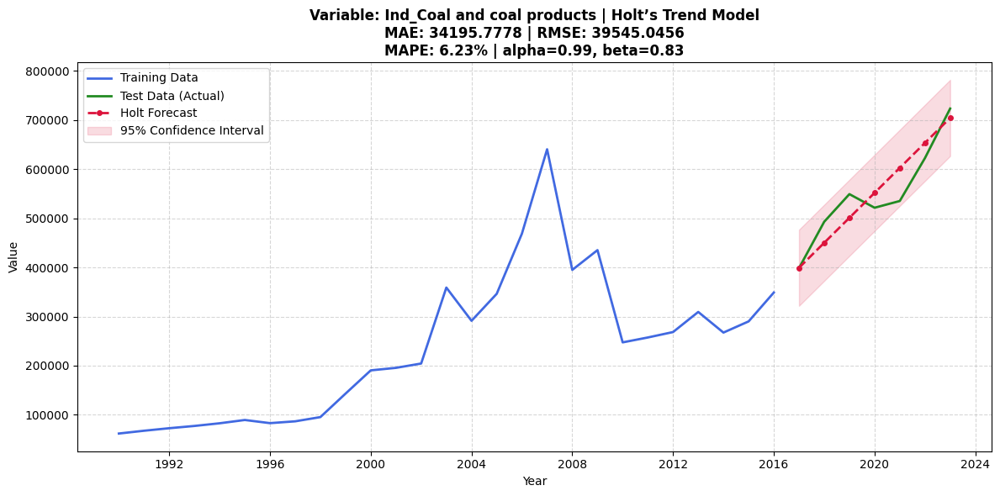

Processing: Ind_Natural gas...


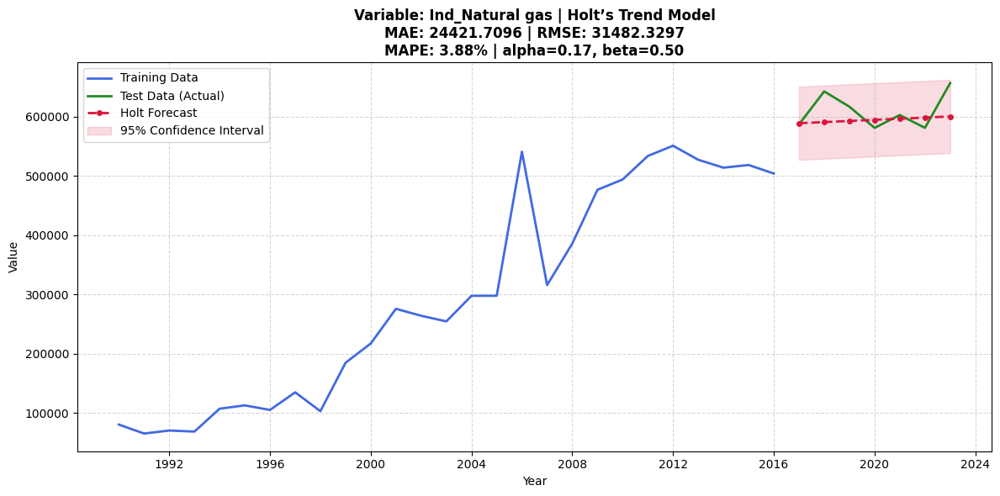

Processing: Ind_Biofuels and waste...


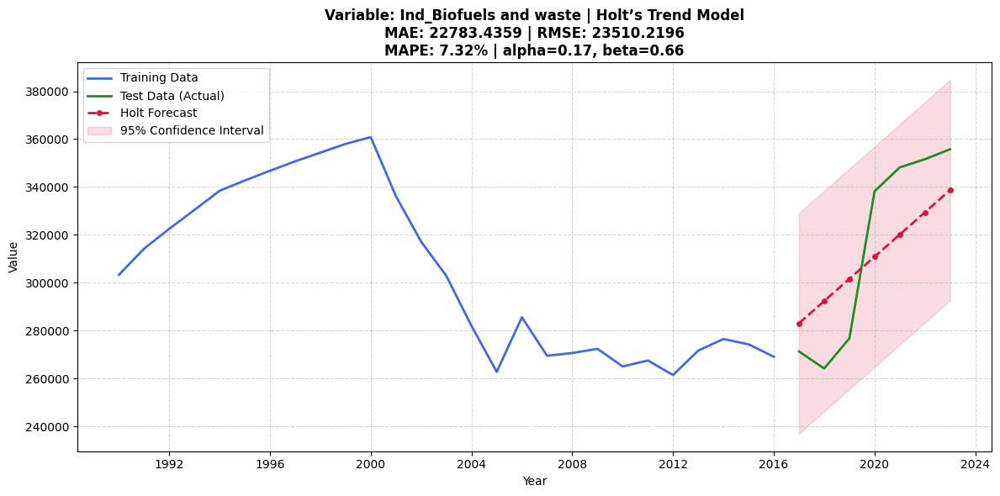

Processing: Ind_Electricity...


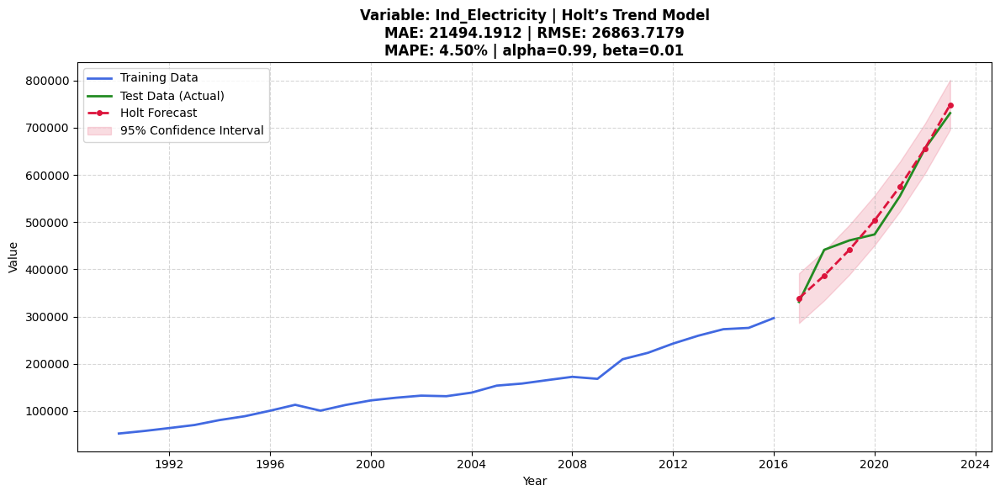

Processing: Ind_Oil and oil products...


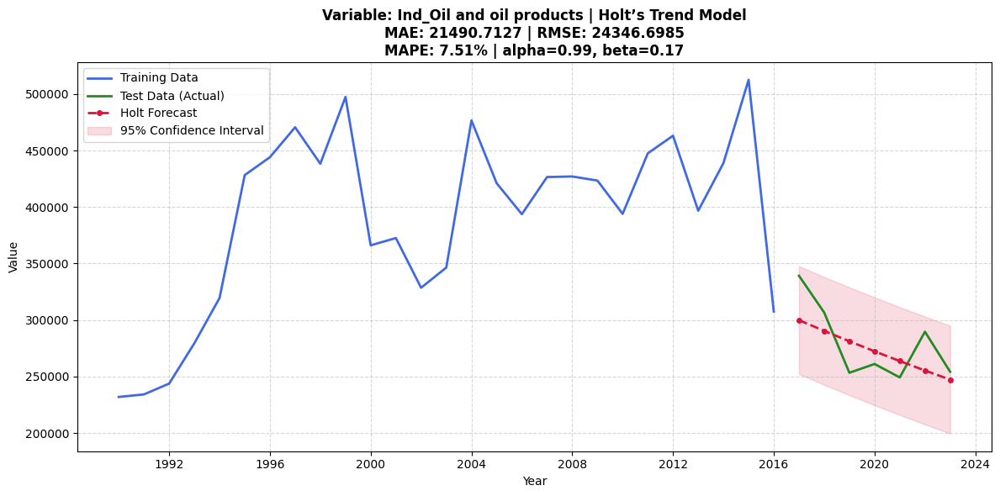

Processing: RT_Oil products...


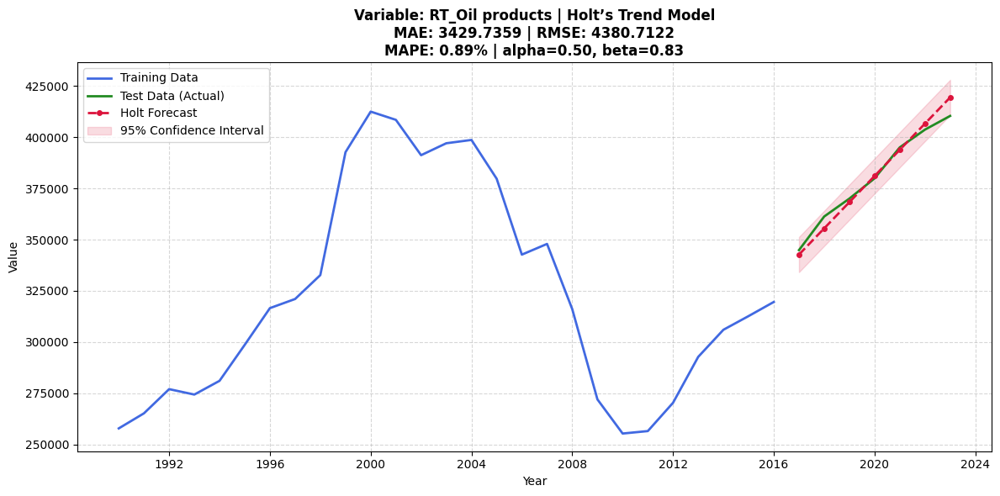

Processing: RT_Natural gas...


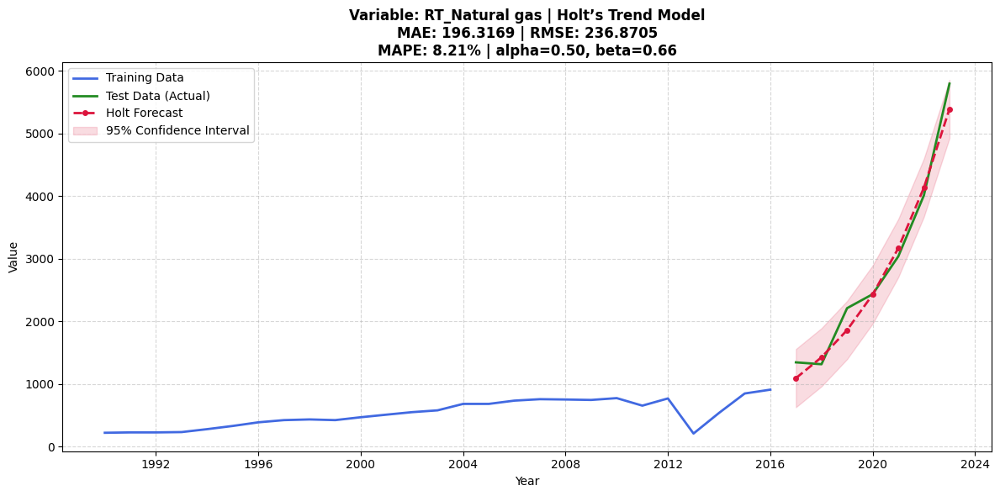

Processing: RT_Biofuels and waste...


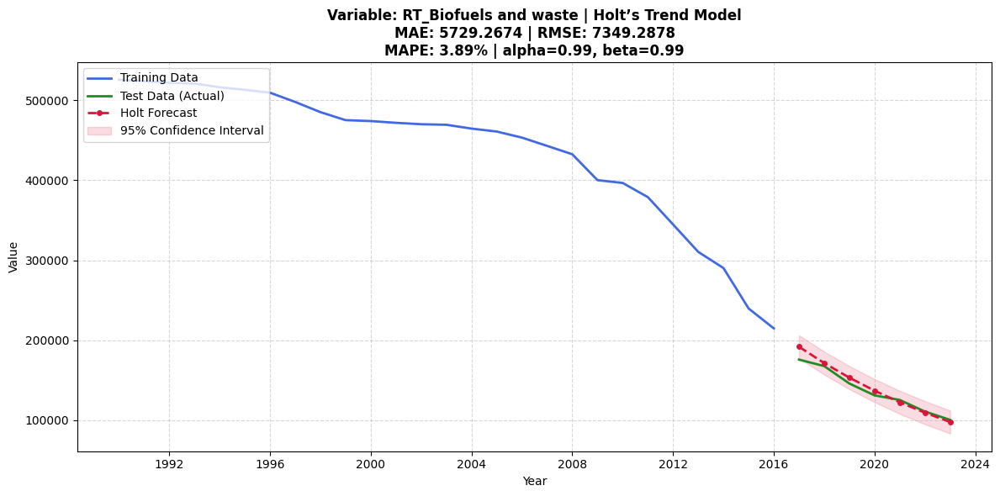

Processing: RT_Electricity...


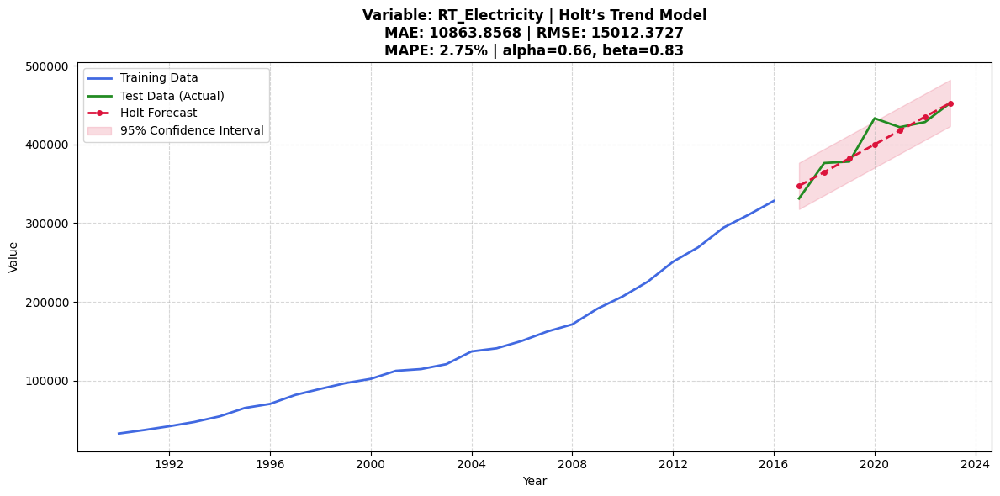

Processing: Kom_Oil products...


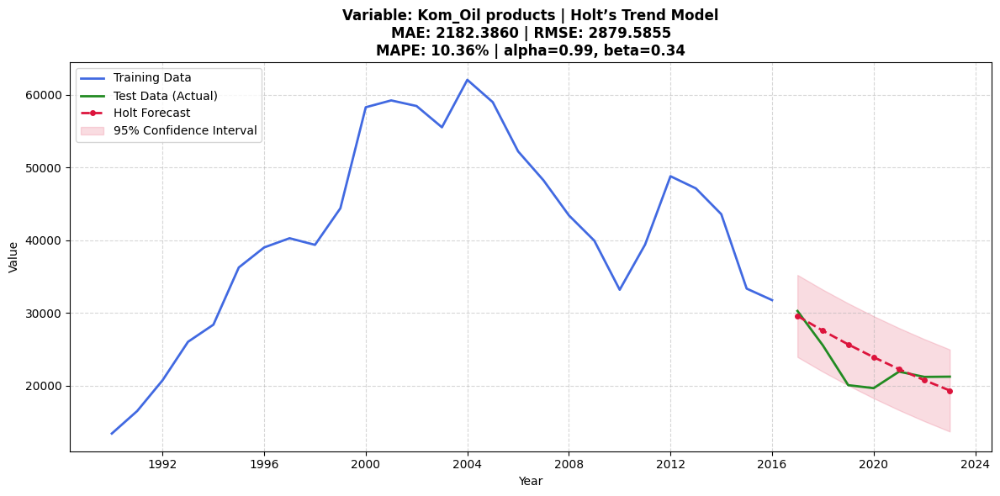

Processing: Kom_Natural gas...


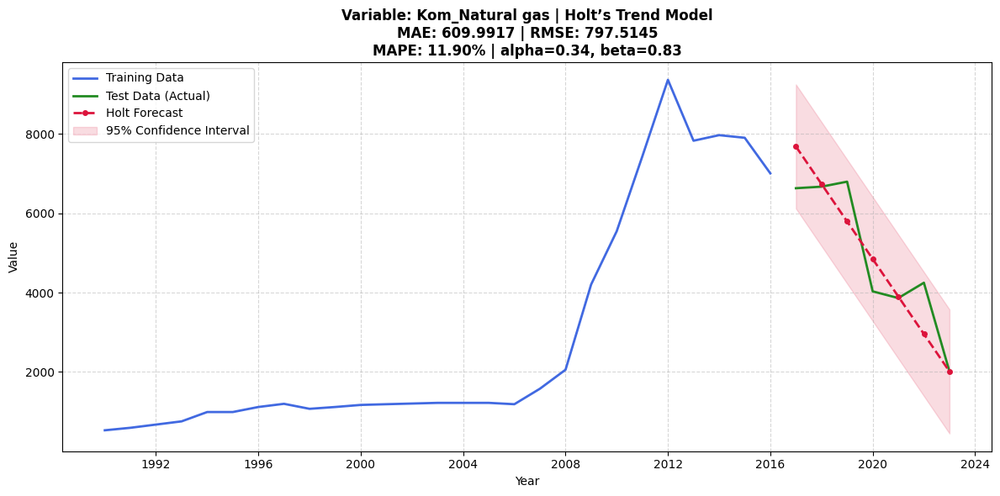

Processing: Kom_Biofuels and waste...


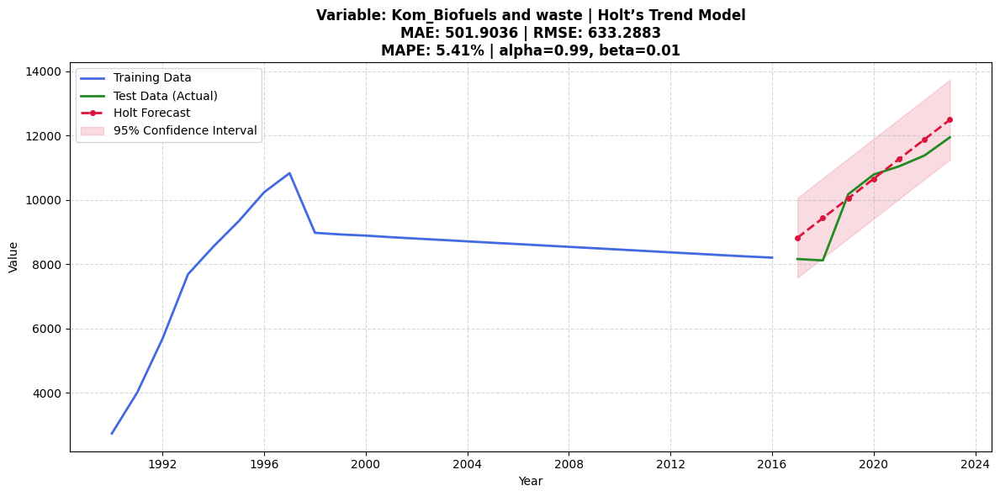

Processing: Kom_Electricity...


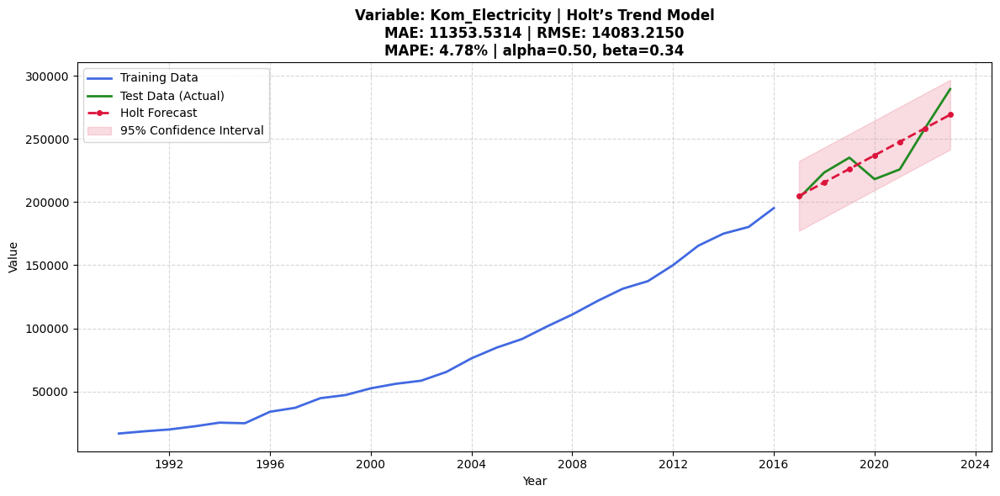


=== FINAL SUMMARY METRICS (HOLT – BEST BY MAE) ===


,Variable,trend,damped_trend,alpha,beta,MAE,RMSE,MAPE(%)
0,Ind_Coal and coal products,add,False,0.9900,0.8267,34195.7778,39545.0456,6.2332
1,Ind_Natural gas,add,False,0.1733,0.5000,24421.7096,31482.3297,3.8837
2,Ind_Biofuels and waste,add,False,0.1733,0.6633,22783.4359,23510.2196,7.3208
3,Ind_Electricity,mul,False,0.9900,0.0100,21494.1912,26863.7179,4.4962
4,Ind_Oil and oil products,mul,False,0.9900,0.1733,21490.7127,24346.6985,7.5142
5,RT_Oil products,add,False,0.5000,0.8267,3429.7359,4380.7122,0.8905
6,RT_Natural gas,mul,False,0.5000,0.6633,196.3169,236.8705,8.2078
7,RT_Biofuels and waste,mul,False,0.9900,0.9900,5729.2674,7349.2878,3.8893
8,RT_Electricity,add,False,0.6633,0.8267,10863.8568,15012.3727,2.7540
9,Kom_Oil products,mul,False,0.9900,0.3367,2182.3860,2879.5855,10.3574


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
import warnings

from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error
)
from matplotlib.ticker import MaxNLocator

warnings.filterwarnings("ignore")

# ==========================================
# 0. SETUP DATA
# ==========================================
df = data_energy.copy()

if 'Year' in df.columns:
    df = df.set_index("Year")

try:
    df.index = df.index.astype(int)
except Exception:
    pass

cols = df.columns

# ==========================================
# 1. GRID SEARCH, EVALUATION & PLOTTING
# ==========================================
alpha_grid = np.linspace(0.01, 0.99, 7)
beta_grid  = np.linspace(0.01, 0.99, 7)
trend_opts = ["add", "mul"]
damped_opts = [False, True]

final_metrics = []
forecasts = pd.DataFrame(index=df.index)

print("Mulai Grid Search Holt (Best Model by MAE)...\n")

for col in cols:
    print(f"Processing: {col}...")
    y = df[col]

    # Split Data
    n = len(y)
    train_n = int(n * 0.8)
    train = y.iloc[:train_n]
    test  = y.iloc[train_n:]

    best_mae = np.inf
    best_res = None

    # --------------------------------------
    # A. GRID SEARCH (OBJECTIVE = MAE)
    # --------------------------------------
    for trend, damped, alpha, beta in itertools.product(
        trend_opts, damped_opts, alpha_grid, beta_grid
    ):
        try:
            model = ExponentialSmoothing(
                train,
                trend=trend,
                seasonal=None,
                damped_trend=damped
            )

            fit = model.fit(
                smoothing_level=float(alpha),
                smoothing_trend=float(beta),
                optimized=False
            )

            y_pred = fit.forecast(len(test))

            mae = mean_absolute_error(test, y_pred)

            if mae < best_mae:
                best_mae = mae
                rmse = np.sqrt(mean_squared_error(test, y_pred))
                mape = mean_absolute_percentage_error(test, y_pred) * 100

                best_res = {
                    "Variable": col,
                    "trend": trend,
                    "damped_trend": damped,
                    "alpha": alpha,
                    "beta": beta,
                    "MAE": mae,
                    "RMSE": rmse,
                    "MAPE(%)": mape,
                    "fit": fit,
                    "y_pred": y_pred
                }

        except Exception:
            continue

    # --------------------------------------
    # B. FALLBACK (AUTO OPTIMIZE)
    # --------------------------------------
    if best_res is None:
        try:
            model = ExponentialSmoothing(train, trend="add", seasonal=None)
            fit = model.fit(optimized=True)
            y_pred = fit.forecast(len(test))

            mae = mean_absolute_error(test, y_pred)
            rmse = np.sqrt(mean_squared_error(test, y_pred))
            mape = mean_absolute_percentage_error(test, y_pred) * 100

            best_res = {
                "Variable": col,
                "trend": getattr(fit.model, "trend", "add"),
                "damped_trend": getattr(fit.model, "damped_trend", False),
                "alpha": fit.params.get("smoothing_level"),
                "beta": fit.params.get("smoothing_trend"),
                "MAE": mae,
                "RMSE": rmse,
                "MAPE(%)": mape,
                "fit": fit,
                "y_pred": y_pred
            }

        except Exception as e:
            best_res = {"Variable": col, "error": str(e)}

    # --------------------------------------
    # C. SIMPAN & PLOTTING
    # --------------------------------------
    if "y_pred" in best_res:
        y_pred_final = pd.Series(
            np.asarray(best_res["y_pred"]).flatten(),
            index=test.index
        )

        # Confidence Interval (95%)
        margin = 1.96 * best_res["RMSE"]
        upper = y_pred_final + margin
        lower = y_pred_final - margin

        forecasts[col] = pd.concat([train, y_pred_final]).reindex(df.index)

        # === PLOT ===
        plt.figure(figsize=(12, 6))

        plt.plot(train.index, train.values, label="Training Data",
                 color="royalblue", linewidth=2)

        plt.plot(test.index, test.values, label="Test Data (Actual)",
                 color="forestgreen", linewidth=2)

        plt.plot(test.index, y_pred_final.values,
                 label="Holt Forecast",
                 color="crimson", linestyle="--",
                 linewidth=2, marker="o", markersize=4)

        plt.fill_between(
            test.index, lower, upper,
            color="crimson", alpha=0.15,
            label="95% Confidence Interval"
        )

        title_text = (
            f"Variable: {col} | Holt’s Trend Model\n"
            f"MAE: {best_res['MAE']:.4f} | RMSE: {best_res['RMSE']:.4f}\n"
            f"MAPE: {best_res['MAPE(%)']:.2f}% | "
            f"alpha={best_res['alpha']:.2f}, beta={best_res['beta']:.2f}"
        )

        plt.title(title_text, fontsize=12, fontweight="bold")
        plt.xlabel("Year")
        plt.ylabel("Value")
        plt.legend(loc="upper left")
        plt.grid(True, linestyle="--", alpha=0.5)
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
        plt.tight_layout()
        plt.show()

        # Bersihkan memory
        best_res.pop("fit", None)
        best_res.pop("y_pred", None)

    final_metrics.append(best_res)

# ==========================================
# 2. SUMMARY TABLE
# ==========================================
summary_df = pd.DataFrame(final_metrics)

cols_order = [
    "Variable",
    "trend",
    "damped_trend",
    "alpha",
    "beta",
    "MAE",
    "RMSE",
    "MAPE(%)"
]

summary_df = summary_df[[c for c in cols_order if c in summary_df.columns]]

print("\n=== FINAL SUMMARY METRICS (HOLT – BEST BY MAE) ===")
pd.set_option("display.float_format", "{:.4f}".format)
display(summary_df)


# Comparation Model

Data BVAR berhasil dimuat.

Menghitung perbandingan performa 3 Model (MAE-based)...



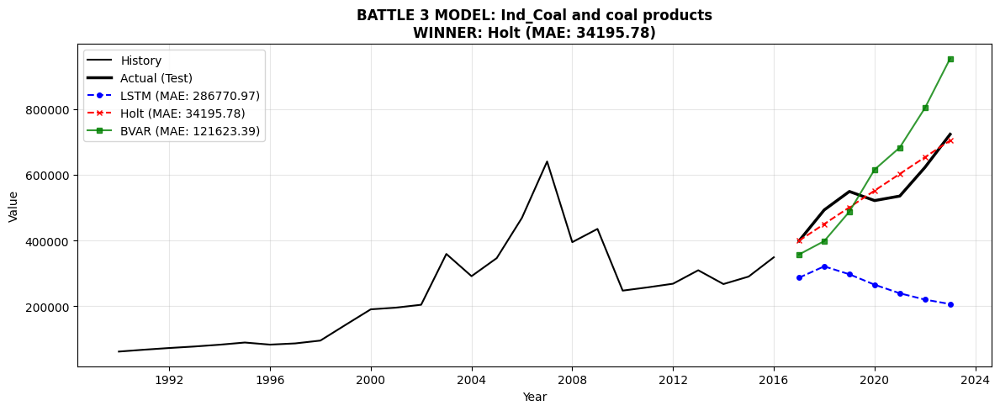

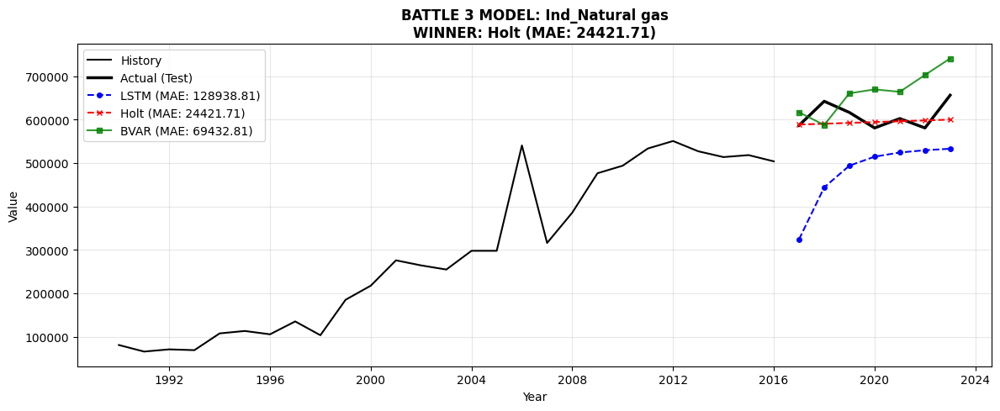

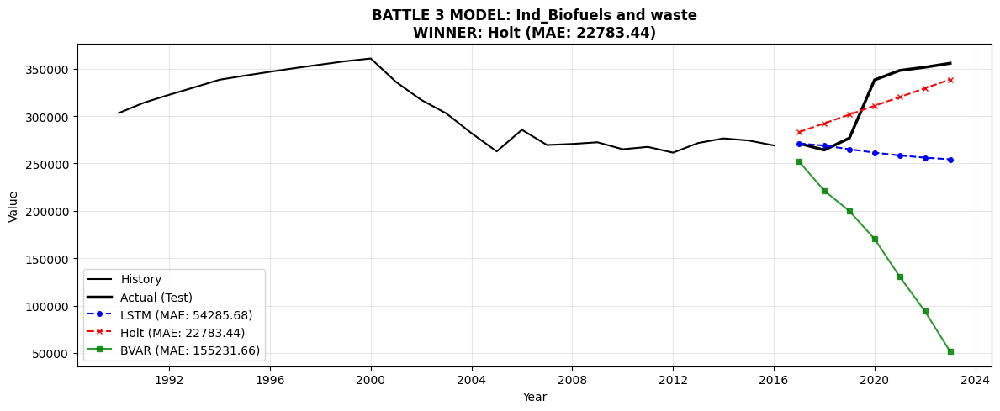

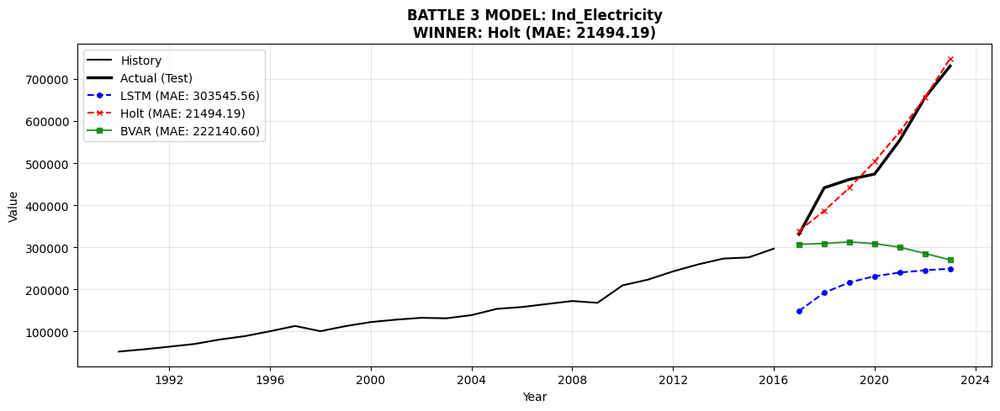

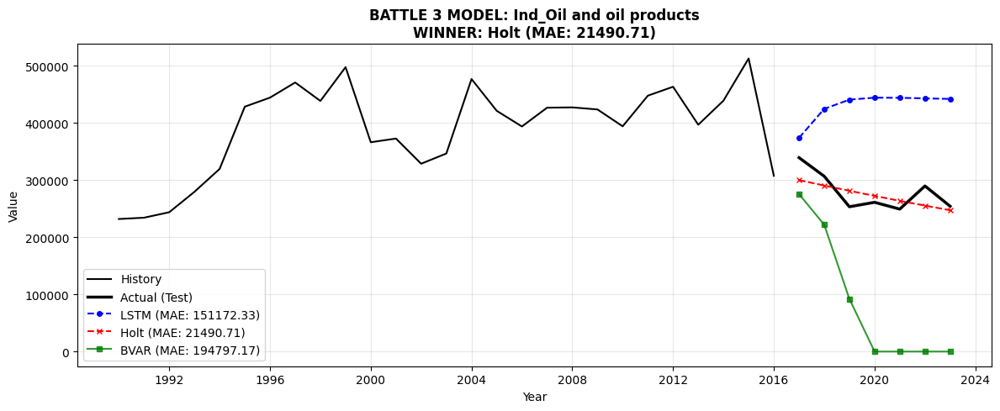

...

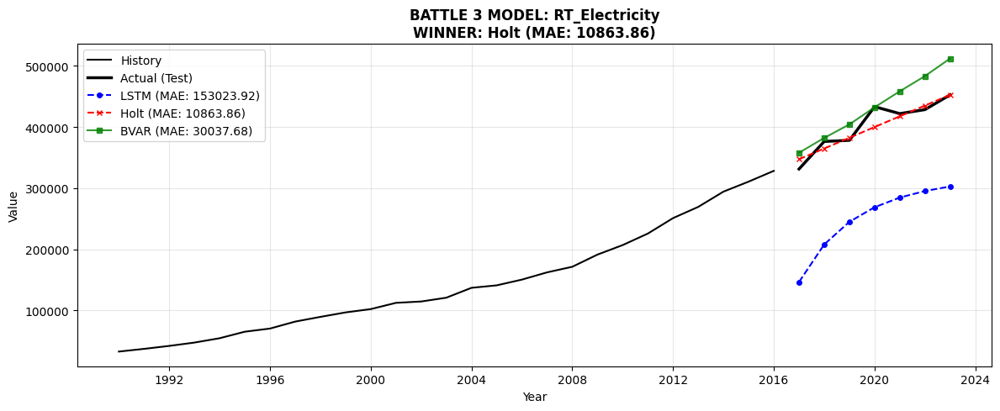

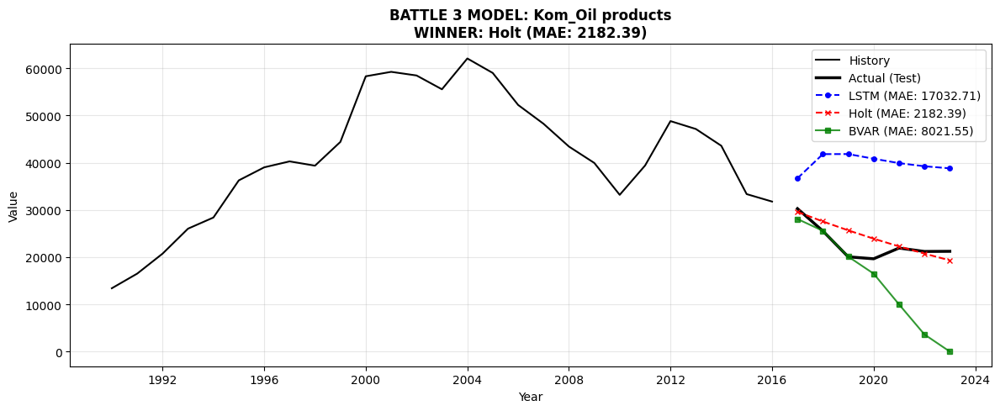

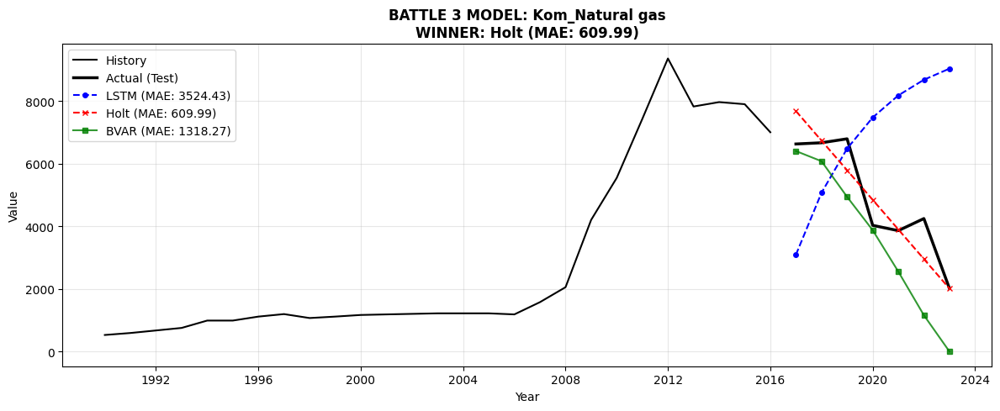

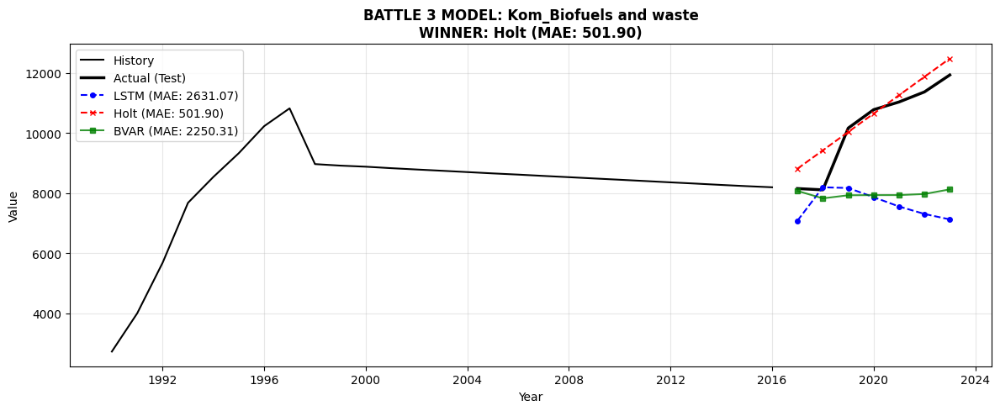

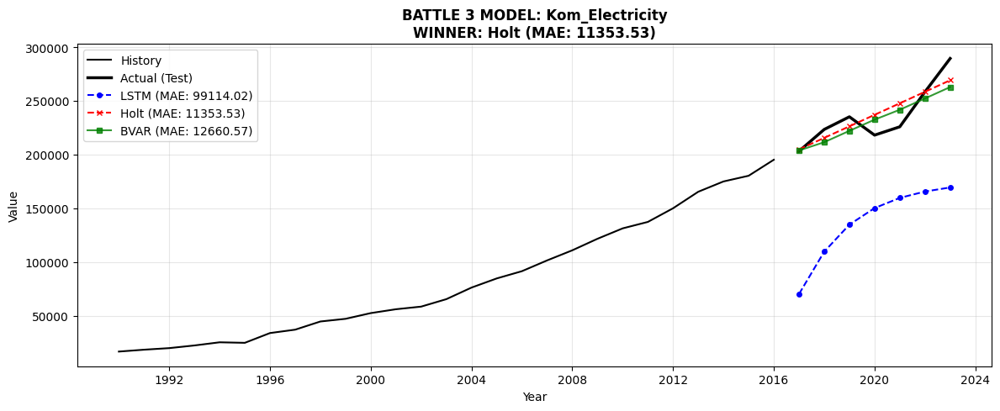


=== LEADERBOARD: LSTM vs HOLT vs BVAR ===
Primary Metric: MAE (Lower is Better)


,Variable,Best Model,Best MAE,LSTM MAE,Holt MAE,BVAR MAE,LSTM RMSE,Holt RMSE,BVAR RMSE,LSTM MAPE (%),Holt MAPE (%),BVAR MAPE (%)
0,Ind_Coal and coal products,Holt,34195.78,286770.97,34195.78,121623.39,313518.17,39545.05,136895.10,49.90,6.23,21.06
1,Ind_Natural gas,Holt,24421.71,128938.81,24421.71,69432.81,147196.18,31482.33,75188.05,21.07,3.88,11.46
2,Ind_Biofuels and waste,Holt,22783.44,54285.68,22783.44,155231.66,69182.45,23510.22,186232.91,15.74,7.32,46.01
3,Ind_Electricity,Holt,21494.19,303545.56,21494.19,222140.60,319165.00,26863.72,262222.29,57.27,4.50,38.51
4,Ind_Oil and oil products,Holt,21490.71,151172.33,21490.71,194797.17,160465.13,24346.70,212449.07,56.79,7.51,72.86
5,RT_Oil products,Holt,3429.74,88274.70,3429.74,63990.53,94187.19,4380.71,69054.44,22.76,0.89,16.47
6,RT_Natural gas,Holt,196.32,2260.17,196.32,988.05,2711.66,236.87,1332.35,72.04,8.21,28.07
7,RT_Biofuels and waste,Holt,5729.27,166663.36,5729.27,23251.81,167555.51,7349.29,24409.64,124.20,3.89,18.47
8,RT_Electricity,Holt,10863.86,153023.92,10863.86,30037.68,154149.95,15012.37,36451.38,38.64,2.75,7.33
9,Kom_Oil products,Holt,2182.39,17032.71,2182.39,8021.55,17670.89,2879.59,11440.85,78.74,10.36,37.28



SKOR AKHIR (Jumlah Variabel yang Dimenangkan):
Best Model
Holt    13
Name: count, dtype: int64

🏆 JUARA UMUM: Holt (Menang di 13 variabel)


In [ ]:
# ==============================================================================
# KOMPARASI 3 MODEL: Seq2Seq LSTM vs Holt's Trend vs BVAR (MAE BASED)
# ==============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
from matplotlib.ticker import MaxNLocator

# ==========================================
# LOAD DATA BVAR
# ==========================================
try:
    bvar_df = pd.read_csv("bvar_forecast_result.csv")

    if 'Year' in bvar_df.columns:
        bvar_df['Year'] = bvar_df['Year'].astype(int)
        bvar_df = bvar_df.set_index('Year')

    print("Data BVAR berhasil dimuat.")
    bvar_available = True

except FileNotFoundError:
    print("WARNING: File 'bvar_forecast_result.csv' tidak ditemukan!")
    bvar_available = False
    bvar_df = pd.DataFrame()

# ==========================================
# CONTAINER
# ==========================================
comp_results = []

print("\nMenghitung perbandingan performa 3 Model (MAE-based)...\n")

# ==========================================
# LOOP
# ==========================================
for col in test_df.columns:

    # ---------------------------------------------------------
    # A. DATA
    # ---------------------------------------------------------
    actual = test_df[col]

    pred_lstm = forecast_df[col]
    pred_holt = forecasts[col].loc[actual.index]

    # BVAR
    if bvar_available:
        col_r_dot = col.replace(" ", ".")
        col_r_score = col.replace(" ", "_")

        if col in bvar_df.columns:
            raw_bvar = bvar_df[col]
        elif col_r_dot in bvar_df.columns:
            raw_bvar = bvar_df[col_r_dot]
        elif col_r_score in bvar_df.columns:
            raw_bvar = bvar_df[col_r_score]
        else:
            raw_bvar = pd.Series(0, index=actual.index)
            print(f"Warning: Kolom '{col}' tidak ditemukan di CSV BVAR.")

        pred_bvar = raw_bvar.reindex(actual.index).fillna(0)
    else:
        pred_bvar = pd.Series(0, index=actual.index)

    # ---------------------------------------------------------
    # B. METRICS
    # ---------------------------------------------------------
    def get_metrics(act, pred):
        mae = mean_absolute_error(act, pred)
        rmse = np.sqrt(mean_squared_error(act, pred))
        mask = act != 0
        mape = np.mean(np.abs((act[mask] - pred[mask]) / act[mask])) * 100
        return mae, rmse, mape

    mae_a, rmse_a, mape_a = get_metrics(actual, pred_lstm)
    mae_b, rmse_b, mape_b = get_metrics(actual, pred_holt)

    if bvar_available:
        mae_c, rmse_c, mape_c = get_metrics(actual, pred_bvar)
    else:
        mae_c, rmse_c, mape_c = np.inf, np.inf, np.inf

    # ---------------------------------------------------------
    # C. BEST MODEL (MAE)
    # ---------------------------------------------------------
    scores = {
        "LSTM": mae_a,
        "Holt": mae_b,
        "BVAR": mae_c if bvar_available else 99999
    }

    winner = min(scores, key=scores.get)
    best_mae = scores[winner]

    # ---------------------------------------------------------
    # D. SAVE RESULT
    # ---------------------------------------------------------
    comp_results.append({
        "Variable": col,
        "Best Model": winner,
        "Best MAE": best_mae,

        "LSTM MAE": mae_a,
        "Holt MAE": mae_b,
        "BVAR MAE": mae_c if bvar_available else np.nan,

        "LSTM RMSE": rmse_a,
        "Holt RMSE": rmse_b,
        "BVAR RMSE": rmse_c if bvar_available else np.nan,

        "LSTM MAPE (%)": mape_a,
        "Holt MAPE (%)": mape_b,
        "BVAR MAPE (%)": mape_c if bvar_available else np.nan
    })

    # ---------------------------------------------------------
    # E. PLOT
    # ---------------------------------------------------------
    plt.figure(figsize=(12, 5))

    # History
    plt.plot(train_df.index, train_df[col], label="History", color='black')

    # Actual
    plt.plot(actual.index, actual.values, label="Actual (Test)", color='black', linewidth=2.5)

    # LSTM
    plt.plot(pred_lstm.index, pred_lstm.values,
             label=f"LSTM (MAE: {mae_a:.2f})",
             color='blue', linestyle='--', marker='o', markersize=4)

    # Holt
    plt.plot(pred_holt.index, pred_holt.values,
             label=f"Holt (MAE: {mae_b:.2f})",
             color='red', linestyle='--', marker='x', markersize=4)

    # BVAR
    if bvar_available:
        plt.plot(pred_bvar.index, pred_bvar.values,
                 label=f"BVAR (MAE: {mae_c:.2f})",
                 color='green', linestyle='-', marker='s', markersize=4, alpha=0.8)

    # Styling
    title = f"BATTLE 3 MODEL: {col}\nWINNER: {winner} (MAE: {best_mae:.2f})"
    plt.title(title, fontweight='bold')
    plt.xlabel("Year")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))

    plt.tight_layout()
    plt.show()

# ==========================================
# SUMMARY
# ==========================================
comp_df = pd.DataFrame(comp_results)

pd.set_option('display.float_format', '{:.2f}'.format)

print("\n=== LEADERBOARD: LSTM vs HOLT vs BVAR ===")
print("Primary Metric: MAE (Lower is Better)")

cols_order = [
    "Variable", "Best Model", "Best MAE",
    "LSTM MAE", "Holt MAE", "BVAR MAE",
    "LSTM RMSE", "Holt RMSE", "BVAR RMSE",
    "LSTM MAPE (%)", "Holt MAPE (%)", "BVAR MAPE (%)"
]

existing_cols = [c for c in cols_order if c in comp_df.columns]
display(comp_df[existing_cols])

# ==========================================
# WIN COUNT
# ==========================================
win_counts = comp_df['Best Model'].value_counts()

print("\nSKOR AKHIR (Jumlah Variabel yang Dimenangkan):")
print(win_counts)

if bvar_available and len(win_counts) > 0:
    best_overall = win_counts.idxmax()
    print(f"\n🏆 JUARA UMUM: {best_overall} (Menang di {win_counts.max()} variabel)")

### 🏆WINNER BY HOLT MODEL (DOUBLE EXPONENTIAL SMOOTHING)

# Forecast 7 Years Ahead for Energy Consumption

Mulai Forecasting Full History (Tanpa Zoom) & Logic Anti-Negatif...

Processing: Ind_Coal and coal products...


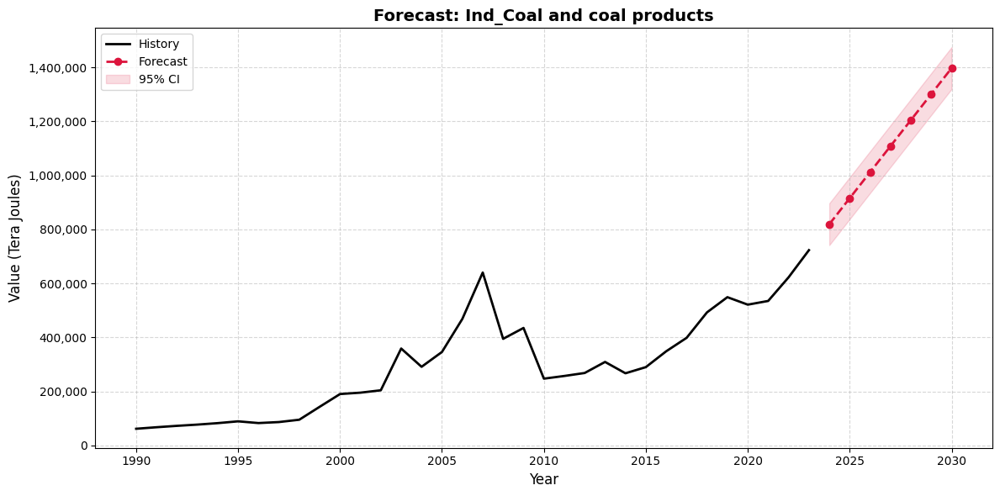

Processing: Ind_Natural gas...


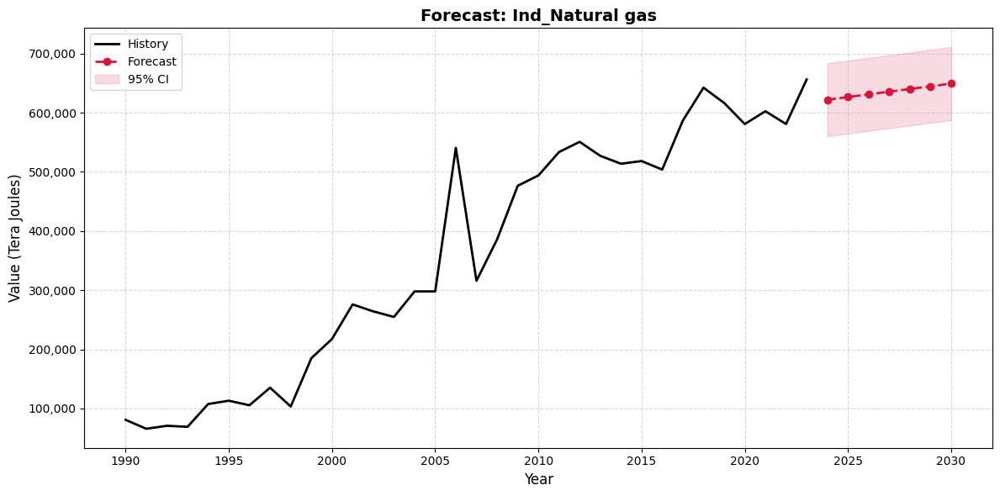

Processing: Ind_Biofuels and waste...


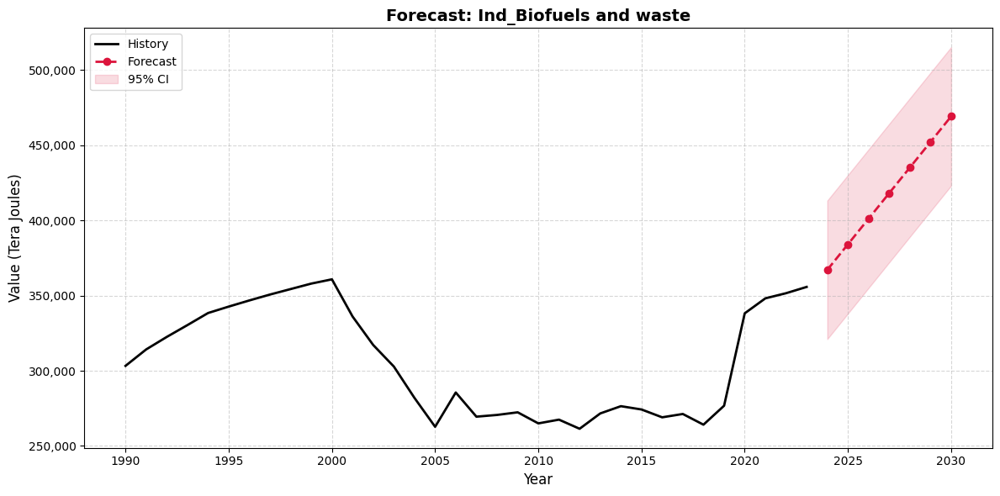

Processing: Ind_Electricity...


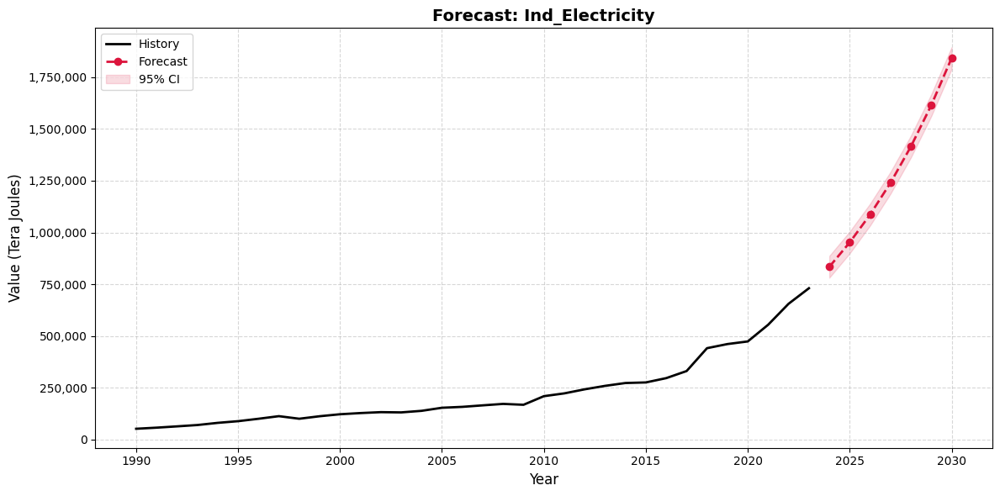

Processing: Ind_Oil and oil products...


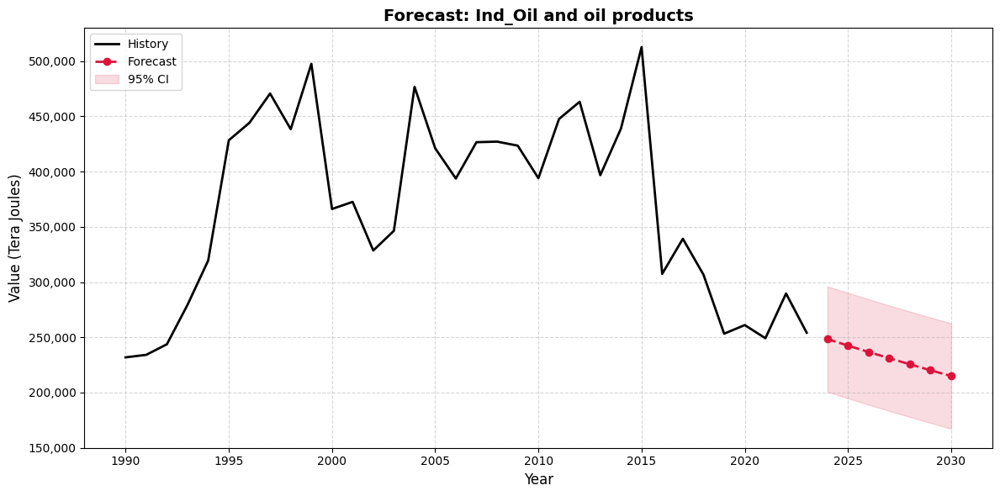

Processing: RT_Oil products...


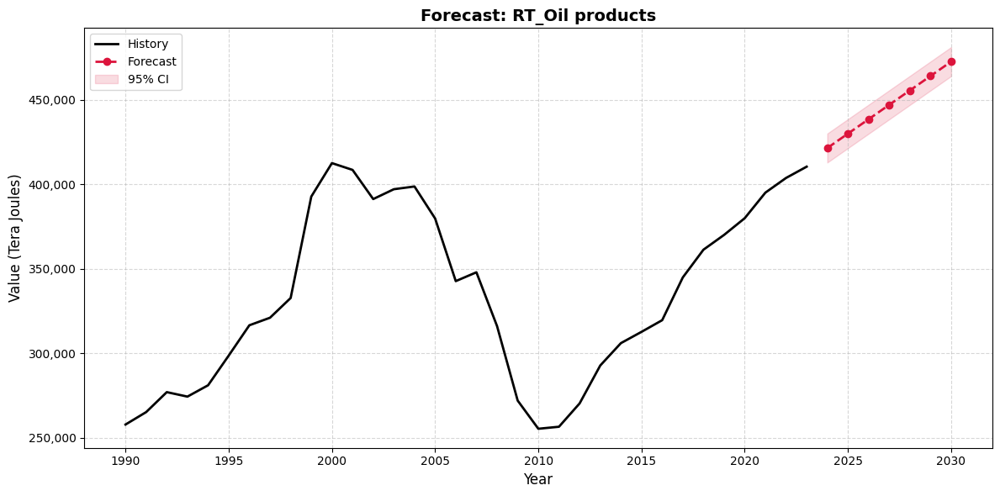

Processing: RT_Natural gas...


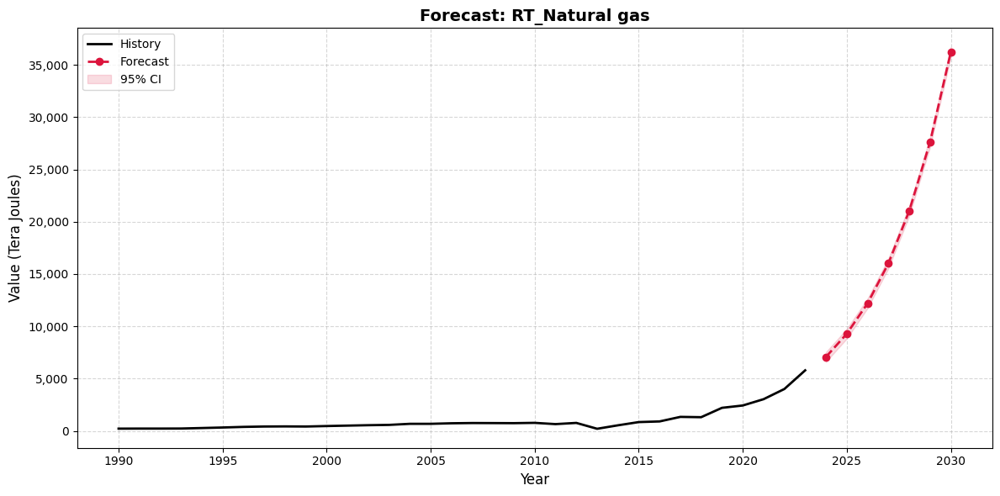

Processing: RT_Biofuels and waste...


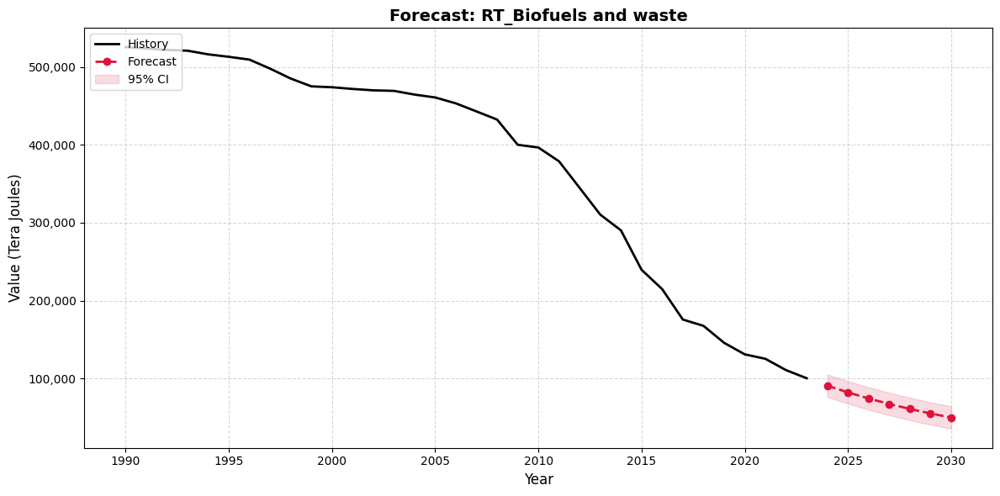

Processing: RT_Electricity...


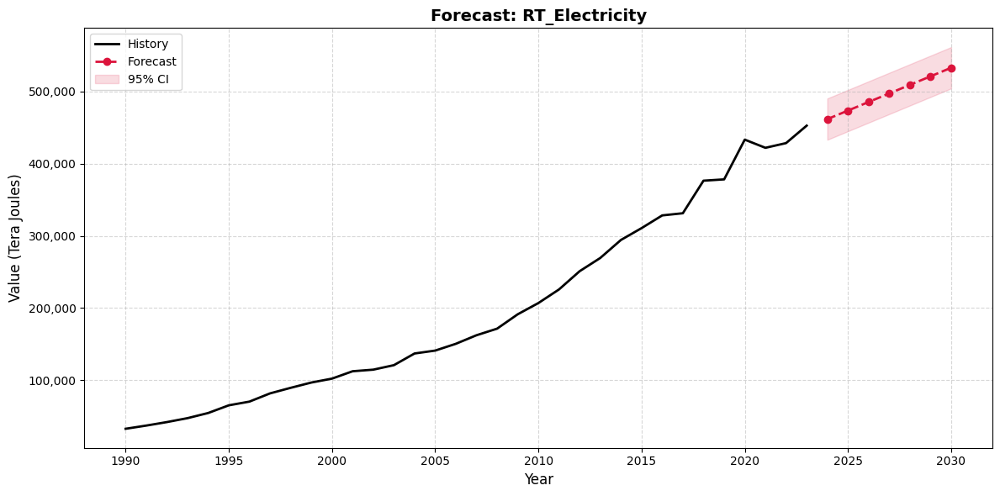

Processing: Kom_Oil products...


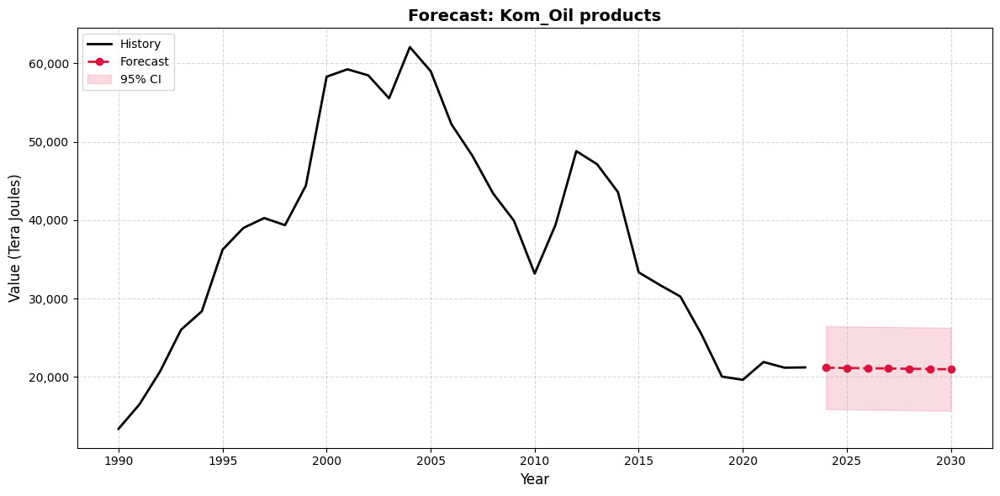

Processing: Kom_Natural gas...


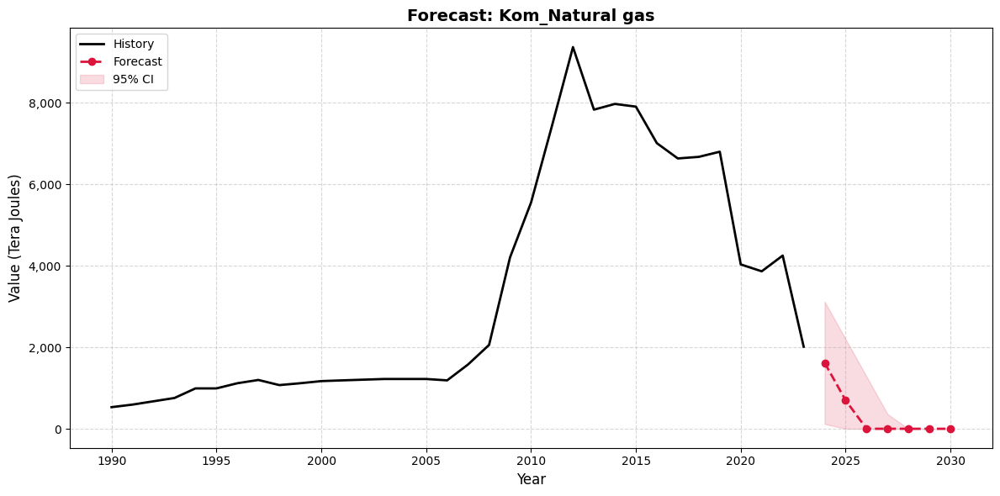

Processing: Kom_Biofuels and waste...


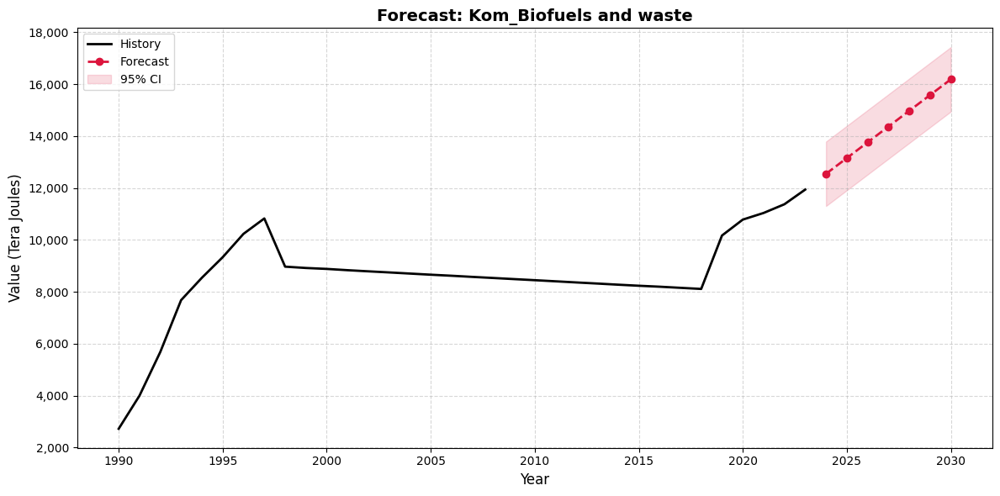

Processing: Kom_Electricity...


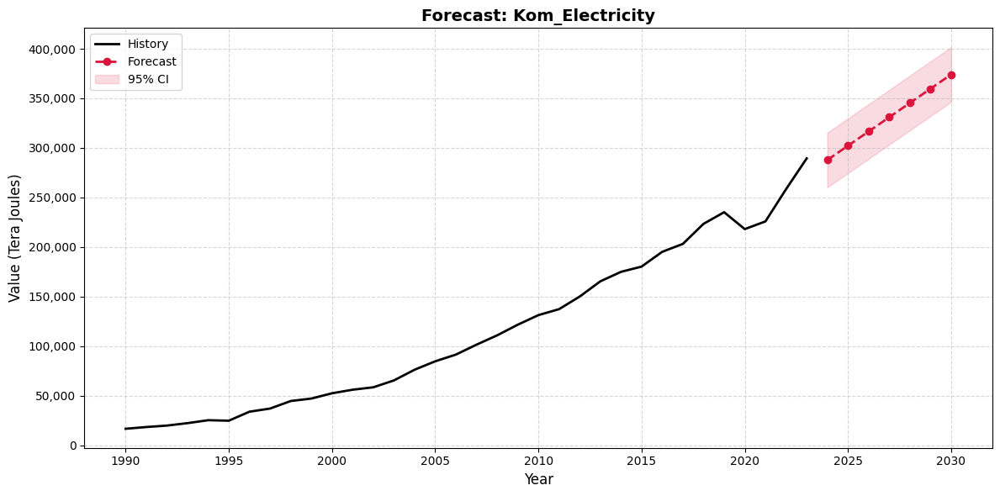


=== DATA FORECAST LENGKAP (7 TAHUN) ===


,Variable,Year,Forecast_Value,Lower_Bound_95,Upper_Bound_95,Trend_Type,Damped
0,Ind_Coal and coal products,2024,819536.71,742028.42,897045.00,add,False
1,Ind_Coal and coal products,2025,915934.14,838425.85,993442.43,add,False
2,Ind_Coal and coal products,2026,1012331.58,934823.29,1089839.87,add,False
3,Ind_Coal and coal products,2027,1108729.02,1031220.73,1186237.31,add,False
4,Ind_Coal and coal products,2028,1205126.46,1127618.17,1282634.75,add,False
5,Ind_Coal and coal products,2029,1301523.89,1224015.61,1379032.18,add,False
6,Ind_Coal and coal products,2030,1397921.33,1320413.04,1475429.62,add,False
7,Ind_Natural gas,2024,621918.79,560213.42,683624.16,add,False
8,Ind_Natural gas,2025,626467.47,564762.10,688172.84,add,False
9,Ind_Natural gas,2026,631016.15,569310.79,692721.52,add,False



=== SUMMARY VIEW (PIVOT) ===


Variable,Ind_Biofuels and waste,Ind_Coal and coal products,Ind_Electricity,Ind_Natural gas,Ind_Oil and oil products,Kom_Biofuels and waste,Kom_Electricity,Kom_Natural gas,Kom_Oil products,RT_Biofuels and waste,RT_Electricity,RT_Natural gas,RT_Oil products
Year,,,,,,,,,,,,,
2024,367141.75,819536.71,834184.70,621918.79,248433.97,12544.95,287817.25,1616.99,21190.89,90802.89,461626.29,7081.48,421452.30
2025,384156.86,915934.14,951939.21,626467.47,242512.33,13151.45,302194.66,697.34,21157.04,82171.77,473479.81,9295.51,429978.30
2026,401171.96,1012331.58,1086316.08,631016.15,236731.84,13757.95,316572.08,0.00,21123.24,74361.07,485333.32,12201.76,438504.31
2027,418187.06,1108729.02,1239661.76,635564.83,231089.13,14364.45,330949.49,0.00,21089.50,67292.81,497186.83,16016.64,447030.31
2028,435202.17,1205126.46,1414653.89,640113.51,225580.92,14970.94,345326.90,0.00,21055.81,60896.40,509040.34,21024.25,455556.31
2029,452217.27,1301523.89,1614348.13,644662.19,220204.00,15577.44,359704.32,0.00,21022.18,55108.00,520893.85,27597.49,464082.32
2030,469232.38,1397921.33,1842231.44,649210.88,214955.25,16183.94,374081.73,0.00,20988.60,49869.80,532747.36,36225.86,472608.32


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
import warnings
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from matplotlib.ticker import MaxNLocator, FuncFormatter

warnings.filterwarnings("ignore")

# ==========================================
# 0. SETUP DATA
# ==========================================
# Pastikan 'data_energy' sudah ada di environment Anda sebelumnya
df = data_energy.copy()

if 'Year' in df.columns:
    df = df.set_index("Year")

try:
    df.index = df.index.astype(int)
except Exception:
    pass

cols = df.columns
forecast_horizon = 7
all_forecast_data = []

# ==========================================
# 1. PROCESS LOOP
# ==========================================
alpha_grid = np.linspace(0.01, 0.99, 7)
beta_grid  = np.linspace(0.01, 0.99, 7)
trend_opts = ["add", "mul"]
damped_opts = [False, True]

print(f"Mulai Forecasting Full History (Tanpa Zoom) & Logic Anti-Negatif...\n")

for col in cols:
    print(f"Processing: {col}...")
    y = df[col]

    # --- A. GRID SEARCH (Validasi) ---
    n = len(y)
    train_n = int(n * 0.8)
    train = y.iloc[:train_n]
    test  = y.iloc[train_n:]

    best_rmse = np.inf
    best_params = None

    # Mencari parameter terbaik
    for trend, damped, alpha, beta in itertools.product(trend_opts, damped_opts, alpha_grid, beta_grid):
        try:
            model = ExponentialSmoothing(train, trend=trend, seasonal=None, damped_trend=damped)
            fit = model.fit(smoothing_level=float(alpha), smoothing_trend=float(beta), optimized=False)
            pred_test = fit.forecast(len(test))
            rmse = np.sqrt(mean_squared_error(test, pred_test))

            if rmse < best_rmse:
                best_rmse = rmse
                best_params = {
                    "trend": trend, "damped": damped,
                    "alpha": alpha, "beta": beta,
                    "validation_rmse": rmse
                }
        except:
            continue

    # Fallback jika grid search gagal
    if best_params is None:
        best_params = {"trend": "add", "damped": False, "alpha": 0.5, "beta": 0.5, "validation_rmse": 0}

    # --- B. REFIT & FORECAST (Full Data) ---
    try:
        final_model = ExponentialSmoothing(y,
                                           trend=best_params['trend'],
                                           seasonal=None,
                                           damped_trend=best_params['damped'])

        final_fit = final_model.fit(smoothing_level=best_params['alpha'],
                                    smoothing_trend=best_params['beta'],
                                    optimized=False)

        # 1. Generate Forecast Awal
        future_forecast = final_fit.forecast(forecast_horizon)

        last_year = y.index.max()
        future_years = np.arange(last_year + 1, last_year + forecast_horizon + 1)
        future_forecast.index = future_years

        # 2. Hitung Confidence Interval
        margin_error = 1.96 * best_params['validation_rmse']

        raw_upper = future_forecast + margin_error
        raw_lower = future_forecast - margin_error

        # 3. >>> LOGIC SAFETY CLIP (PENTING) <<<
        # Paksa semua nilai (Forecast, Upper, Lower) minimal 0.
        # Ini mencegah grafik menembus ke angka negatif.
        future_forecast = future_forecast.clip(lower=0)
        upper_bound = raw_upper.clip(lower=0)
        lower_bound = raw_lower.clip(lower=0)

        # 4. Simpan Data ke List
        for yr, val, low, up in zip(future_years, future_forecast, lower_bound, upper_bound):
            all_forecast_data.append({
                "Variable": col,
                "Year": yr,
                "Forecast_Value": val,
                "Lower_Bound_95": low,
                "Upper_Bound_95": up,
                "Trend_Type": best_params['trend'],
                "Damped": best_params['damped']
            })

        # --- C. PLOTTING (Full Data & Real Number Format) ---
        plt.figure(figsize=(12, 6))

        # Plot History (Garis Hitam)
        plt.plot(y.index, y.values, label='History', color='black', linewidth=2)

        # Plot Forecast (Garis Merah Putus-putus)
        plt.plot(future_forecast.index, future_forecast.values, label='Forecast', color='crimson', linestyle='--', linewidth=2, marker='o')

        # Plot Area Confidence Interval (Arsiran)
        plt.fill_between(future_forecast.index, lower_bound, upper_bound, color='crimson', alpha=0.15, label='95% CI')

        # Formatting Judul & Label
        plt.title(f"Forecast: {col}", fontsize=14, fontweight='bold')
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Value (Tera Joules)", fontsize=12)
        plt.legend(loc='upper left')
        plt.grid(True, linestyle='--', alpha=0.5)

        # Atur Sumbu X (Tahun) agar bilangan bulat
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))

        # >>> FORMAT Y-AXIS (PENTING) <<<
        # Mengubah angka 1.5e6 menjadi 1,500,000 (pake koma)
        def comma_formatter(x, pos):
            return f'{x:,.0f}'

        plt.gca().yaxis.set_major_formatter(FuncFormatter(comma_formatter))

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error forecasting {col}: {e}")

# ==========================================
# 2. OUTPUT DATA
# ==========================================
forecast_df = pd.DataFrame(all_forecast_data)

print("\n=== DATA FORECAST LENGKAP (7 TAHUN) ===")
# Format tampilan tabel agar 2 angka belakang koma
pd.set_option('display.float_format', '{:.2f}'.format)

# Tampilkan 15 baris pertama data mentah
display(forecast_df.head(15))

# Tampilkan Summary View (Pivot Table: Tahun vs Variabel)
print("\n=== SUMMARY VIEW (PIVOT) ===")
pivot_view = forecast_df.pivot(index="Year", columns="Variable", values="Forecast_Value")
display(pivot_view)

In [ ]:
# ==========================================
# 3. LONG FORMAT (ALL INTO TYPE + VALUE)
# ==========================================

combined_rows = []

# --- A. HISTORY (Actual) ---
for col in df.columns:
    for yr, val in zip(df.index, df[col]):
        combined_rows.append({
            "Variable": col,
            "Year": yr,
            "Value": val,
            "Type": "Actual"
        })

# --- B. FORECAST + CI ---
for _, row in forecast_df.iterrows():
    # Forecast
    combined_rows.append({
        "Variable": row["Variable"],
        "Year": row["Year"],
        "Value": row["Forecast_Value"],
        "Type": "Forecast"
    })

    # Lower Bound
    combined_rows.append({
        "Variable": row["Variable"],
        "Year": row["Year"],
        "Value": row["Lower_Bound_95"],
        "Type": "Lower_95"
    })

    # Upper Bound
    combined_rows.append({
        "Variable": row["Variable"],
        "Year": row["Year"],
        "Value": row["Upper_Bound_95"],
        "Type": "Upper_95"
    })

# --- C. Final DataFrame ---
final_tableau_df = pd.DataFrame(combined_rows)

final_tableau_df = final_tableau_df.sort_values(["Variable", "Year"])

print("=== DATA LONG FORMAT SIAP TABLEAU ===")
display(final_tableau_df.head(20))

# Export
final_tableau_df.to_csv("energy_forecast_long_format.csv", index=False)
final_tableau_df.to_excel("energy_forecast_long_format.xlsx", index=False)

=== DATA LONG FORMAT SIAP TABLEAU ===


,Variable,Year,Value,Type
68,Ind_Biofuels and waste,1990,303274.00,Actual
69,Ind_Biofuels and waste,1991,314200.00,Actual
70,Ind_Biofuels and waste,1992,322533.00,Actual
71,Ind_Biofuels and waste,1993,330395.00,Actual
72,Ind_Biofuels and waste,1994,338427.00,Actual
73,Ind_Biofuels and waste,1995,342704.00,Actual
74,Ind_Biofuels and waste,1996,346791.00,Actual
75,Ind_Biofuels and waste,1997,350718.00,Actual
76,Ind_Biofuels and waste,1998,354359.00,Actual
77,Ind_Biofuels and waste,1999,357998.00,Actual


# Transfer Entrophy

>>> Menyiapkan Data Transfer Entropy...
Jumlah variabel      : 16
Panjang time series  : 34
Jumlah bin digunakan : 5
Variabel Energi : ['Ind_Coal and coal products', 'Ind_Natural gas', 'Ind_Biofuels and waste', 'Ind_Electricity', 'Ind_Oil and oil products', 'RT_Oil products', 'RT_Natural gas', 'RT_Biofuels and waste', 'RT_Electricity', 'Kom_Oil products', 'Kom_Natural gas', 'Kom_Biofuels and waste', 'Kom_Electricity']
Variabel Iklim  : ['Emission_CO₂', 'Emission_GRK', 'Temperature']
>>> Menghitung Transfer Entropy untuk lag k = [1, 2, 3, 4, 5]
   → Lag k = 1
   → Lag k = 2
   → Lag k = 3
   → Lag k = 4
   → Lag k = 5
Jumlah hubungan signifikan : 5


,Source,Target,Direction,Lag_k,TE,p_value
0,Ind_Coal and coal products,Emission_CO₂,Energi → Iklim,1,0.51,0.08
1,Ind_Oil and oil products,Emission_GRK,Energi → Iklim,2,0.76,0.08
2,Kom_Biofuels and waste,Emission_CO₂,Energi → Iklim,1,0.50,0.10
3,Temperature,Ind_Natural gas,Iklim → Energi,1,0.77,0.00
4,Temperature,RT_Natural gas,Iklim → Energi,1,0.76,0.01


Hubungan dengan Lag Dominan:


,Source,Target,Direction,Lag_k,TE,p_value
0,Ind_Coal and coal products,Emission_CO₂,Energi → Iklim,1,0.51,0.08
1,Ind_Oil and oil products,Emission_GRK,Energi → Iklim,2,0.76,0.08
2,Kom_Biofuels and waste,Emission_CO₂,Energi → Iklim,1,0.50,0.10
3,Temperature,Ind_Natural gas,Iklim → Energi,1,0.77,0.00
4,Temperature,RT_Natural gas,Iklim → Energi,1,0.76,0.01


Top Net Transfer Entropy:


,Source,Target,Lag_k,Net_TE
3,Temperature,Ind_Natural gas,1,0.77
4,Temperature,RT_Natural gas,1,0.76
1,Ind_Oil and oil products,Emission_GRK,2,0.76
0,Ind_Coal and coal products,Emission_CO₂,1,0.51
2,Kom_Biofuels and waste,Emission_CO₂,1,0.50



=== VISUALISASI LAG k = 1 ===


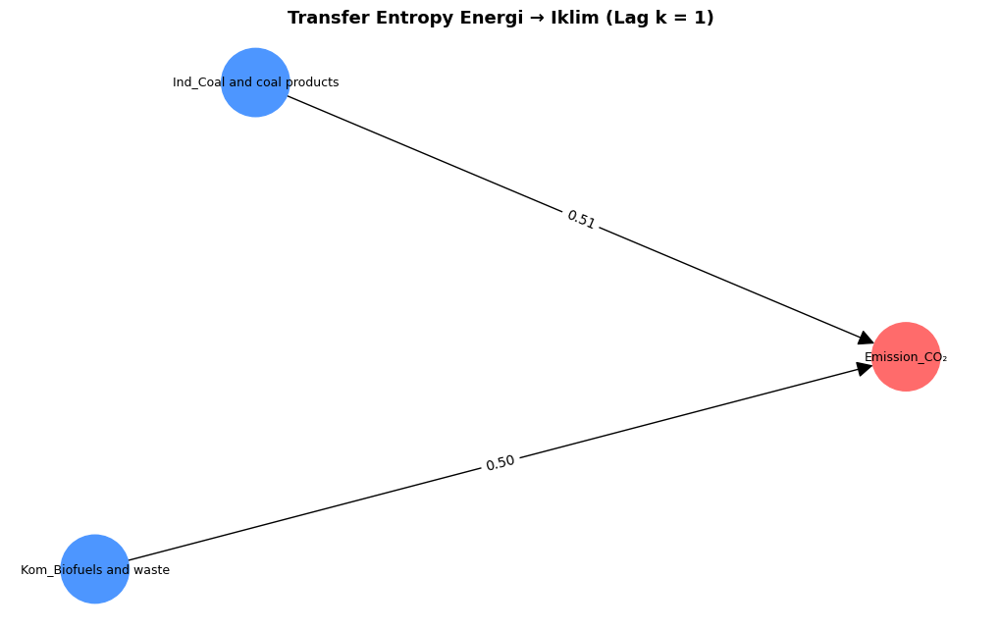

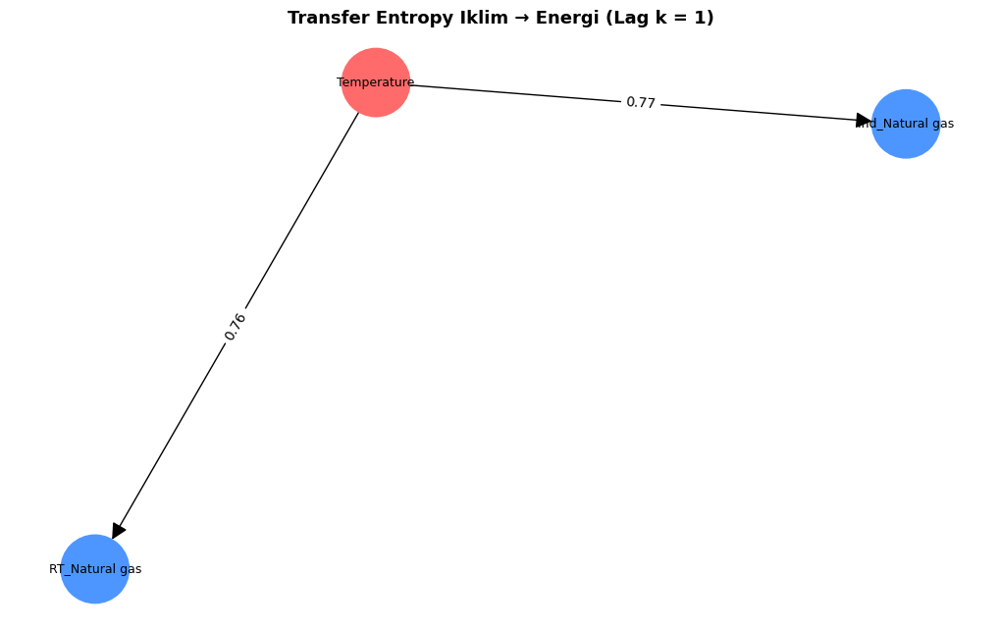


=== VISUALISASI LAG k = 2 ===


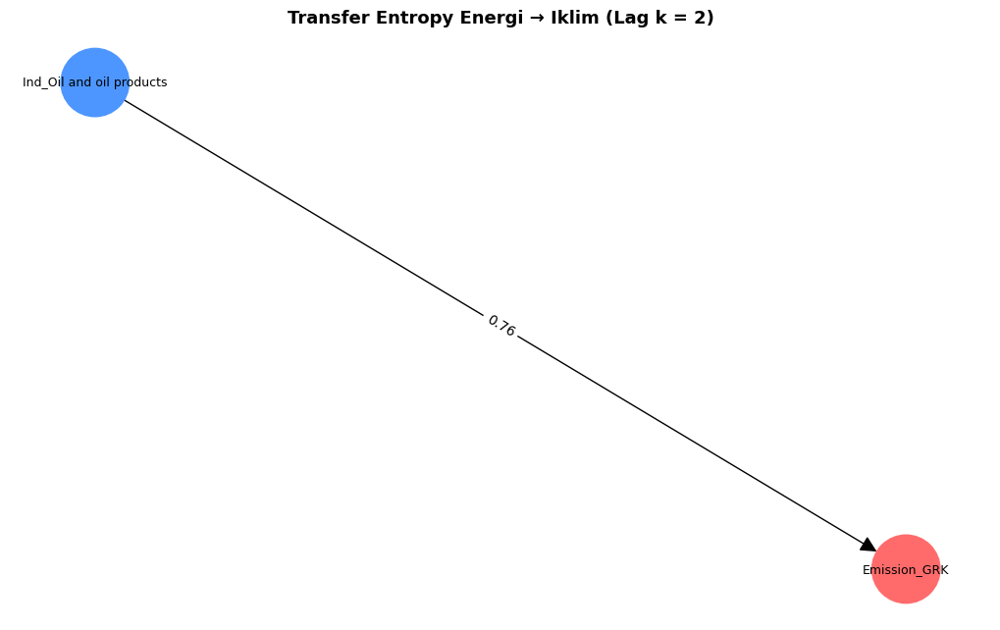

Tidak ada hubungan signifikan untuk divisualisasikan.

=== VISUALISASI LAG k = 3 ===
Tidak ada hubungan signifikan untuk divisualisasikan.
Tidak ada hubungan signifikan untuk divisualisasikan.

=== VISUALISASI LAG k = 4 ===
Tidak ada hubungan signifikan untuk divisualisasikan.
Tidak ada hubungan signifikan untuk divisualisasikan.

=== VISUALISASI LAG k = 5 ===
Tidak ada hubungan signifikan untuk divisualisasikan.
Tidak ada hubungan signifikan untuk divisualisasikan.


In [ ]:
# ==================================================
# 1. SETUP & IMPORT
# ==================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import warnings
import pyinform

warnings.filterwarnings("ignore")
np.random.seed(42)


# ==================================================
# 2. PERSIAPAN DATA
# ==================================================
print(">>> Menyiapkan Data Transfer Entropy...")

df = pd.merge(data_energy, data_iklim, on="Year", how="inner")
df = df.drop(columns=["Year"])
var_names = df.columns.tolist()

print(f"Jumlah variabel      : {len(var_names)}")
print(f"Panjang time series  : {len(df)}")


# ==================================================
# 3. DISCRETIZATION (ADAPTIF)
# ==================================================
def optimal_bins(n):
    return max(3, int(np.sqrt(n)))

N_BINS = optimal_bins(len(df))
print(f"Jumlah bin digunakan : {N_BINS}")

def discretize_series(series, n_bins):
    try:
        return pd.qcut(series, q=n_bins, labels=False, duplicates='drop').astype(int)
    except:
        return pd.cut(series, bins=n_bins, labels=False).astype(int)

df_disc = df.apply(lambda x: discretize_series(x, N_BINS))


# ==================================================
# 4. TRANSFER ENTROPY + SHUFFLE TEST
# ==================================================
def transfer_entropy_test(source, target, k=1, n_shuffle=300):
    te_real = pyinform.transfer_entropy(source, target, k=k)

    count = 0
    for _ in range(n_shuffle):
        src_perm = np.random.permutation(source)
        te_perm = pyinform.transfer_entropy(src_perm, target, k=k)
        if te_perm >= te_real:
            count += 1

    p_value = (count + 1) / (n_shuffle + 1)
    return te_real, p_value


# ==================================================
# 5. DEFINISI KELOMPOK VARIABEL
# ==================================================
energy_cols = [c for c in var_names if any(x in c for x in ["Energy", "Ind_", "RT_", "Kom_", "Total"])]
climate_cols = [c for c in var_names if c not in energy_cols]

print("Variabel Energi :", energy_cols)
print("Variabel Iklim  :", climate_cols)


# ==================================================
# 6. EKSEKUSI TRANSFER ENTROPY MULTI-LAG (k = 1–5)
# ==================================================
results = []

K_LIST = range(1, 6)   # <<< lag 1 sampai 5 tahun
ALPHA = 0.10

print(f">>> Menghitung Transfer Entropy untuk lag k = {list(K_LIST)}")

for K in K_LIST:
    print(f"   → Lag k = {K}")

    # Energi → Iklim
    for e in energy_cols:
        for c in climate_cols:
            te, p = transfer_entropy_test(
                df_disc[e].values,
                df_disc[c].values,
                k=K
            )
            results.append({
                "Source": e,
                "Target": c,
                "Direction": "Energi → Iklim",
                "Lag_k": K,
                "TE": te,
                "p_value": p
            })

    # Iklim → Energi
    for c in climate_cols:
        for e in energy_cols:
            te, p = transfer_entropy_test(
                df_disc[c].values,
                df_disc[e].values,
                k=K
            )
            results.append({
                "Source": c,
                "Target": e,
                "Direction": "Iklim → Energi",
                "Lag_k": K,
                "TE": te,
                "p_value": p
            })

df_te = pd.DataFrame(results)


# ==================================================
# 7. FILTER SIGNIFIKANSI
# ==================================================
df_sig = (
    df_te[df_te["p_value"] < ALPHA]
    .sort_values(["Source", "Target", "Lag_k"])
    .reset_index(drop=True)
)

print(f"Jumlah hubungan signifikan : {len(df_sig)}")

if not df_sig.empty:
    display(df_sig.head(10))
else:
    print(">>> Tidak ada hubungan signifikan pada alpha = 0.1")


# ==================================================
# 8. LAG DOMINAN (TE TERBESAR PER PASANGAN)
# ==================================================
if not df_sig.empty:
    df_best_lag = (
        df_sig
        .sort_values("TE", ascending=False)
        .groupby(["Source", "Target", "Direction"])
        .first()
        .reset_index()
    )

    print("Hubungan dengan Lag Dominan:")
    display(df_best_lag)
else:
    df_best_lag = pd.DataFrame()


# ==================================================
# 9. NET TRANSFER ENTROPY (PER LAG, AMAN)
# ==================================================
def compute_net_te(df_sig):
    if df_sig.empty:
        return pd.DataFrame(columns=["Source", "Target", "Lag_k", "Net_TE"])

    net_rows = []

    for _, row in df_sig.iterrows():
        src, tgt, k = row["Source"], row["Target"], row["Lag_k"]
        te_ab = row["TE"]

        reverse = df_sig[
            (df_sig["Source"] == tgt) &
            (df_sig["Target"] == src) &
            (df_sig["Lag_k"] == k)
        ]

        te_ba = reverse["TE"].values[0] if not reverse.empty else 0

        net_rows.append({
            "Source": src,
            "Target": tgt,
            "Lag_k": k,
            "Net_TE": te_ab - te_ba
        })

    return pd.DataFrame(net_rows)

df_net = compute_net_te(df_sig)

if df_net.empty:
    print("Tidak ada Net Transfer Entropy signifikan.")
else:
    df_net = (
        df_net[df_net["Net_TE"] > 0]
        .sort_values("Net_TE", ascending=False)
    )
    print("Top Net Transfer Entropy:")
    display(df_net.head())


# ==================================================
# 10. VISUALISASI GRAPH (PER LAG)
# ==================================================
def plot_te_graph(df_plot, title):
    if df_plot.empty:
        print("Tidak ada hubungan signifikan untuk divisualisasikan.")
        return

    G = nx.DiGraph()
    for _, r in df_plot.iterrows():
        G.add_edge(r["Source"], r["Target"], weight=r["TE"])

    pos = nx.spring_layout(G, seed=42, k=2)

    node_colors = [
        "#FF6B6B" if n in climate_cols else "#4D96FF"
        for n in G.nodes()
    ]

    plt.figure(figsize=(10, 6))
    nx.draw(
        G, pos,
        with_labels=True,
        node_color=node_colors,
        node_size=2500,
        font_size=9,
        arrowsize=25
    )

    edge_labels = nx.get_edge_attributes(G, "weight")
    edge_labels = {k: f"{v:.2f}" for k, v in edge_labels.items()}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

    plt.title(title, fontsize=13, fontweight="bold")
    plt.axis("off")
    plt.show()


# ==================================================
# 11. EKSEKUSI VISUALISASI PER LAG
# ==================================================
for k in K_LIST:
    print(f"\n=== VISUALISASI LAG k = {k} ===")

    plot_te_graph(
        df_sig[
            (df_sig["Direction"] == "Energi → Iklim") &
            (df_sig["Lag_k"] == k)
        ],
        f"Transfer Entropy Energi → Iklim (Lag k = {k})"
    )

    plot_te_graph(
        df_sig[
            (df_sig["Direction"] == "Iklim → Energi") &
            (df_sig["Lag_k"] == k)
        ],
        f"Transfer Entropy Iklim → Energi (Lag k = {k})"
    )


In [ ]:
# ==================================================
# 12. EXPORT HASIL KE EXCEL
# ==================================================
print("\n>>> Menyimpan hasil tabel ke Excel...")

# Tentukan nama file Excel-nya
file_excel = "Hasil_Transfer_Entropy.xlsx"

try:
    # Pakai ExcelWriter biar bisa nyimpen banyak tabel di sheet yang beda-beda
    with pd.ExcelWriter(file_excel, engine='openpyxl') as writer:

        # 1. Sheet untuk SEMUA hasil perhitungan
        df_te.to_excel(writer, sheet_name='Semua_Hasil', index=False)

        # 2. Sheet untuk hasil yang SIGNIFIKAN saja
        if not df_sig.empty:
            df_sig.to_excel(writer, sheet_name='Signifikan', index=False)

        # 3. Sheet untuk LAG DOMINAN
        if not df_best_lag.empty:
            df_best_lag.to_excel(writer, sheet_name='Lag_Dominan', index=False)

        # 4. Sheet untuk NET TRANSFER ENTROPY
        if not df_net.empty:
            df_net.to_excel(writer, sheet_name='Net_TE', index=False)

    print(f"Mantap bro! Data berhasil di-convert dan disimpan di file: {file_excel}")

except Exception as e:
    print(f"Waduh, ada error pas save ke Excel: {e}")
    print("Coba pastikan kamu udah install library openpyxl ya (pip install openpyxl)")


>>> Menyimpan hasil tabel ke Excel...
Mantap bro! Data berhasil di-convert dan disimpan di file: Hasil_Transfer_Entropy.xlsx


In [ ]:
# ==================================================
# 12. EXPORT KE EXCEL
# ==================================================

# Cara 1: Export khusus tabel df_sig (Semua yang signifikan)
if not df_sig.empty:
    df_sig.to_excel("hasil_te_signifikan.xlsx", index=False)
    print("Mantap! Data signifikan berhasil disimpan ke 'hasil_te_signifikan.xlsx'")
else:
    print("Gagal export: Tidak ada data yang signifikan.")

Mantap! Data signifikan berhasil disimpan ke 'hasil_te_signifikan.xlsx'


# Seq2Seq LSTM FORECASTING CLIMATE CHANGE

In [ ]:
# ==========================================
# 1. FILTER KOLOM BERDASARKAN HASIL TE
# ==========================================
# Masukkan nama kolom persis sesuai tabel TE kamu tadi
selected_features = [
    # Iklim
    'Temperature', 'Emission_GRK', 'Emission_CO₂', 'Kom_Biofuels and waste','Ind_Coal and coal products','Ind_Oil and oil products',
    # Energi (Top Drivers dari tabel)
    'RT_Natural gas','Ind_Natural gas'
]

# Pastikan hanya mengambil kolom yang ada di df kamu
existing_cols = [c for c in selected_features if c in df.columns]
data_lstm = df[existing_cols].copy()

print(f"Total Fitur yang masuk model: {len(existing_cols)}")
print(existing_cols)

Total Fitur yang masuk model: 8
['Temperature', 'Emission_GRK', 'Emission_CO₂', 'Kom_Biofuels and waste', 'Ind_Coal and coal products', 'Ind_Oil and oil products', 'RT_Natural gas', 'Ind_Natural gas']


In [ ]:
data_lstm
data_lstm = data_lstm.copy()

data_lstm['Year'] = data_iklim['Year'].values
data_lstm

,Temperature,Emission_GRK,Emission_CO₂,Kom_Biofuels and waste,Ind_Coal and coal products,Ind_Oil and oil products,RT_Natural gas,Ind_Natural gas,Year
0,0.08,1012411400,154990690,2727,61881,231873,224,80811,1990
1,0.21,994146200,174754220,4002,67563,234142,230,65717,1991
2,0.20,1196247200,199298020,5685,72705,243716,230,70786,1992
3,0.20,1100796400,214962850,7681,77301,279413,235,68989,1993
4,0.31,1324479200,219199950,8543,82752,319465,282,107559,1994
5,0.34,1252830300,222225300,9334,89431,428311,333,113142,1995
6,0.36,1218626600,252855740,10234,83029,444160,391,105474,1996
7,0.38,3027978500,279695600,10826,86727,470639,426,135167,1997
8,0.97,1259636000,244315330,8970,95346,438361,437,103354,1998
9,0.23,1285879900,291770660,8919,143203,497496,426,185030,1999


Train=27 | Test=7
BEST MAE : 61104978.16606595
BEST PARAMS : {'units': 128, 'learning_rate': 0.001, 'batch_size': 16, 'dropout': 0.3}


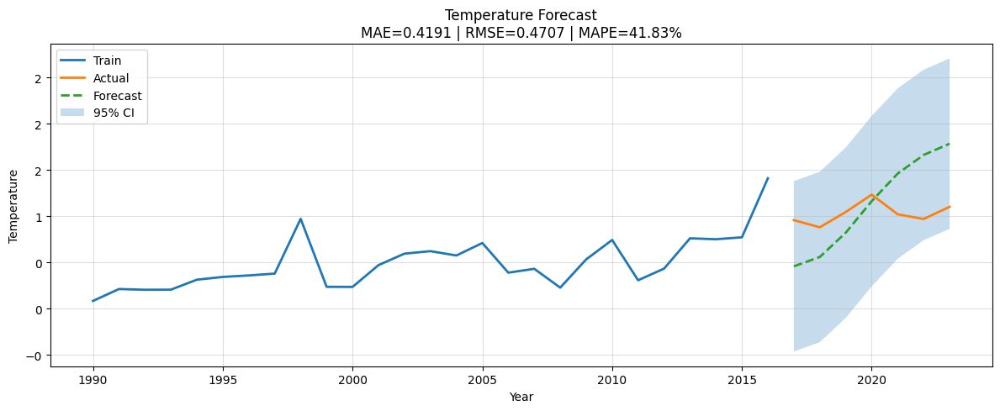

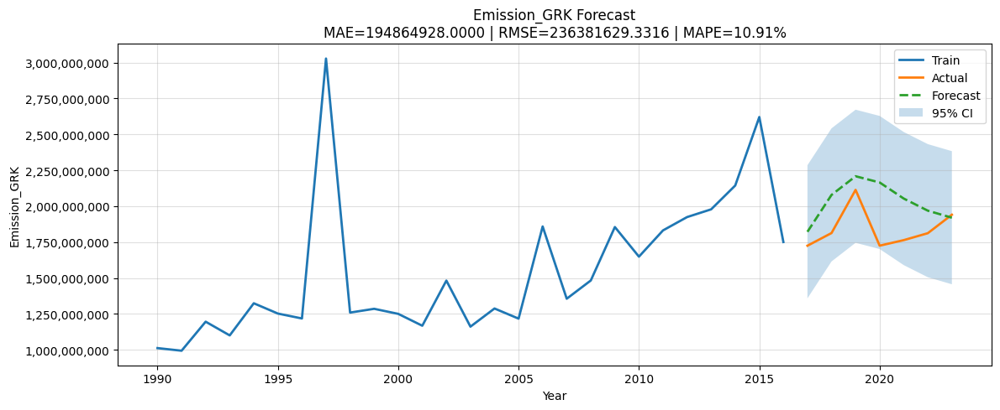

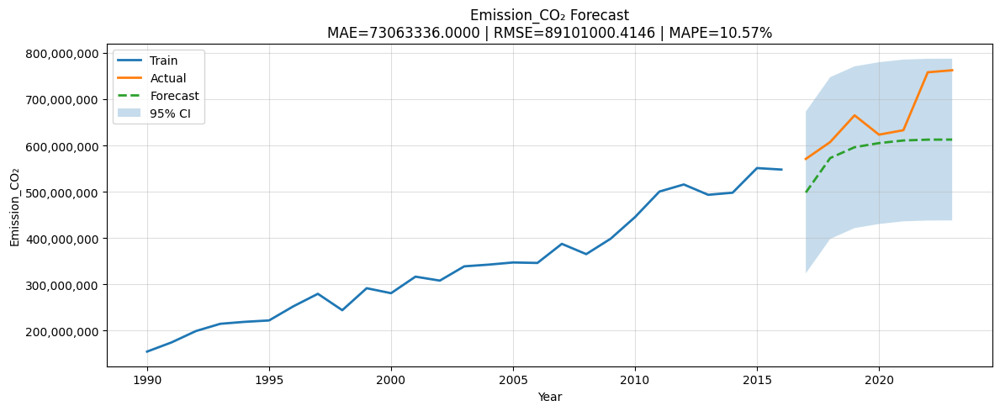

In [ ]:
# ==========================================
# 0. DETERMINISTIC ENV
# ==========================================
import os
os.environ["PYTHONHASHSEED"] = "42"
os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["TF_CUDNN_DETERMINISTIC"] = "1"

import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ==========================================
# 1. DATA PREPARATION
# ==========================================
df = data_lstm.copy()

if 'Year' in df.columns:
    df['Year'] = df['Year'].astype(int)
    df = df.set_index('Year')

df.index = df.index.astype(int)

target_cols  = ['Temperature', 'Emission_GRK', 'Emission_CO₂']
feature_cols = [c for c in df.columns if c not in target_cols]

X_df = df[feature_cols]
y_df = df[target_cols]

# Train-Test Split (80-20, FIX)
n = len(df)
train_n = int(n * 0.8)

X_train = X_df.iloc[:train_n]
X_test  = X_df.iloc[train_n:]

y_train = y_df.iloc[:train_n]
y_test  = y_df.iloc[train_n:]

print(f"Train={len(X_train)} | Test={len(X_test)}")

# ==========================================
# 2. SCALING
# ==========================================
from sklearn.preprocessing import StandardScaler

scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled  = scaler_X.transform(X_test)

y_train_scaled = scaler_y.fit_transform(y_train)
y_test_scaled  = scaler_y.transform(y_test)

# ==========================================
# 3. SEQUENCE SETUP
# ==========================================
N_PAST   = 15
N_FUTURE = len(X_test)

N_FEATURES = X_train_scaled.shape[1]
N_TARGETS  = y_train_scaled.shape[1]

def create_fixed_horizon_sequences(X, y, n_past, n_future):
    Xs, Ys = [], []
    for i in range(len(X) - n_past - n_future + 1):
        Xs.append(X[i:i+n_past])
        Ys.append(y[i+n_past:i+n_past+n_future])
    return np.array(Xs), np.array(Ys)

X_train_full, y_train_full = create_fixed_horizon_sequences(
    X_train_scaled, y_train_scaled, N_PAST, N_FUTURE
)

# Validation split (FIX, NO SHUFFLE)
val_idx = int(len(X_train_full) * 0.9)

X_train_opt = X_train_full[:val_idx]
y_train_opt = y_train_full[:val_idx]
X_val_opt   = X_train_full[val_idx:]
y_val_opt   = y_train_full[val_idx:]

# ==========================================
# 4. OPTUNA OBJECTIVE (DETERMINISTIC)
# ==========================================
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error

def objective(trial):

    tf.keras.backend.clear_session()
    random.seed(SEED)
    np.random.seed(SEED)
    tf.random.set_seed(SEED)

    units = trial.suggest_categorical("units", [64, 128])
    lr = trial.suggest_categorical("learning_rate", [0.01, 0.001])
    batch_size = trial.suggest_categorical("batch_size", [16, 32])
    dropout = trial.suggest_float("dropout", 0.1, 0.3, step=0.02)

    inputs = Input(shape=(N_PAST, N_FEATURES))

    encoder = LSTM(
        units,
        activation="tanh",
        dropout=dropout,
        recurrent_dropout=0.0
    )(inputs)

    repeat = RepeatVector(N_FUTURE)(encoder)

    decoder = LSTM(
        units,
        activation="tanh",
        return_sequences=True,
        dropout=dropout,
        recurrent_dropout=0.0
    )(repeat)

    outputs = TimeDistributed(Dense(N_TARGETS))(decoder)

    model = Model(inputs, outputs)

    model.compile(
        optimizer=Adam(learning_rate=lr, clipvalue=0.5),
        loss="mse"
    )

    es = EarlyStopping(
        patience=10,
        restore_best_weights=True
    )

    model.fit(
        X_train_opt,
        y_train_opt,
        validation_data=(X_val_opt, y_val_opt),
        epochs=150,
        batch_size=batch_size,
        shuffle=False,      # 🔒 penting
        callbacks=[es],
        verbose=0
    )

    pred_val = model.predict(X_val_opt, verbose=0)

    pred_real = scaler_y.inverse_transform(
        pred_val.reshape(-1, N_TARGETS)
    )

    y_real = scaler_y.inverse_transform(
        y_val_opt.reshape(-1, N_TARGETS)
    )

    return mean_absolute_error(y_real, pred_real)

# ==========================================
# 5. RUN OPTUNA (FIXED SAMPLER)
# ==========================================
import optuna

sampler = optuna.samplers.TPESampler(seed=SEED)

study = optuna.create_study(
    direction="minimize",
    sampler=sampler
)

study.optimize(objective, n_trials=20)

print("BEST MAE :", study.best_value)
print("BEST PARAMS :", study.best_params)

# ==========================================
# 6. FINAL MODEL (RETRAIN FULL DATA)
# ==========================================
p = study.best_params

tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

inputs = Input(shape=(N_PAST, N_FEATURES))

encoder = LSTM(
    p["units"],
    activation="tanh",
    dropout=p["dropout"]
)(inputs)

repeat = RepeatVector(N_FUTURE)(encoder)

decoder = LSTM(
    p["units"],
    activation="tanh",
    return_sequences=True,
    dropout=p["dropout"]
)(repeat)

outputs = TimeDistributed(Dense(N_TARGETS))(decoder)

model_final = Model(inputs, outputs)

model_final.compile(
    optimizer=Adam(learning_rate=p["learning_rate"], clipvalue=0.5),
    loss="mse"
)

model_final.fit(
    X_train_full,
    y_train_full,
    epochs=150,
    batch_size=p["batch_size"],
    shuffle=False,
    verbose=0
)

# ==========================================
# 7. FORECAST
# ==========================================
last_window = X_train_scaled[-N_PAST:].reshape(1, N_PAST, N_FEATURES)

pred_scaled = model_final.predict(last_window, verbose=0)

pred_real = scaler_y.inverse_transform(
    pred_scaled.reshape(N_FUTURE, N_TARGETS)
)

forecast_df = pd.DataFrame(
    pred_real,
    columns=target_cols,
    index=y_test.index
)

forecast_df

# ==========================================
# 8. EVALUASI & VISUALISASI
# ==========================================
from sklearn.metrics import mean_squared_error

for col in target_cols:
    actual = y_test[col]
    pred   = forecast_df[col]

    mae  = mean_absolute_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mape = np.mean(np.abs((actual - pred) / actual)) * 100

    # Confidence Interval (asumsi normal)
    margin = 1.96 * rmse
    upper  = pred + margin
    lower  = pred - margin

    years_train = y_train.index.astype(int)
    years_test  = actual.index.astype(int)

    plt.figure(figsize=(12,5))

    # Train
    plt.plot(
        years_train,
        y_train[col],
        label="Train",
        linewidth=2
    )

    # Actual
    plt.plot(
        years_test,
        actual,
        label="Actual",
        linewidth=2
    )

    # Forecast
    plt.plot(
        years_test,
        pred,
        linestyle="--",
        label="Forecast",
        linewidth=2
    )

    plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

    # Confidence Interval
    plt.fill_between(
        years_test,
        lower,
        upper,
        alpha=0.25,
        label="95% CI"
    )

    plt.title(
        f"{col} Forecast\n"
        f"MAE={mae:.4f} | RMSE={rmse:.4f} | MAPE={mape:.2f}%"
    )

    plt.xlabel("Year")
    plt.ylabel(col)
    plt.legend()
    plt.grid(alpha=0.4)
    plt.tight_layout()
    plt.show()


Train=27 | Test=7
BEST MAE : 61104978.16606595
BEST PARAMS : {'units': 128, 'learning_rate': 0.001, 'batch_size': 16, 'dropout': 0.3}
      Temperature  Emission_GRK  Emission_CO₂
Year                                         
2017         0.46 1821923840.00  498365792.00
2018         0.56 2078731136.00  572811712.00
2019         0.82 2208646144.00  596217408.00
2020         1.16 2165310720.00  605095872.00
2021         1.46 2053363328.00  610775424.00
2022         1.66 1969059072.00  612563840.00
2023         1.78 1919973120.00  612710592.00


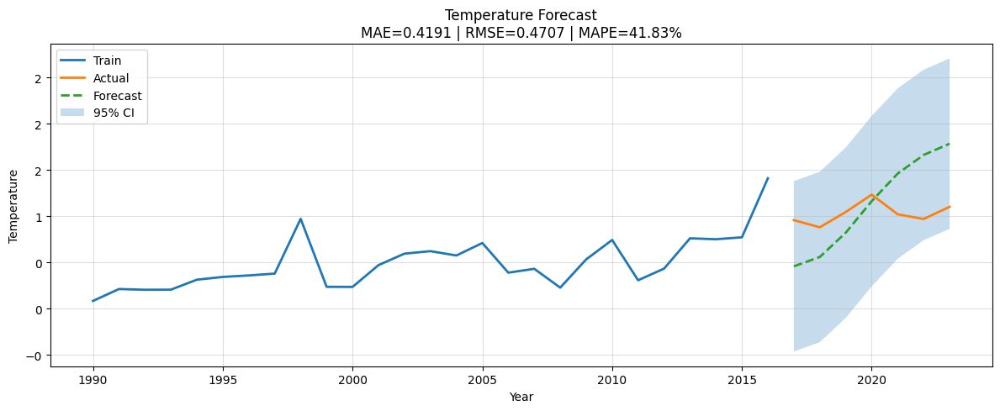

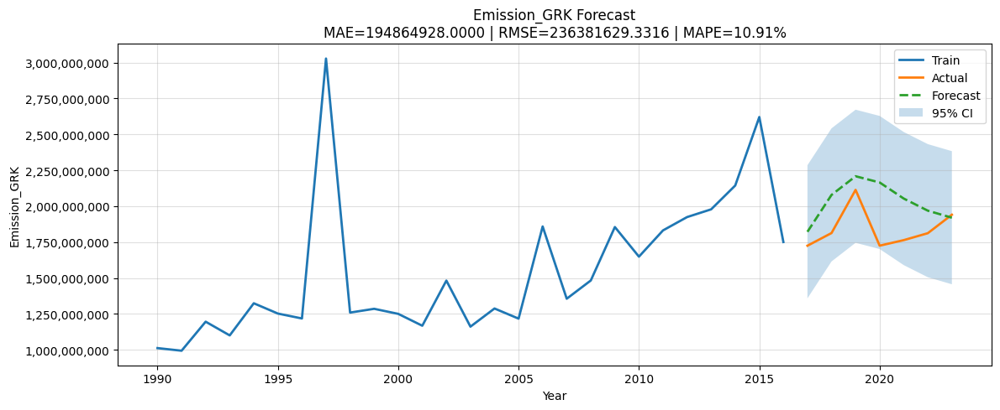

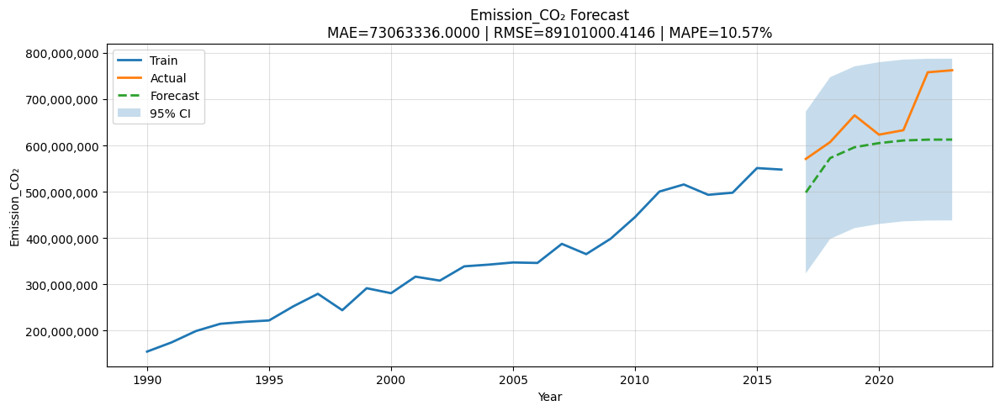

       Variable          MAE         RMSE  MAPE (%)    CI Margin
0   Temperature         0.42         0.47     41.83         0.92
2  Emission_CO₂  73063336.00  89101000.41     10.57 174637960.81
1  Emission_GRK 194864928.00 236381629.33     10.91 463307993.49
✅ Metrics berhasil disimpan ke evaluation_metrics_lstm.xlsx


In [ ]:
# ==========================================
# 0. DETERMINISTIC ENV
# ==========================================
import os
os.environ["PYTHONHASHSEED"] = "42"
os.environ["TF_DETERMINISTIC_OPS"] = "1"
os.environ["TF_CUDNN_DETERMINISTIC"] = "1"

import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ==========================================
# 1. DATA PREPARATION
# ==========================================
df = data_lstm.copy()

if 'Year' in df.columns:
    df['Year'] = df['Year'].astype(int)
    df = df.set_index('Year')

df.index = df.index.astype(int)

target_cols  = ['Temperature', 'Emission_GRK', 'Emission_CO₂']
feature_cols = [c for c in df.columns if c not in target_cols]

X_df = df[feature_cols]
y_df = df[target_cols]

# Train-Test Split (80-20)
n = len(df)
train_n = int(n * 0.8)

X_train = X_df.iloc[:train_n]
X_test  = X_df.iloc[train_n:]

y_train = y_df.iloc[:train_n]
y_test  = y_df.iloc[train_n:]

print(f"Train={len(X_train)} | Test={len(X_test)}")

# ==========================================
# 2. SCALING
# ==========================================
from sklearn.preprocessing import StandardScaler

scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled  = scaler_X.transform(X_test)

y_train_scaled = scaler_y.fit_transform(y_train)
y_test_scaled  = scaler_y.transform(y_test)

# ==========================================
# 3. SEQUENCE SETUP
# ==========================================
N_PAST   = 15
N_FUTURE = len(X_test)

N_FEATURES = X_train_scaled.shape[1]
N_TARGETS  = y_train_scaled.shape[1]

def create_fixed_horizon_sequences(X, y, n_past, n_future):
    Xs, Ys = [], []
    for i in range(len(X) - n_past - n_future + 1):
        Xs.append(X[i:i+n_past])
        Ys.append(y[i+n_past:i+n_past+n_future])
    return np.array(Xs), np.array(Ys)

X_train_full, y_train_full = create_fixed_horizon_sequences(
    X_train_scaled, y_train_scaled, N_PAST, N_FUTURE
)

# Validation split
val_idx = int(len(X_train_full) * 0.9)

X_train_opt = X_train_full[:val_idx]
y_train_opt = y_train_full[:val_idx]
X_val_opt   = X_train_full[val_idx:]
y_val_opt   = y_train_full[val_idx:]

# ==========================================
# 4. OPTUNA OBJECTIVE
# ==========================================
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error

def objective(trial):

    tf.keras.backend.clear_session()
    random.seed(SEED)
    np.random.seed(SEED)
    tf.random.set_seed(SEED)

    units = trial.suggest_categorical("units", [64, 128])
    lr = trial.suggest_categorical("learning_rate", [0.01, 0.001])
    batch_size = trial.suggest_categorical("batch_size", [16, 32])
    dropout = trial.suggest_float("dropout", 0.1, 0.3, step=0.02)

    inputs = Input(shape=(N_PAST, N_FEATURES))

    encoder = LSTM(units, activation="tanh", dropout=dropout)(inputs)

    repeat = RepeatVector(N_FUTURE)(encoder)

    decoder = LSTM(units, activation="tanh", return_sequences=True, dropout=dropout)(repeat)

    outputs = TimeDistributed(Dense(N_TARGETS))(decoder)

    model = Model(inputs, outputs)

    model.compile(
        optimizer=Adam(learning_rate=lr, clipvalue=0.5),
        loss="mse"
    )

    es = EarlyStopping(patience=10, restore_best_weights=True)

    model.fit(
        X_train_opt,
        y_train_opt,
        validation_data=(X_val_opt, y_val_opt),
        epochs=150,
        batch_size=batch_size,
        shuffle=False,
        callbacks=[es],
        verbose=0
    )

    pred_val = model.predict(X_val_opt, verbose=0)

    pred_real = scaler_y.inverse_transform(pred_val.reshape(-1, N_TARGETS))
    y_real    = scaler_y.inverse_transform(y_val_opt.reshape(-1, N_TARGETS))

    return mean_absolute_error(y_real, pred_real)

# ==========================================
# 5. RUN OPTUNA
# ==========================================
import optuna

sampler = optuna.samplers.TPESampler(seed=SEED)

study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=20)

print("BEST MAE :", study.best_value)
print("BEST PARAMS :", study.best_params)

# ==========================================
# 6. FINAL MODEL
# ==========================================
p = study.best_params

tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

inputs = Input(shape=(N_PAST, N_FEATURES))

encoder = LSTM(p["units"], activation="tanh", dropout=p["dropout"])(inputs)

repeat = RepeatVector(N_FUTURE)(encoder)

decoder = LSTM(p["units"], activation="tanh", return_sequences=True, dropout=p["dropout"])(repeat)

outputs = TimeDistributed(Dense(N_TARGETS))(decoder)

model_final = Model(inputs, outputs)

model_final.compile(
    optimizer=Adam(learning_rate=p["learning_rate"], clipvalue=0.5),
    loss="mse"
)

model_final.fit(
    X_train_full,
    y_train_full,
    epochs=150,
    batch_size=p["batch_size"],
    shuffle=False,
    verbose=0
)

# ==========================================
# 7. FORECAST
# ==========================================
last_window = X_train_scaled[-N_PAST:].reshape(1, N_PAST, N_FEATURES)

pred_scaled = model_final.predict(last_window, verbose=0)

pred_real = scaler_y.inverse_transform(pred_scaled.reshape(N_FUTURE, N_TARGETS))

forecast_df = pd.DataFrame(
    pred_real,
    columns=target_cols,
    index=y_test.index
)

print(forecast_df)

# ==========================================
# 8. EVALUASI & VISUALISASI
# ==========================================
from sklearn.metrics import mean_squared_error

metrics_list = []

for col in target_cols:
    actual = y_test[col]
    pred   = forecast_df[col]

    mae  = mean_absolute_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mape = np.mean(np.abs((actual - pred) / actual)) * 100

    margin = 1.96 * rmse
    upper  = pred + margin
    lower  = pred - margin

    # simpan metrics
    metrics_list.append({
        "Variable": col,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE (%)": mape,
        "CI Margin": margin
    })

    years_train = y_train.index.astype(int)
    years_test  = actual.index.astype(int)

    plt.figure(figsize=(12,5))

    plt.plot(years_train, y_train[col], label="Train", linewidth=2)
    plt.plot(years_test, actual, label="Actual", linewidth=2)
    plt.plot(years_test, pred, linestyle="--", label="Forecast", linewidth=2)

    plt.fill_between(years_test, lower, upper, alpha=0.25, label="95% CI")

    plt.title(
        f"{col} Forecast\n"
        f"MAE={mae:.4f} | RMSE={rmse:.4f} | MAPE={mape:.2f}%"
    )

    plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

    plt.xlabel("Year")
    plt.ylabel(col)
    plt.legend()
    plt.grid(alpha=0.4)
    plt.tight_layout()
    plt.show()

# ==========================================
# 9. SAVE TO EXCEL
# ==========================================
metrics_df = pd.DataFrame(metrics_list)
metrics_df = metrics_df.sort_values(by="RMSE")

print(metrics_df)

metrics_df.to_excel("evaluation_metrics_lstm.xlsx", index=False)

print("✅ Metrics berhasil disimpan ke evaluation_metrics_lstm.xlsx")

Training model dengan 100% data...


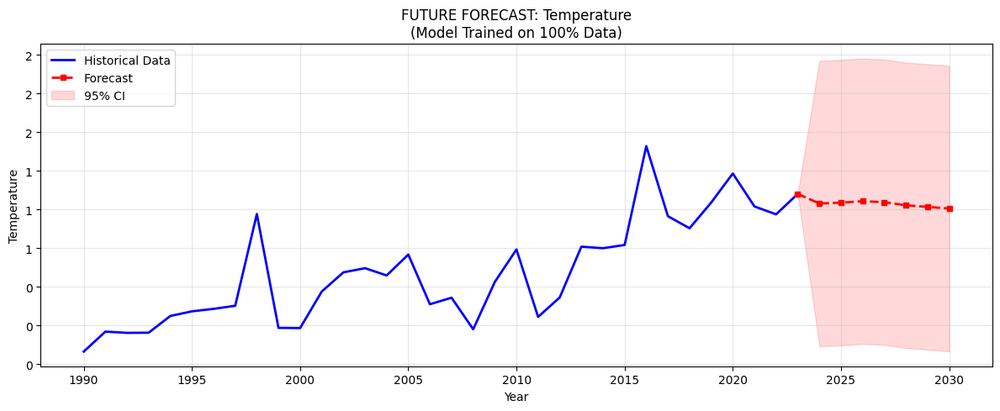

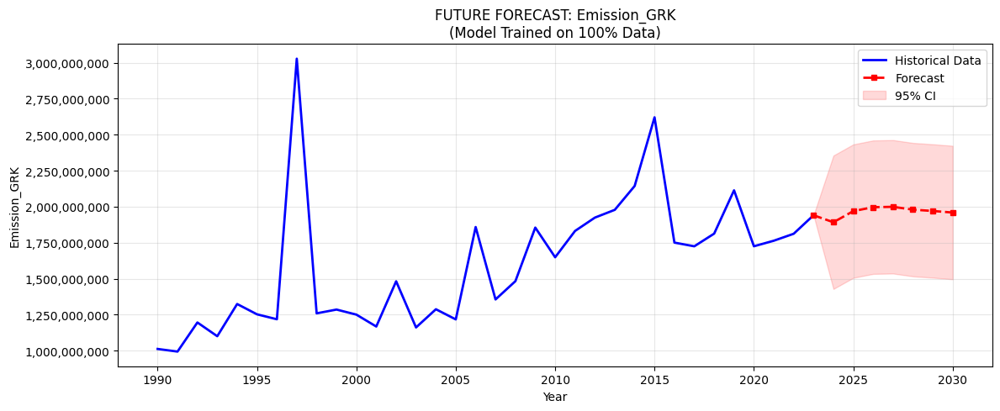

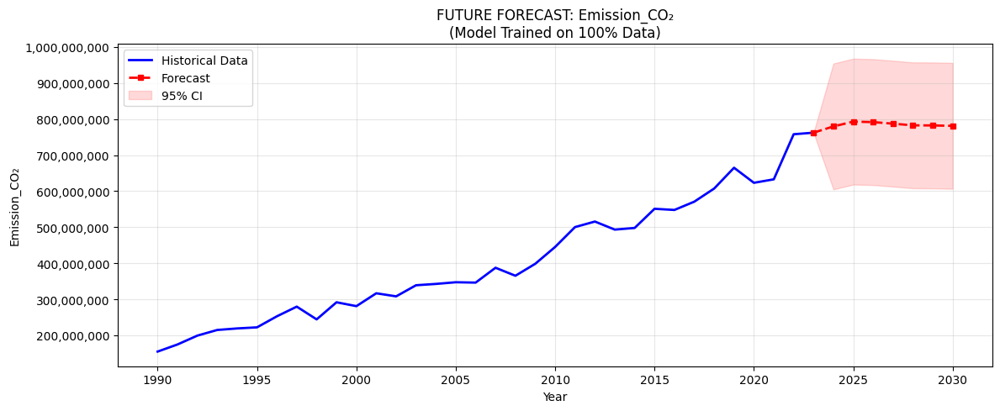


=== FORECAST TABLE ===
    Year      Variable      Forecast      CI_Lower      CI_Upper
0   2024   Temperature          1.04          0.12          1.96
1   2025   Temperature          1.04          0.12          1.97
2   2026   Temperature          1.05          0.13          1.98
3   2027   Temperature          1.05          0.12          1.97
4   2028   Temperature          1.03          0.10          1.95
5   2029   Temperature          1.02          0.09          1.94
6   2030   Temperature          1.01          0.08          1.93
7   2024  Emission_GRK 1892156416.00 1428848422.51 2355464409.49
8   2025  Emission_GRK 1969560448.00 1506252454.51 2432868441.49
9   2026  Emission_GRK 1996737024.00 1533429030.51 2460045017.49
10  2027  Emission_GRK 1999369856.00 1536061862.51 2462677849.49
11  2028  Emission_GRK 1979696640.00 1516388646.51 2443004633.49
12  2029  Emission_GRK 1970500224.00 1507192230.51 2433808217.49
13  2030  Emission_GRK 1959624576.00 1496316582.51 2422932569.49
1

In [ ]:
# ==========================================
# 9. RE-TRAIN 100% DATA
# ==========================================
future_steps = 7

print("Training model dengan 100% data...")

def create_one_step_sequences(X, y, n_past):
    Xs, Ys = [], []
    for i in range(len(X) - n_past):
        Xs.append(X[i : i + n_past])
        Ys.append(y[i + n_past])
    return np.array(Xs), np.array(Ys)

# Scaling seluruh data
X_all_scaled = scaler_X.transform(X_df)
y_all_scaled = scaler_y.transform(y_df)

X_train_rec, y_train_rec = create_one_step_sequences(X_all_scaled, y_all_scaled, N_PAST)

# Arsitektur Many-to-One (LSTM -> Dense)
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

inputs_r = Input(shape=(N_PAST, N_FEATURES))
lstm_r = LSTM(p["units"], activation="tanh", dropout=p["dropout"])(inputs_r)
outputs_r = Dense(N_TARGETS)(lstm_r)

model_rec = Model(inputs_r, outputs_r)
model_rec.compile(optimizer=Adam(learning_rate=p["learning_rate"]), loss="mse")

# Train model (naikkan sedikit epochs agar peka terhadap tren akhir)
model_rec.fit(X_train_rec, y_train_rec, epochs=300, batch_size=p["batch_size"], verbose=0)

# ==========================================
# 10. RECURSIVE LOOP & CI CALCULATION
# ==========================================
# Ambil window terakhir (15 tahun terakhir)
current_batch = X_all_scaled[-N_PAST:].reshape(1, N_PAST, N_FEATURES)
future_results = []

for i in range(future_steps):
    # Prediksi 1 langkah ke depan
    current_pred = model_rec.predict(current_batch, verbose=0)
    future_results.append(current_pred[0])

    # Geser window (Rolling)
    new_step = current_batch[:, 1:, :]
    # Asumsikan fitur eksternal konstan menggunakan nilai tahun terakhir
    last_row_features = current_batch[:, -1, :].copy()
    new_row = last_row_features.reshape(1, 1, N_FEATURES)
    current_batch = np.concatenate([new_step, new_row], axis=1)

# Inverse Scaling hasil forecast
future_preds_final = scaler_y.inverse_transform(np.array(future_results))
future_df_rec = pd.DataFrame(future_preds_final, columns=target_cols, index=future_years)

# Hitung RMSE dari Langkah 8 (Evaluasi Data Test)
rmse_eval = []
for col in target_cols:
    r = np.sqrt(mean_squared_error(y_test[col], forecast_df[col]))
    rmse_eval.append(r)

# ==========================================
# 11. PLOT FUTURE FORECAST + CI
# ==========================================
for i, col in enumerate(target_cols):
    plt.figure(figsize=(12, 5))

    # 1. Plot Data Historis (Lengkap)
    plt.plot(df.index, df[col], label="Historical Data", color='blue', linewidth=2)

    # 2. Plot Forecast (Recursive)
    # Sambungkan dari titik historis terakhir agar tidak ada gap
    last_hist_val = df[col].iloc[-1]
    last_hist_year = df.index.max()

    forecast_years = [last_hist_year] + list(future_df_rec.index)
    forecast_values = [last_hist_val] + list(future_df_rec[col])

    plt.plot(forecast_years, forecast_values, label="Forecast",
             color='red', linestyle='--', linewidth=2, marker='s', markersize=4)
    plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

    # 3. Hitung & Plot Confidence Interval (95%)
    # CI akan melebar seiring waktu (t) karena akumulasi error
    margin = 1.96 * rmse_eval[i]

    # CI untuk masa depan (dimulai dari 0 di titik terakhir histori)
    ci_lower = [last_hist_val] # Titik awal tanpa margin agar nyambung
    ci_upper = [last_hist_val]

    for val in future_df_rec[col]:
        ci_lower.append(val - margin)
        ci_upper.append(val + margin)

    plt.fill_between(forecast_years, ci_lower, ci_upper, color='red', alpha=0.15, label="95% CI")

    plt.title(f"FUTURE FORECAST: {col}\n(Model Trained on 100% Data)")
    plt.xlabel("Year")
    plt.ylabel(col)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ==========================================
# 12. TABEL AKHIR (VERSI FIX BEBAS ERROR)
# ==========================================
# 1. Siapkan list kosong dengan nama yang konsisten
data_untuk_tabel = []

# 2. Loop untuk mengisi data
for i, col in enumerate(target_cols):
    # Ambil margin dari RMSE evaluasi langkah 8
    margin = 1.96 * rmse_eval[i]

    for year in future_df_rec.index:
        f_val = future_df_rec.loc[year, col]

        # Masukkan ke list
        data_untuk_tabel.append({
            "Year": int(year),
            "Variable": col,
            "Forecast": f_val,
            "CI_Lower": f_val - margin,
            "CI_Upper": f_val + margin
        })

# 3. Ubah list menjadi DataFrame
forecast_iklim_seq2seq = pd.DataFrame(data_untuk_tabel)

# 4. Tampilkan hasil
print("\n=== FORECAST TABLE ===")
print(forecast_iklim_seq2seq .head(21)) # Menampilkan 7 tahun untuk 3 variabel

In [ ]:
forecast_iklim_seq2seq .to_csv("forecast_iklimSeq2Seq.csv", index=False)

#Komparasi Hasil

In [ ]:
# ==========================================
# LOAD BVAR FORECAST (FIX FORMAT)
# ==========================================
bvar_forecast_raw = pd.read_csv("forecast_test_BVARiklim.csv")

# Pivot ke wide format
bvar_forecast = bvar_forecast_raw.pivot(
    index="Year",
    columns="Variable",
    values="Forecast"
)

# rapihin nama kolom
bvar_forecast.columns.name = None
bvar_forecast.index = bvar_forecast.index.astype(int)

# samakan nama dengan LSTM
bvar_forecast = bvar_forecast.rename(columns={
    "Emission_CO2": "Emission_CO₂"
})

bvar_forecast = bvar_forecast[target_cols]

bvar_forecast

,Temperature,Emission_GRK,Emission_CO₂
Year,,,
2017,0.95,1903896037.75,748270297.68
2018,0.98,1932397621.46,727641655.72
2019,1.04,1949286941.86,711352055.78
2020,1.09,1983842593.30,699395097.30
2021,1.15,2038515359.38,690413862.20
2022,1.21,2040395379.13,682790579.75
2023,1.27,2069790944.27,676377971.95


In [ ]:
# ==========================================
# LOAD METRICS BVAR
# ==========================================
bvar_metrics = pd.read_csv("metrics_evaluation_BVARiklim.csv")

# samakan nama
bvar_metrics = bvar_metrics.rename(columns={
    "MAE": "MAE_BVAR",
    "RMSE": "RMSE_BVAR",
    "MAPE": "MAPE_BVAR"
})

bvar_metrics["Variable"] = bvar_metrics["Variable"].replace({
    "Emission_CO2": "Emission_CO₂"
})

bvar_metrics

,Variable,MAE_BVAR,RMSE_BVAR,MAPE_BVAR
0,Temperature,0.11,0.14,10.95
1,Emission_GRK,193235413.35,201463523.41,10.64
2,Emission_CO₂,91239503.85,100144078.85,14.33


In [ ]:
seq2seq_metrics = []

for col in target_cols:
    actual = y_test[col]
    pred   = forecast_df[col]

    mae  = mean_absolute_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mape = np.mean(np.abs((actual - pred) / actual)) * 100

    seq2seq_metrics.append({
        "Variable": col,
        "MAE_Seq2Seq": mae,
        "RMSE_Seq2Seq": rmse,
        "MAPE_Seq2Seq": mape
    })

lstm_metrics_df = pd.DataFrame(seq2seq_metrics)
lstm_metrics_df

,Variable,MAE_Seq2Seq,RMSE_Seq2Seq,MAPE_Seq2Seq
0,Temperature,0.42,0.47,41.83
1,Emission_GRK,194864928.00,236381629.33,10.91
2,Emission_CO₂,73063336.00,89101000.41,10.57


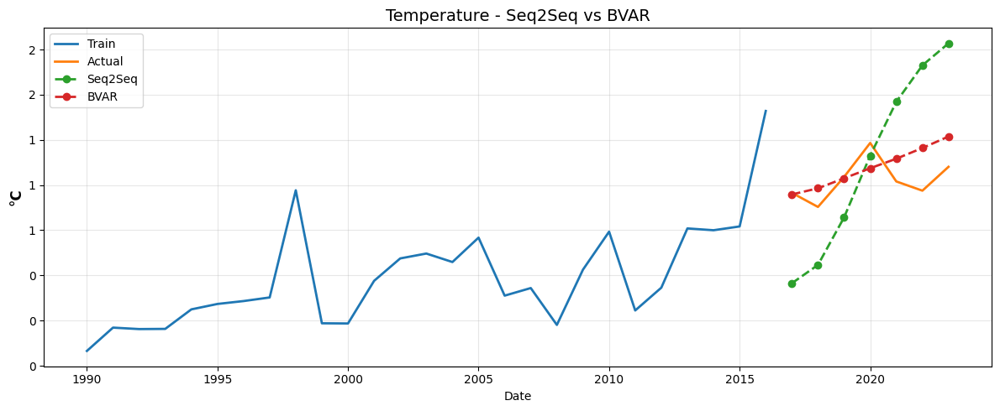

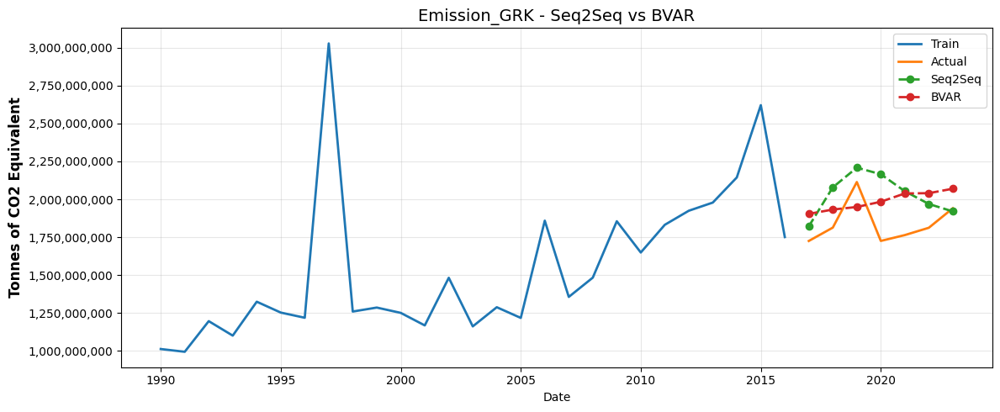

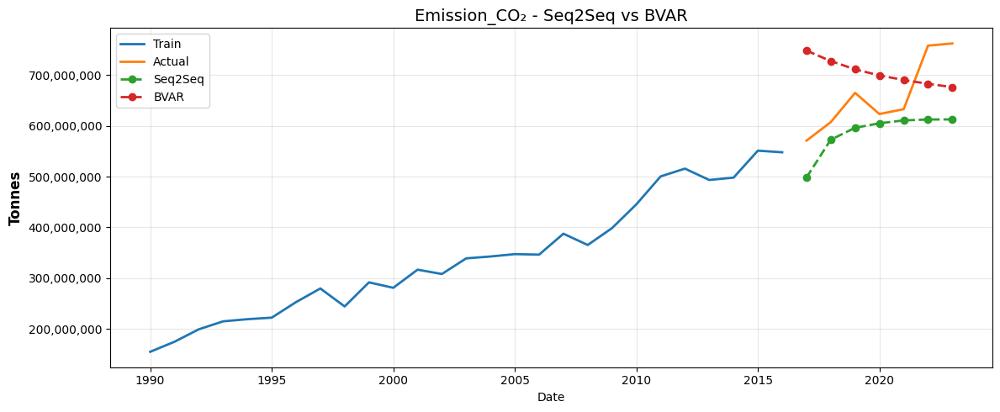

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# 1. Bikin Mapping Satuan
unit_mapping = {
    "Emission_CO₂": "Tonnes",
    "Emission_GRK": "Tonnes of CO2 Equivalent",
    "Temperature": "°C"
}

for col in target_cols:
    plt.figure(figsize=(12, 5))

    # Plotting
    plt.plot(y_train.index, y_train[col], label="Train", linewidth=2)
    plt.plot(y_test.index, y_test[col], label="Actual", linewidth=2)
    plt.plot(forecast_df.index, forecast_df[col], linestyle="--", marker="o", label="Seq2Seq", linewidth=2)
    plt.plot(bvar_forecast.index, bvar_forecast[col], linestyle="--", marker="o", label="BVAR", linewidth=2)

    # --- FORMAT SUMBU Y (ANGKA) ---
    plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

    # --- FORMAT LABEL SUMBU Y (SATUAN) ---
    # Ambil satuan dari dictionary, kalau kolom gak terdaftar defaultnya kosong
    unit = unit_mapping.get(col, "")
    plt.ylabel(unit, fontsize=12, fontweight='bold')

    plt.title(f"{col} - Seq2Seq vs BVAR", fontsize=14)
    plt.xlabel("Date")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
compare_metrics = pd.merge(
    lstm_metrics_df,
    bvar_metrics,
    on="Variable",
    how="inner"
)

compare_metrics["Best_Model"] = compare_metrics.apply(
    lambda x: "Seq2Seq" if x["MAE_Seq2Seq"] < x["MAE_BVAR"] else "BVAR",
    axis=1
)

compare_metrics

,Variable,MAE_Seq2Seq,RMSE_Seq2Seq,MAPE_Seq2Seq,MAE_BVAR,RMSE_BVAR,MAPE_BVAR,Best_Model
0,Temperature,0.42,0.47,41.83,0.11,0.14,10.95,BVAR
1,Emission_GRK,194864928.00,236381629.33,10.91,193235413.35,201463523.41,10.64,BVAR
2,Emission_CO₂,73063336.00,89101000.41,10.57,91239503.85,100144078.85,14.33,Seq2Seq


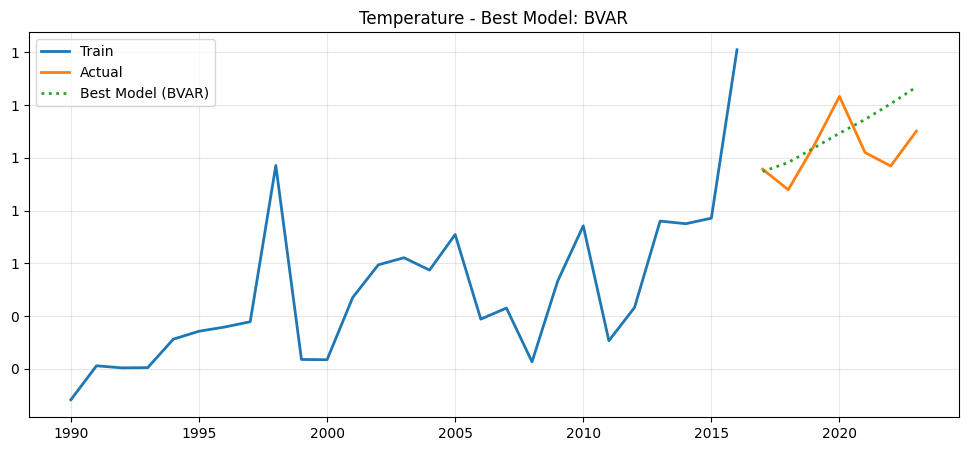

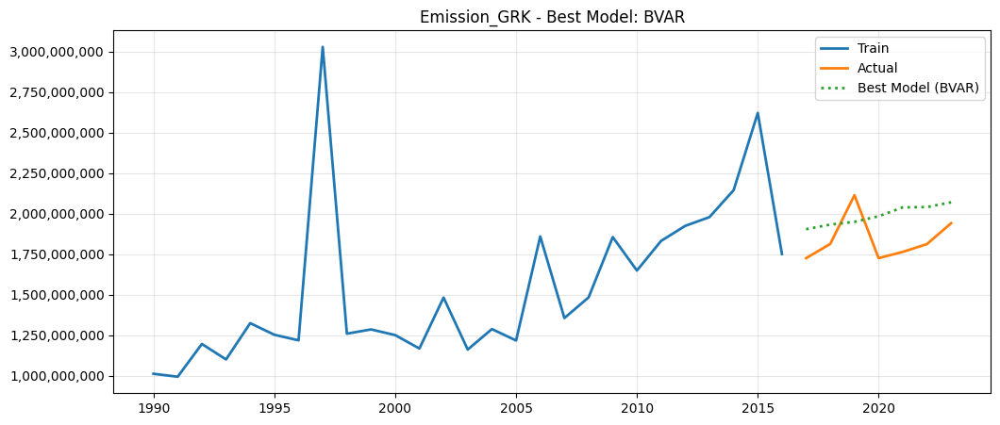

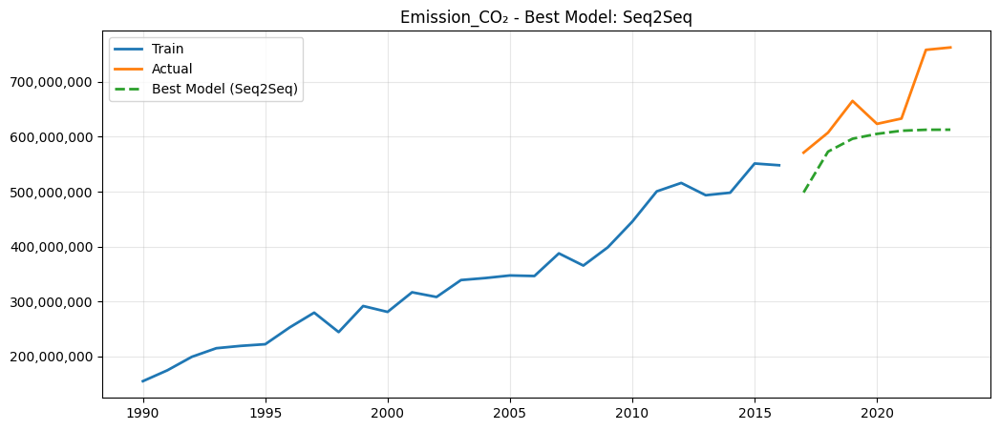

In [ ]:
for col in target_cols:

    best_model = compare_metrics.loc[
        compare_metrics["Variable"] == col, "Best_Model"
    ].values[0]

    plt.figure(figsize=(12,5))
    plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

    # Train
    plt.plot(y_train.index, y_train[col], label="Train", linewidth=2)

    # Actual
    plt.plot(y_test.index, y_test[col], label="Actual", linewidth=2)

    if best_model == "Seq2Seq":
        pred = forecast_df[col]
        style = "--"
    else:
        pred = bvar_forecast[col]
        style = ":"

    plt.plot(
        y_test.index,
        pred,
        linestyle=style,
        label=f"Best Model ({best_model})",
        linewidth=2
    )

    plt.title(f"{col} - Best Model: {best_model}")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

# Forecast & tahun ke depan variable Iklim

In [ ]:
data_iklim

,Year,Emission_CO₂,Emission_GRK,Temperature
0,1990,154990690,1012411400,0.08
1,1991,174754220,994146200,0.21
2,1992,199298020,1196247200,0.20
3,1993,214962850,1100796400,0.20
4,1994,219199950,1324479200,0.31
5,1995,222225300,1252830300,0.34
6,1996,252855740,1218626600,0.36
7,1997,279695600,3027978500,0.38
8,1998,244315330,1259636000,0.97
9,1999,291770660,1285879900,0.23


In [ ]:
#lstm_future_raw = pd.read_csv("forecast_future_iklimlstm.csv")
#bvar_future_raw = pd.read_csv("forecast_future_7years_BVARiklim.csv")

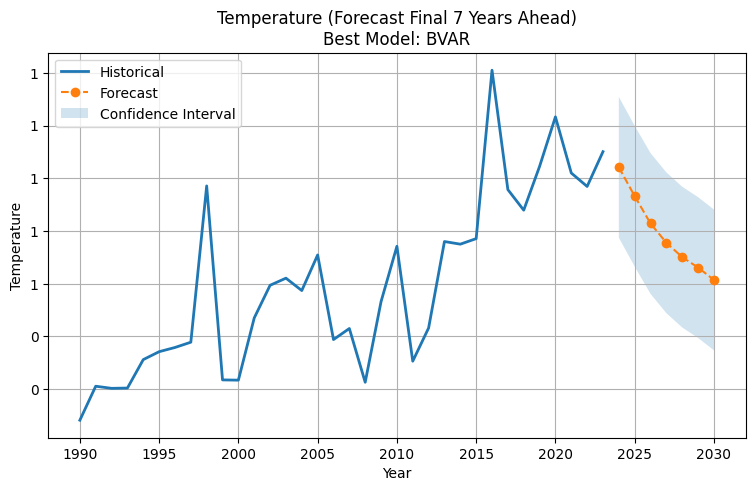

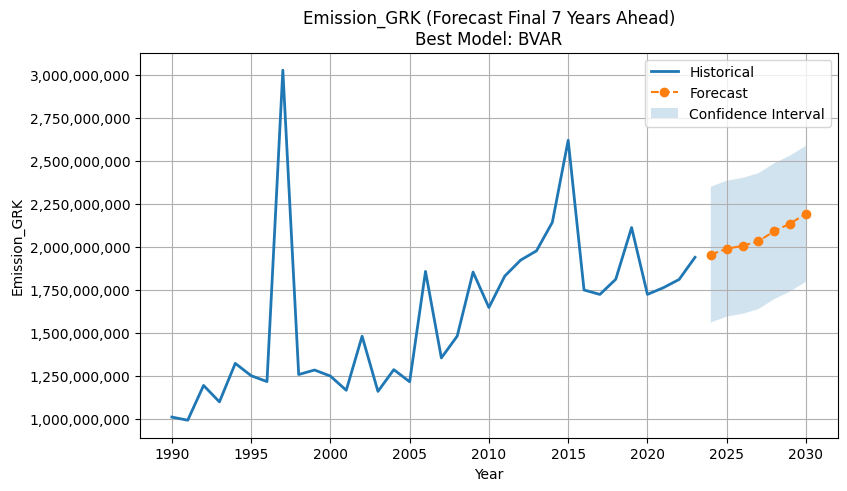

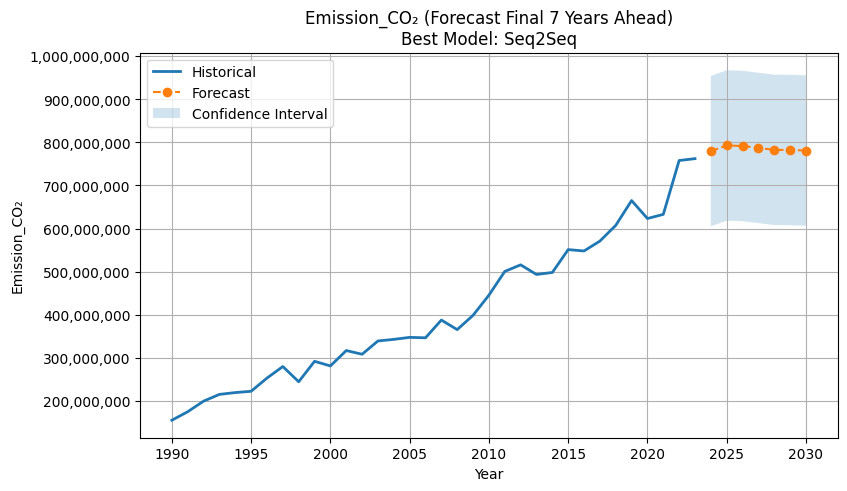

In [ ]:
# ==========================================
# 1. DATA HISTORIS
# ==========================================
df_hist = data_iklim.copy()

# ==========================================
# 2. FORECAST DATA
# ==========================================
seq2seq_future = pd.read_csv("forecast_iklimSeq2Seq.csv")
bvar_future = pd.read_csv("forecast_future_7years_BVARiklim.csv")

# ==========================================
# 3. MAPPING MODEL TERBAIK
# ==========================================
best_model_map = dict(zip(compare_metrics["Variable"], compare_metrics["Best_Model"]))

# ==========================================
# 4. AMBIL FORECAST TERBAIK
# ==========================================
final_forecast_list = []

for var, model in best_model_map.items():
    if model == "Seq2Seq":
        df_var = seq2seq_future[seq2seq_future["Variable"] == var].copy()
    else:
        df_var = bvar_future[bvar_future["Variable"] == var].copy()

    df_var["Model"] = model
    final_forecast_list.append(df_var)

final_forecast = pd.concat(final_forecast_list, ignore_index=True)

# ==========================================
# 5. PLOT PER VARIABLE
# ==========================================
variables = ["Temperature", "Emission_GRK", "Emission_CO₂"]

for var in variables:
    plt.figure(figsize=(9,5))

    # --------------------------
    # HISTORICAL
    # --------------------------
    plt.plot(
        df_hist["Year"],
        df_hist[var],
        label="Historical",
        linewidth=2
    )

    # --------------------------
    # FORECAST
    # --------------------------
    df_f = final_forecast[final_forecast["Variable"] == var]

    plt.plot(
        df_f["Year"],
        df_f["Forecast"],
        linestyle="--",
        marker="o",
        label="Forecast"
    )

    # --------------------------
    # CI
    # --------------------------
    plt.fill_between(
        df_f["Year"],
        df_f["CI_Lower"],
        df_f["CI_Upper"],
        alpha=0.2,
        label="Confidence Interval"
    )

    # --------------------------
    # TITLE & STYLE
    # --------------------------
    model_used = df_f["Model"].iloc[0]

    plt.gca().yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

    plt.title(f"{var} (Forecast Final 7 Years Ahead)\nBest Model: {model_used}")
    plt.xlabel("Year")
    plt.ylabel(var)
    plt.legend()
    plt.grid()

    plt.show()

In [ ]:
# ==========================================
# 1. DATA HISTORIS → LONG FORMAT
# ==========================================
df_hist = data_iklim.copy()

df_hist_long = df_hist.melt(
    id_vars="Year",
    var_name="Variable",
    value_name="Value"
)

df_hist_long["Type"] = "Actual"

# ==========================================
# 2. FORECAST TERBAIK (SUDAH DIBUAT SEBELUMNYA)
# ==========================================
# final_forecast: hasil dari best model selection

# Forecast
df_forecast = final_forecast[["Year", "Variable", "Forecast"]].copy()
df_forecast.rename(columns={"Forecast": "Value"}, inplace=True)
df_forecast["Type"] = "Forecast"

# CI LOWER
df_ci_lower = final_forecast[["Year", "Variable", "CI_Lower"]].copy()
df_ci_lower.rename(columns={"CI_Lower": "Value"}, inplace=True)
df_ci_lower["Type"] = "CI_Lower"

# CI UPPER
df_ci_upper = final_forecast[["Year", "Variable", "CI_Upper"]].copy()
df_ci_upper.rename(columns={"CI_Upper": "Value"}, inplace=True)
df_ci_upper["Type"] = "CI_Upper"

# ==========================================
# 3. GABUNG SEMUA
# ==========================================
df_final_long = pd.concat(
    [df_hist_long, df_forecast, df_ci_lower, df_ci_upper],
    ignore_index=True
)

# ==========================================
# 4. SORTING (BIAR RAPI DI TABLEAU)
# ==========================================
df_final_long = df_final_long.sort_values(
    ["Variable", "Year", "Type"]
).reset_index(drop=True)

# ==========================================
# 5. HASIL AKHIR
# ==========================================
print("=== DATA LONG FORMAT SIAP TABLEAU ===")
df_final_long.head(20)

=== DATA LONG FORMAT SIAP TABLEAU ===


,Year,Variable,Value,Type
0,1990,Emission_CO₂,154990690.00,Actual
1,1991,Emission_CO₂,174754220.00,Actual
2,1992,Emission_CO₂,199298020.00,Actual
3,1993,Emission_CO₂,214962850.00,Actual
4,1994,Emission_CO₂,219199950.00,Actual
5,1995,Emission_CO₂,222225300.00,Actual
6,1996,Emission_CO₂,252855740.00,Actual
7,1997,Emission_CO₂,279695600.00,Actual
8,1998,Emission_CO₂,244315330.00,Actual
9,1999,Emission_CO₂,291770660.00,Actual


In [ ]:
df_final_long.to_csv("Forecast_Iklim_Bestmodel.csv", index=False)
df_final_long.to_excel("Forecast_Iklim_Bestmodel.xlsx", index=False)

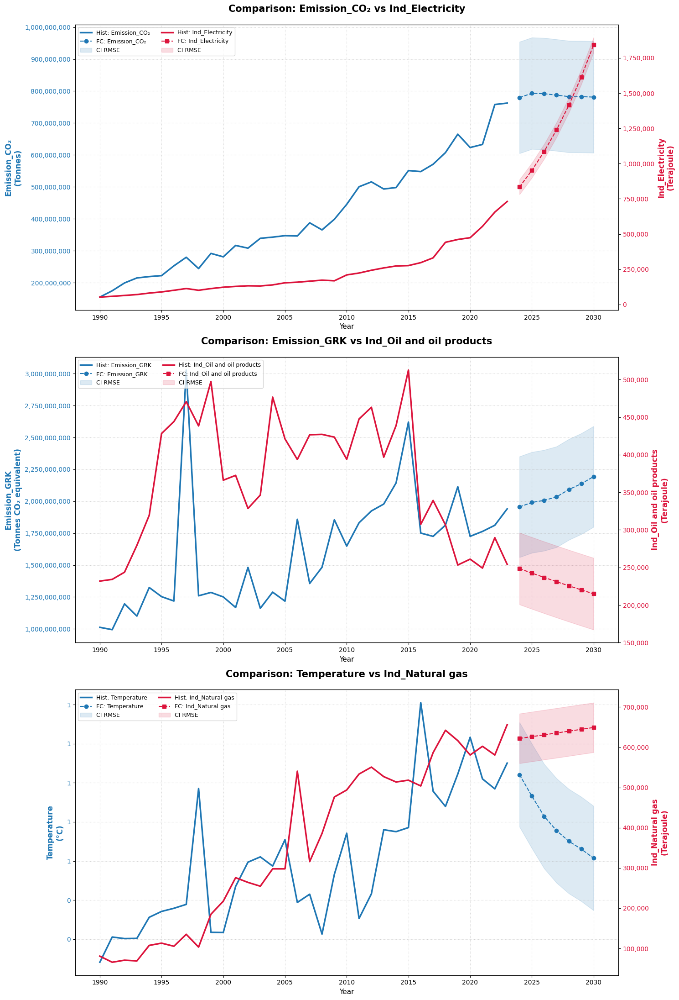

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FuncFormatter

# 1. SETUP DATA
df_c_plot = data_iklim.copy()
df_energy_all = final_tableau_df.copy()

# 2. DICTIONARY SATUAN (Mapping Label Sumbu Y)
units_map = {
    "Emission_CO₂": "Tonnes",
    "Emission_GRK": "Tonnes CO₂ equivalent",
    "Temperature": "°C",
    "Ind_Oil and oil products": "Terajoule",
    "Ind_Natural gas": "Terajoule",
    "Ind_Electricity": "Terajoule"
}

# 3. DEFINISI PAIRS
pairs = [
    ("Emission_CO₂", "Ind_Electricity"),
    ("Emission_GRK", "Ind_Oil and oil products"),
    ("Temperature", "Ind_Natural gas")
]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 22))

for i, (var_climate, var_energy) in enumerate(pairs):
    ax1 = axes[i]
    ax2 = ax1.twinx()

    # --- A. DATA IKLIM (BIRU) ---
    color_c = 'tab:blue'
    ax1.plot(df_c_plot["Year"], df_c_plot[var_climate], color=color_c, linewidth=2.5, label=f'Hist: {var_climate}')

    if "Variable" in final_forecast.columns:
        df_f_c = final_forecast[final_forecast["Variable"] == var_climate]
        if not df_f_c.empty:
            ax1.plot(df_f_c["Year"], df_f_c["Forecast"], color=color_c, linestyle="--", marker="o", label=f'FC: {var_climate}')
            ax1.fill_between(df_f_c["Year"], df_f_c["CI_Lower"], df_f_c["CI_Upper"], color=color_c, alpha=0.15, label='CI RMSE')

    # AMBIL SATUAN IKLIM
    unit_c = units_map.get(var_climate, "")
    ax1.set_ylabel(f"{var_climate}\n({unit_c})", color=color_c, fontsize=12, fontweight='bold')
    ax1.tick_params(axis='y', labelcolor=color_c)

    # --- B. DATA ENERGI (MERAH) ---
    color_e = 'crimson'
    df_e_sub = df_energy_all[df_energy_all["Variable"] == var_energy]

    # Plot Hist & Forecast
    df_e_hist = df_e_sub[df_e_sub["Type"] == "Actual"]
    ax2.plot(df_e_hist["Year"], df_e_hist["Value"], color=color_e, linewidth=2.5, label=f'Hist: {var_energy}')

    df_e_fc = df_e_sub[df_e_sub["Type"] == "Forecast"]
    if not df_e_fc.empty:
        ax2.plot(df_e_fc["Year"], df_e_fc["Value"], color=color_e, linestyle="--", marker="s", label=f'FC: {var_energy}')
        df_low = df_e_sub[df_e_sub["Type"] == "Lower_95"].sort_values("Year")
        df_upp = df_e_sub[df_e_sub["Type"] == "Upper_95"].sort_values("Year")
        if not df_low.empty and not df_upp.empty:
            ax2.fill_between(df_e_fc["Year"], df_low["Value"], df_upp["Value"], color=color_e, alpha=0.15, label='CI RMSE')

    # AMBIL SATUAN ENERGI
    unit_e = units_map.get(var_energy, "Terajoule")
    ax2.set_ylabel(f"{var_energy}\n({unit_e})", color=color_e, fontsize=12, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor=color_e)

    # --- C. STYLING ---
    ax1.set_title(f"Comparison: {var_climate} vs {var_energy}", fontsize=15, fontweight='bold', pad=20)
    ax1.set_xlabel("Year", fontsize=11)
    ax1.grid(True, linestyle=':', alpha=0.6)

    # Formatter Ribuan
    ax1.yaxis.set_major_formatter(FuncFormatter(lambda x, p: f'{x:,.0f}'))
    ax2.yaxis.set_major_formatter(FuncFormatter(lambda x, p: f'{x:,.0f}'))

    # Legend
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1+h2, l1+l2, loc='upper left', fontsize=9, ncol=2)

plt.tight_layout()
plt.show()

In [ ]:
print(df.columns.tolist())

['Temperature', 'Emission_GRK', 'Emission_CO₂', 'Kom_Biofuels and waste', 'Ind_Coal and coal products', 'Ind_Oil and oil products', 'RT_Natural gas', 'Ind_Natural gas']
